In [43]:
# Import packages

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.integrate import solve_ivp

plt.style.use('seaborn-poster')

%matplotlib inline

In [2]:
# Initialize mirror parameters

x0 = 2.0
y0 = 1.0

x1 = 1.8
y1 = 1.0
x2= 2.0
y2 = 0.875

x_values = [x1, x2]
y_values = [y1, y2]




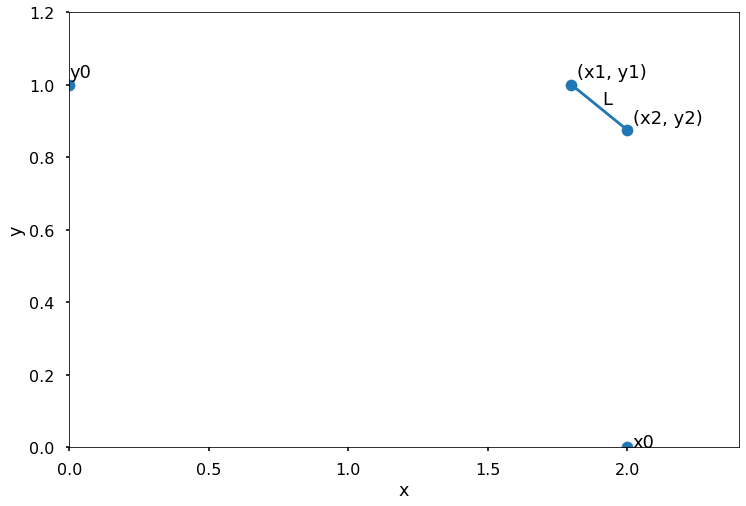

In [3]:
plt.figure(figsize = (12,8))
plt.xlabel('x')
plt.ylabel('y')
plt.scatter([x0, 0, x1, x2], [0, y0, y1, y2])
plt.annotate("x0", (x0 + 0.02, 0), fontsize = 18)
plt.annotate("y0", (0, y0 + 0.02), fontsize = 18)
plt.annotate("(x1, y1)", (x1 + 0.02, y1 + 0.02), fontsize = 18)
plt.annotate("(x2, y2)", (x2 + 0.02, y2 + 0.02), fontsize = 18)
plt.annotate("L", ((x1 + x2 + 0.02) /2, (y1 + y2 + 0.02)/2), fontsize = 18)
plt.plot(x_values, y_values)
plt.xlim(0, 2.4)
plt.ylim(0, 1.2)
plt.show()

In [4]:
# Calculate CPV cell length from coordiantes of the mirror endpoints

L = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

In [5]:
# Define ODE

F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))

$$y' = -\cot\left(\frac{\pi}{4} + \frac{1}{2}\arctan\left(\frac{(x_0L-xL)x_1+xLx_2-x_0Lx}{(x_0L-xL)y_1+xLy_2-x_0Ly}\right)\right), \quad y(0) = y_0$$

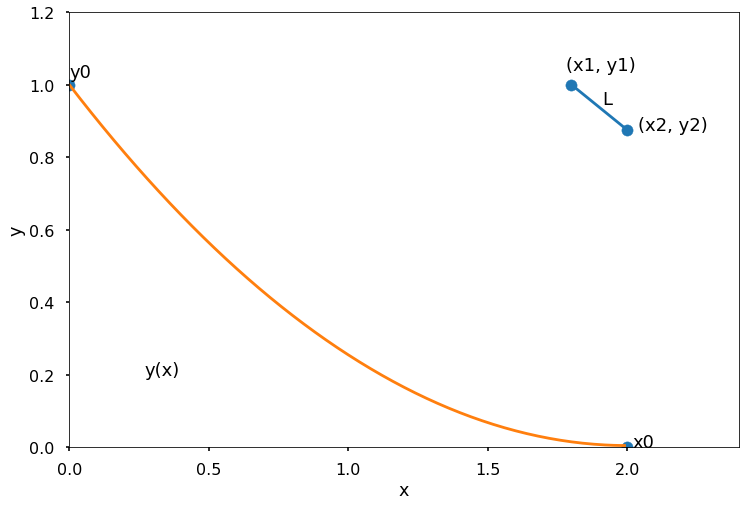

In [6]:
# Numerically solve the ODE corresponding to the mirror shape

dt = 0.01

t_eval = np.arange(0, x0, dt)
sol = solve_ivp(F, [0, x0 - dt], [y0], t_eval=t_eval)

plt.figure(figsize = (12,8))
plt.plot(x_values, y_values)
plt.plot(sol.t, sol.y[0])
plt.xlabel('x')
plt.ylabel('y')
plt.scatter([x0, 0, x1, x2], [0, y0, y1, y2])
plt.annotate("x0", (x0 + 0.02, 0), fontsize = 18)
plt.annotate("y0", (0, y0+0.02), fontsize = 18)
plt.annotate("(x1, y1)", (x1 - 0.02, y1 + 0.04), fontsize = 18)
plt.annotate("(x2, y2)", (x2 + 0.04, y2), fontsize = 18)
plt.annotate("L", ((x1 + x2 + 0.02) /2, (y1 + y2 + 0.02)/2), fontsize = 18)
plt.annotate("y(x)", (0.27, 0.2), fontsize = 18)
plt.xlim(0, 2.4)
plt.ylim(0, 1.2)
plt.show()

In [7]:
z_2 = np.polyfit(sol.t, sol.y[0], 2, rcond=None, full=False, w=None, cov=False)
p_2 = np.poly1d(z_2)

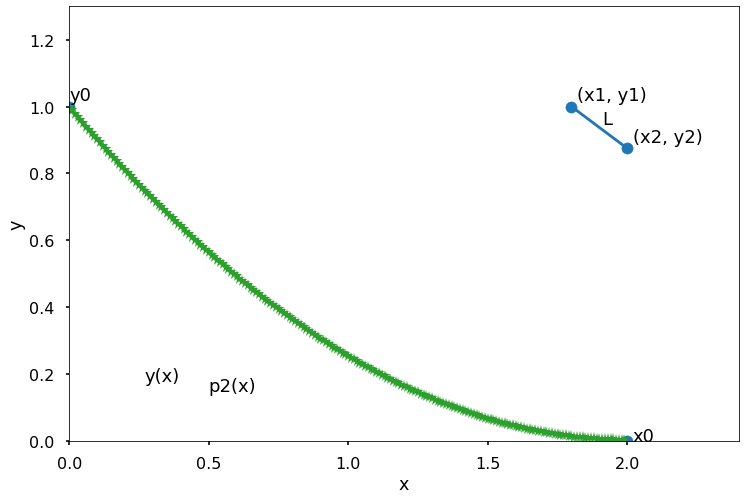

In [8]:
plt.figure(figsize = (12,8))
plt.plot(x_values, y_values)
plt.plot(sol.t, sol.y[0])
plt.xlabel('x')
plt.ylabel('y')
plt.scatter([x0, 0, x1, x2], [0, y0, y1, y2])
plt.annotate("x0", (x0 + 0.02, 0), fontsize = 18)
plt.annotate("y0", (0, y0+0.02), fontsize = 18)
plt.annotate("(x1, y1)", (x1 + 0.02, y1 + 0.02), fontsize = 18)
plt.annotate("(x2, y2)", (x2 + 0.02, y2 + 0.02), fontsize = 18)
plt.annotate("L", ((x1 + x2 + 0.02) /2, (y1 + y2 + 0.02)/2), fontsize = 18)
plt.annotate("y(x)", (0.27, 0.18), fontsize = 18)
plt.annotate("p2(x)", (0.5, 0.15), fontsize = 18)
plt.xlim(0, 2.4)
plt.ylim(0, 1.3)
_ = plt.plot(sol.t, p_2(sol.t), '*') #, sol.t, p_5(sol.t), "*")
plt.show()

In [9]:
# Define metrics for comparing two curves
    
def norm(v_1, v_2, norm, dt):
    v1 = np.array(v_1)
    v2 = np.array(v_2)
    v_diff = v1 - v2
    if norm == "L1":
        return np.sum(np.abs(v_diff), 'all') / len(v_diff[0])
    elif norm == "L2":
        return np.sum(np.power(v_diff, 2), 'all') / len(v_diff[0])
    elif norm == "sup":
        return np.max(abs(v_diff))

In [34]:
# Create summary table for mirror statistics

statistics = np.zeros((576, 9))

Trial 1: L = 0.10, angle = 0.00 pi, (x1, y1) = (1.50, 0.60)


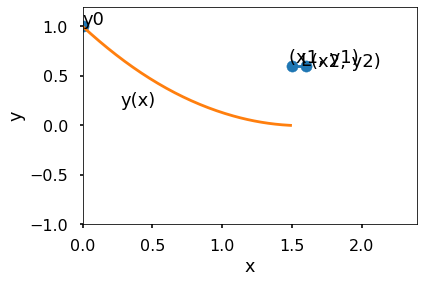

Trial 2: L = 0.20, angle = 0.00 pi, (x1, y1) = (1.50, 0.60)


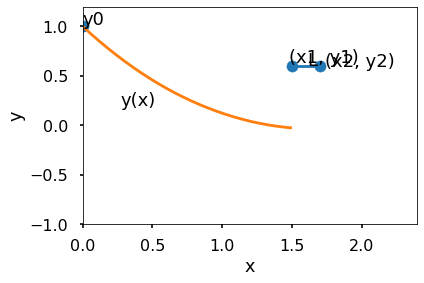

Trial 3: L = 0.30, angle = 0.00 pi, (x1, y1) = (1.50, 0.60)


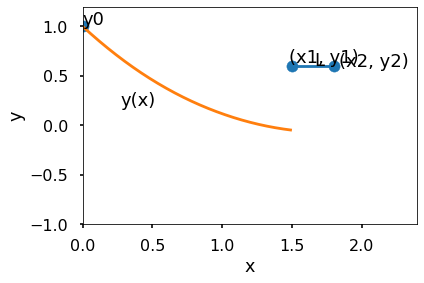

Trial 4: L = 0.40, angle = 0.00 pi, (x1, y1) = (1.50, 0.60)


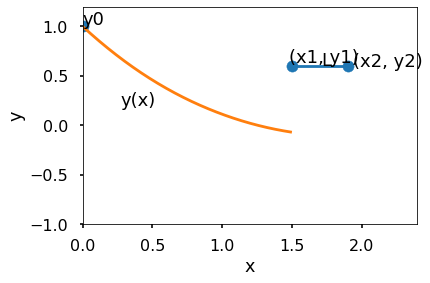

Trial 5: L = 0.50, angle = 0.00 pi, (x1, y1) = (1.50, 0.60)


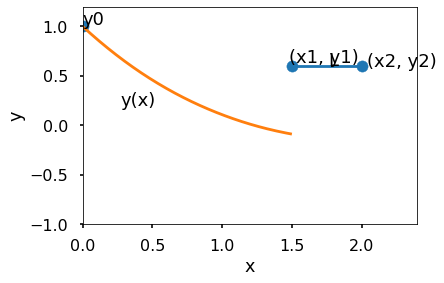

Trial 6: L = 0.60, angle = 0.00 pi, (x1, y1) = (1.50, 0.60)


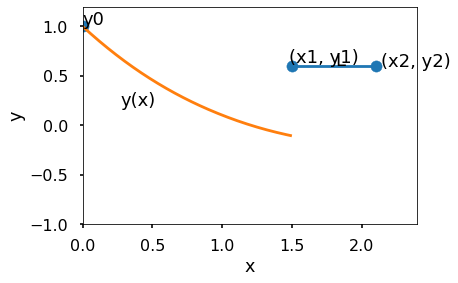

Trial 7: L = 0.10, angle = 0.17 pi, (x1, y1) = (1.50, 0.60)


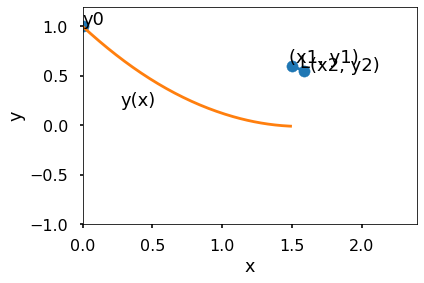

Trial 8: L = 0.20, angle = 0.17 pi, (x1, y1) = (1.50, 0.60)


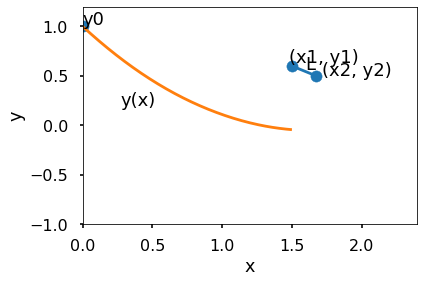

Trial 9: L = 0.30, angle = 0.17 pi, (x1, y1) = (1.50, 0.60)


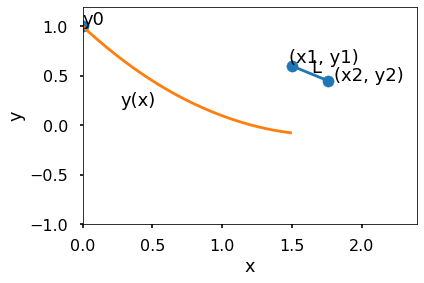

Trial 10: L = 0.40, angle = 0.17 pi, (x1, y1) = (1.50, 0.60)


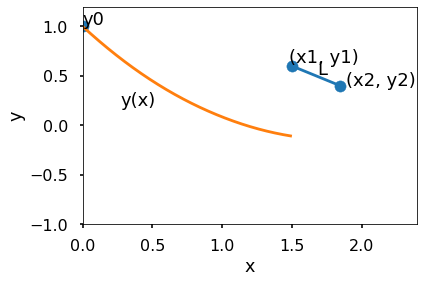

Trial 11: L = 0.50, angle = 0.17 pi, (x1, y1) = (1.50, 0.60)


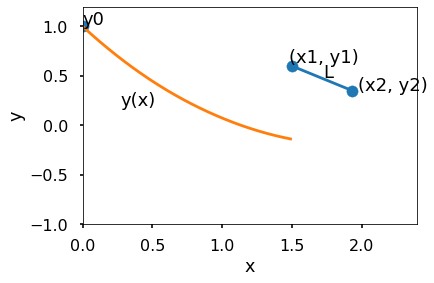

Trial 12: L = 0.60, angle = 0.17 pi, (x1, y1) = (1.50, 0.60)


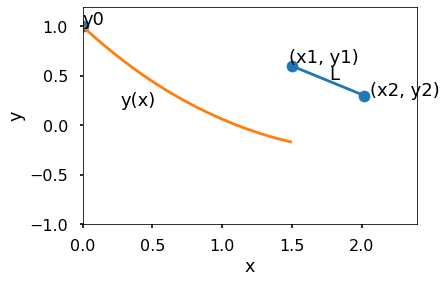

Trial 13: L = 0.10, angle = 0.20 pi, (x1, y1) = (1.50, 0.60)


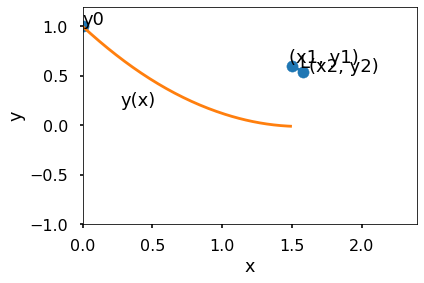

Trial 14: L = 0.20, angle = 0.20 pi, (x1, y1) = (1.50, 0.60)


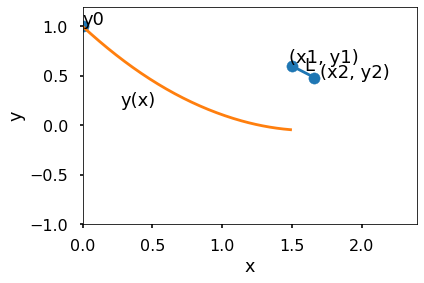

Trial 15: L = 0.30, angle = 0.20 pi, (x1, y1) = (1.50, 0.60)


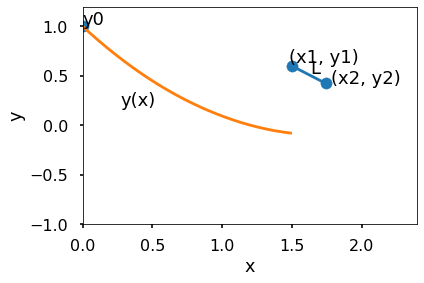

Trial 16: L = 0.40, angle = 0.20 pi, (x1, y1) = (1.50, 0.60)


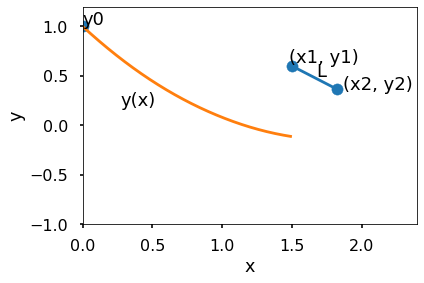

Trial 17: L = 0.50, angle = 0.20 pi, (x1, y1) = (1.50, 0.60)


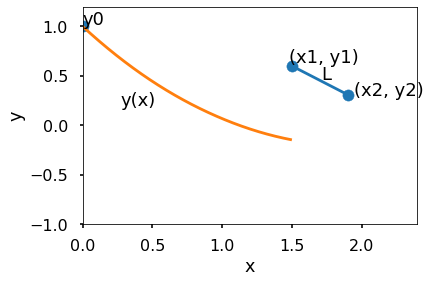

Trial 18: L = 0.60, angle = 0.20 pi, (x1, y1) = (1.50, 0.60)


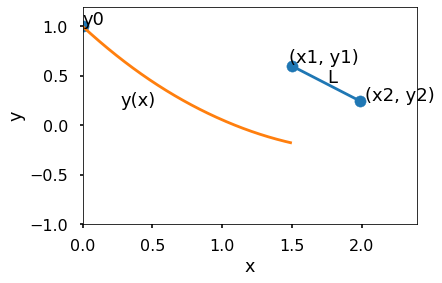

Trial 19: L = 0.10, angle = 0.25 pi, (x1, y1) = (1.50, 0.60)


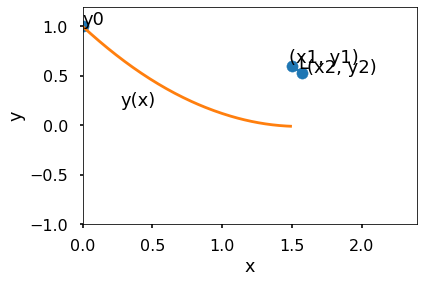

Trial 20: L = 0.20, angle = 0.25 pi, (x1, y1) = (1.50, 0.60)


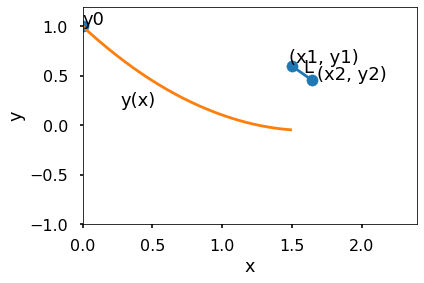

Trial 21: L = 0.30, angle = 0.25 pi, (x1, y1) = (1.50, 0.60)


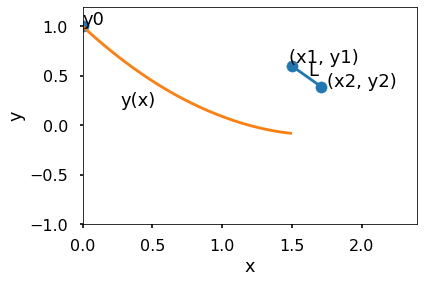

Trial 22: L = 0.40, angle = 0.25 pi, (x1, y1) = (1.50, 0.60)


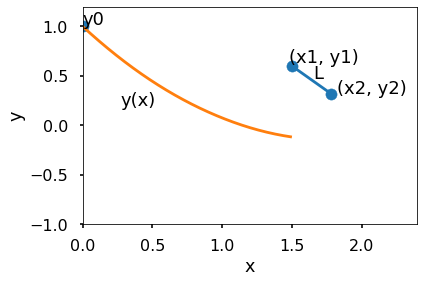

Trial 23: L = 0.50, angle = 0.25 pi, (x1, y1) = (1.50, 0.60)


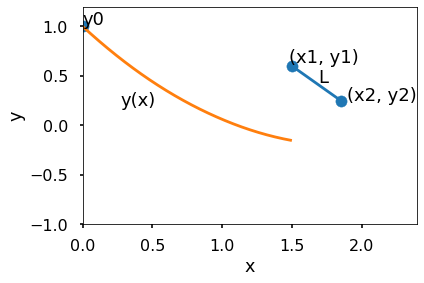

Trial 24: L = 0.60, angle = 0.25 pi, (x1, y1) = (1.50, 0.60)


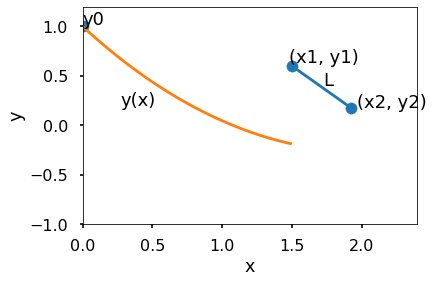

Trial 25: L = 0.10, angle = 0.33 pi, (x1, y1) = (1.50, 0.60)


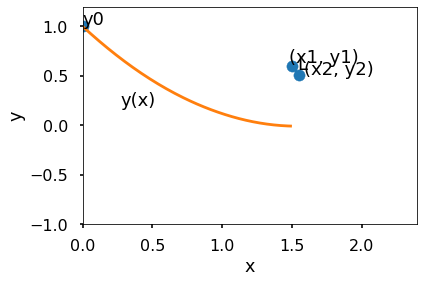

Trial 26: L = 0.20, angle = 0.33 pi, (x1, y1) = (1.50, 0.60)


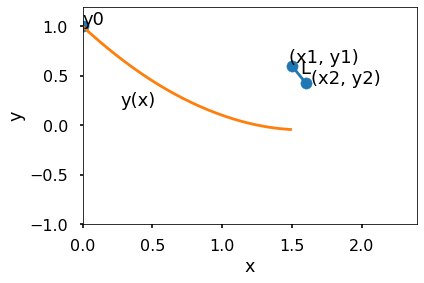

Trial 27: L = 0.30, angle = 0.33 pi, (x1, y1) = (1.50, 0.60)


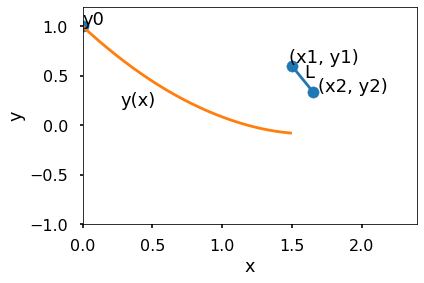

Trial 28: L = 0.40, angle = 0.33 pi, (x1, y1) = (1.50, 0.60)


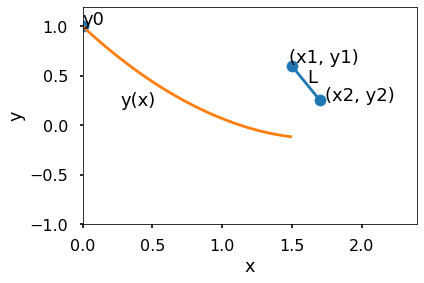

Trial 29: L = 0.50, angle = 0.33 pi, (x1, y1) = (1.50, 0.60)


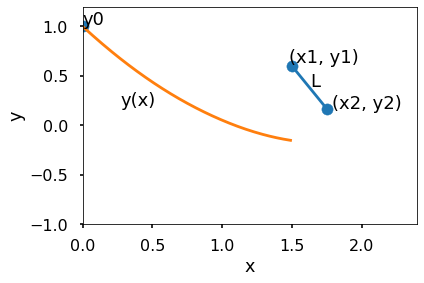

Trial 30: L = 0.60, angle = 0.33 pi, (x1, y1) = (1.50, 0.60)


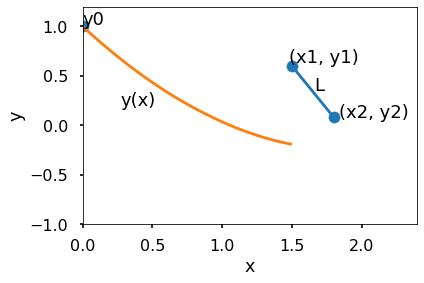

Trial 31: L = 0.10, angle = 0.50 pi, (x1, y1) = (1.50, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


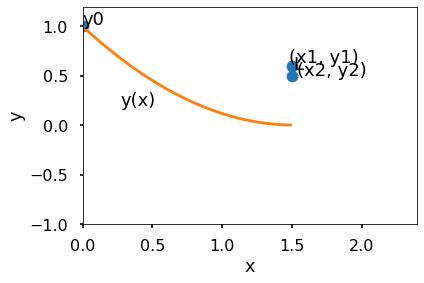

Trial 32: L = 0.20, angle = 0.50 pi, (x1, y1) = (1.50, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


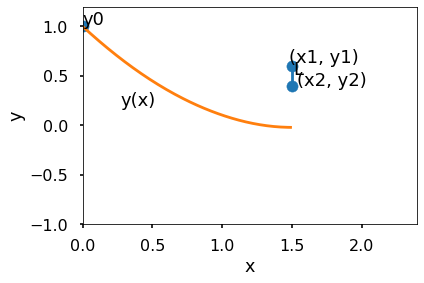

Trial 33: L = 0.30, angle = 0.50 pi, (x1, y1) = (1.50, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


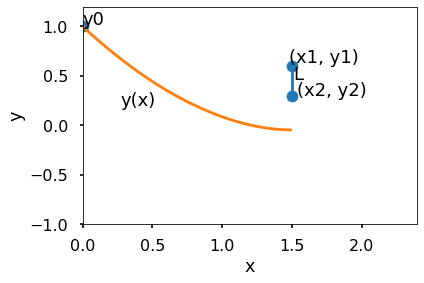

Trial 34: L = 0.40, angle = 0.50 pi, (x1, y1) = (1.50, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


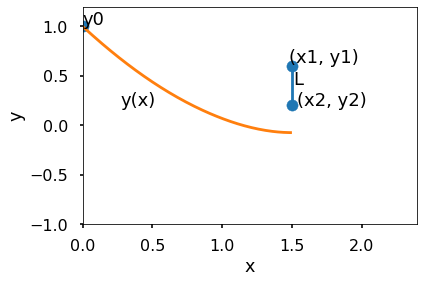

Trial 35: L = 0.50, angle = 0.50 pi, (x1, y1) = (1.50, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


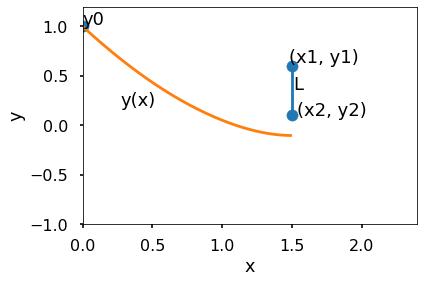

Trial 36: L = 0.60, angle = 0.50 pi, (x1, y1) = (1.50, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


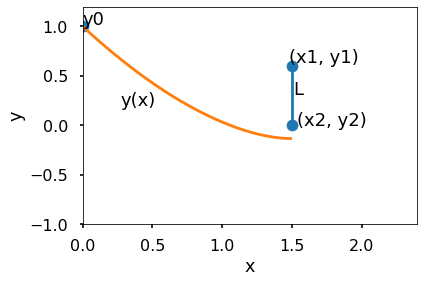

Trial 37: L = 0.10, angle = 0.00 pi, (x1, y1) = (1.50, 0.80)


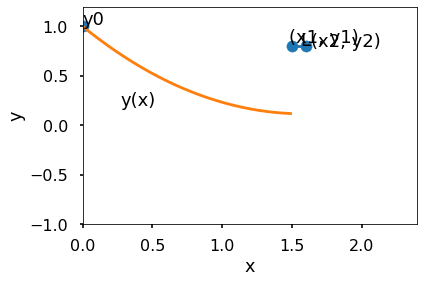

Trial 38: L = 0.20, angle = 0.00 pi, (x1, y1) = (1.50, 0.80)


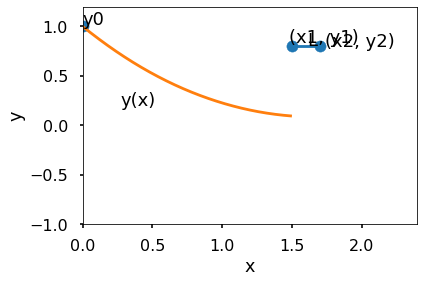

Trial 39: L = 0.30, angle = 0.00 pi, (x1, y1) = (1.50, 0.80)


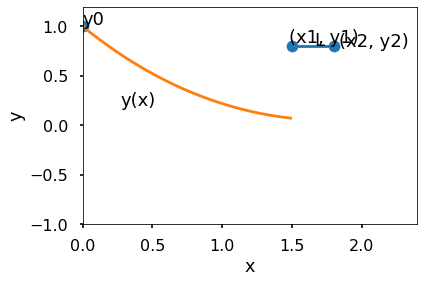

Trial 40: L = 0.40, angle = 0.00 pi, (x1, y1) = (1.50, 0.80)


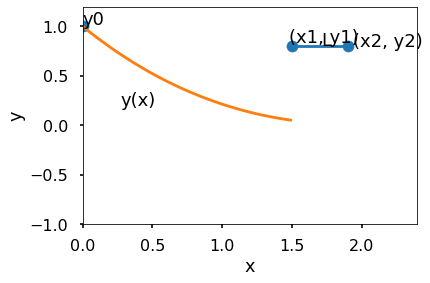

Trial 41: L = 0.50, angle = 0.00 pi, (x1, y1) = (1.50, 0.80)


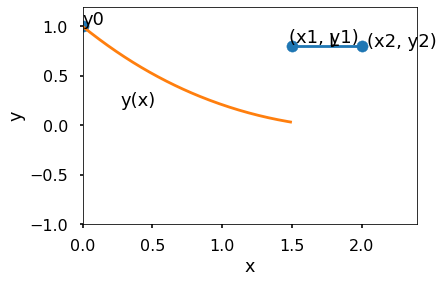

Trial 42: L = 0.60, angle = 0.00 pi, (x1, y1) = (1.50, 0.80)


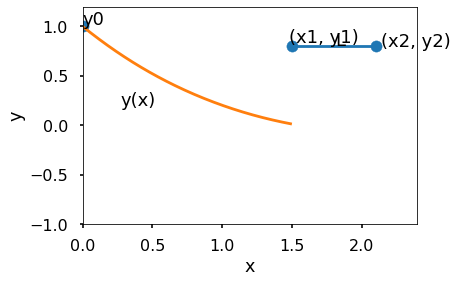

Trial 43: L = 0.10, angle = 0.17 pi, (x1, y1) = (1.50, 0.80)


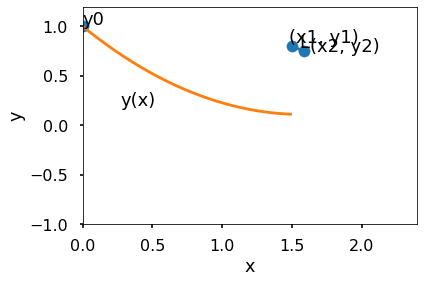

Trial 44: L = 0.20, angle = 0.17 pi, (x1, y1) = (1.50, 0.80)


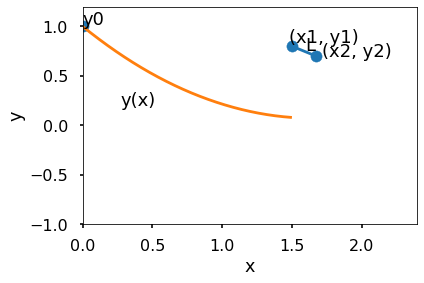

Trial 45: L = 0.30, angle = 0.17 pi, (x1, y1) = (1.50, 0.80)


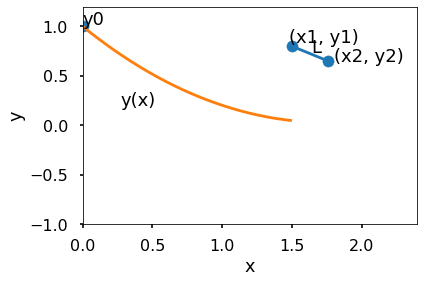

Trial 46: L = 0.40, angle = 0.17 pi, (x1, y1) = (1.50, 0.80)


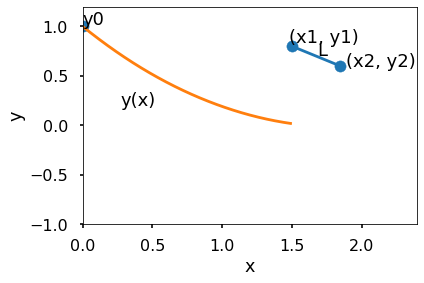

Trial 47: L = 0.50, angle = 0.17 pi, (x1, y1) = (1.50, 0.80)


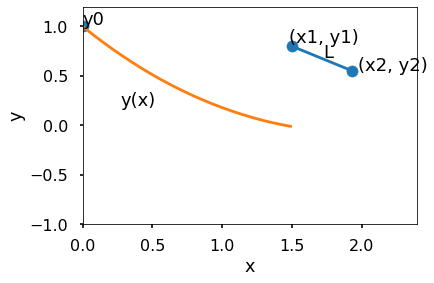

Trial 48: L = 0.60, angle = 0.17 pi, (x1, y1) = (1.50, 0.80)


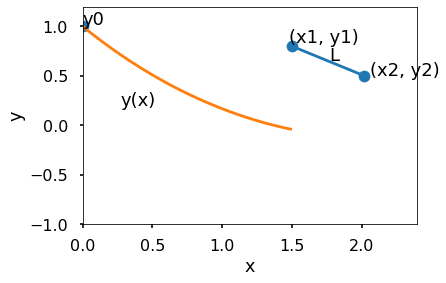

Trial 49: L = 0.10, angle = 0.20 pi, (x1, y1) = (1.50, 0.80)


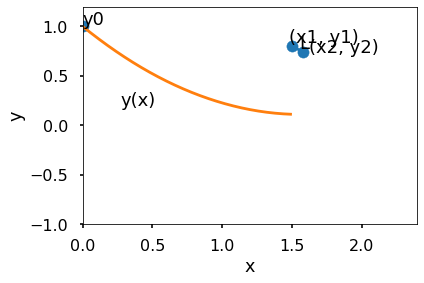

Trial 50: L = 0.20, angle = 0.20 pi, (x1, y1) = (1.50, 0.80)


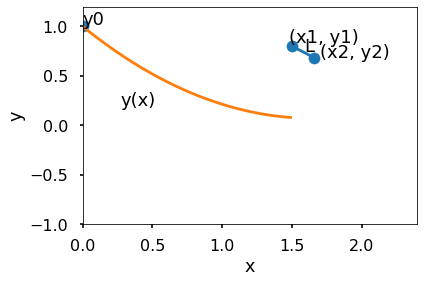

Trial 51: L = 0.30, angle = 0.20 pi, (x1, y1) = (1.50, 0.80)


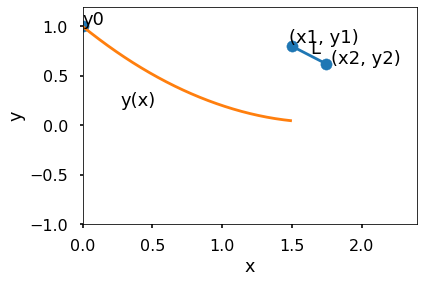

Trial 52: L = 0.40, angle = 0.20 pi, (x1, y1) = (1.50, 0.80)


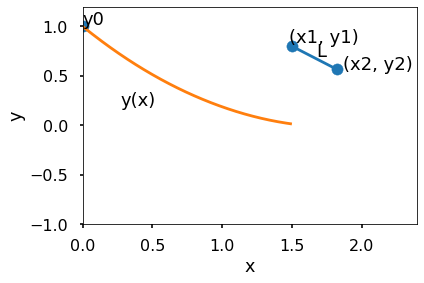

Trial 53: L = 0.50, angle = 0.20 pi, (x1, y1) = (1.50, 0.80)


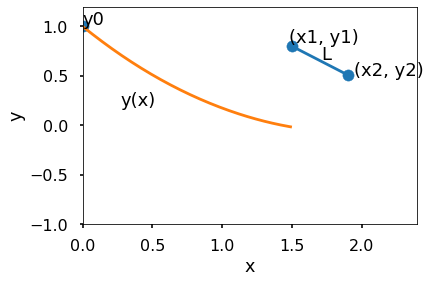

Trial 54: L = 0.60, angle = 0.20 pi, (x1, y1) = (1.50, 0.80)


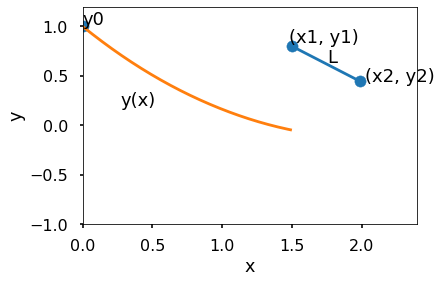

Trial 55: L = 0.10, angle = 0.25 pi, (x1, y1) = (1.50, 0.80)


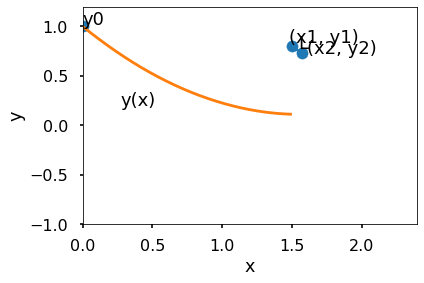

Trial 56: L = 0.20, angle = 0.25 pi, (x1, y1) = (1.50, 0.80)


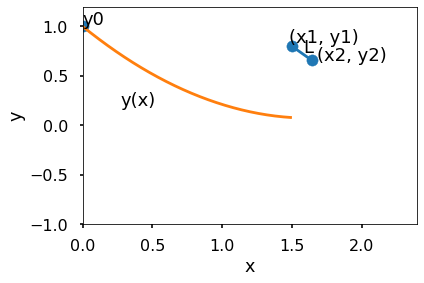

Trial 57: L = 0.30, angle = 0.25 pi, (x1, y1) = (1.50, 0.80)


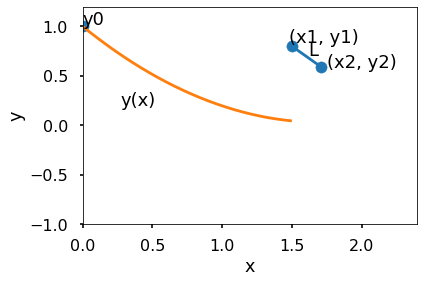

Trial 58: L = 0.40, angle = 0.25 pi, (x1, y1) = (1.50, 0.80)


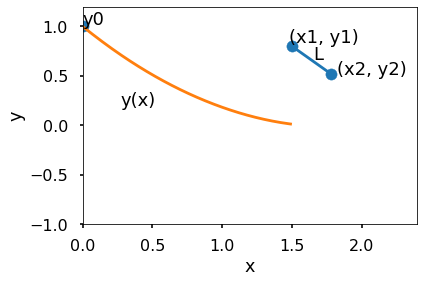

Trial 59: L = 0.50, angle = 0.25 pi, (x1, y1) = (1.50, 0.80)


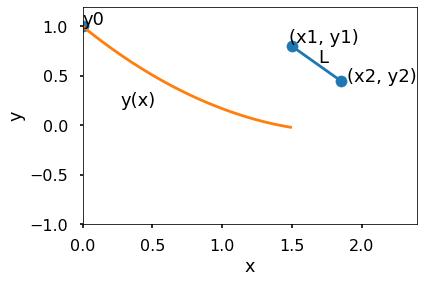

Trial 60: L = 0.60, angle = 0.25 pi, (x1, y1) = (1.50, 0.80)


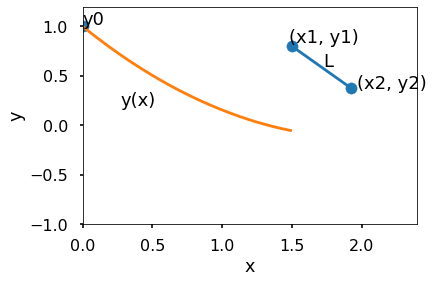

Trial 61: L = 0.10, angle = 0.33 pi, (x1, y1) = (1.50, 0.80)


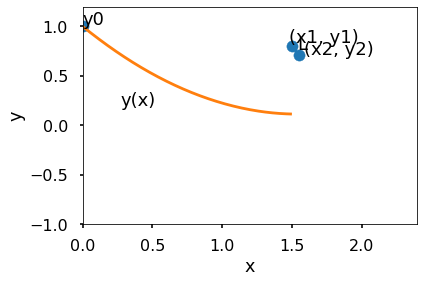

Trial 62: L = 0.20, angle = 0.33 pi, (x1, y1) = (1.50, 0.80)


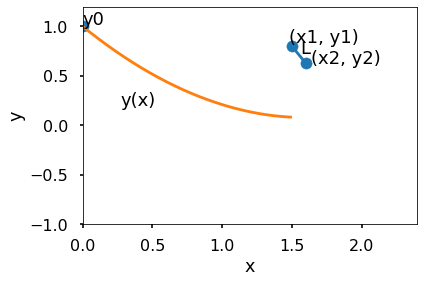

Trial 63: L = 0.30, angle = 0.33 pi, (x1, y1) = (1.50, 0.80)


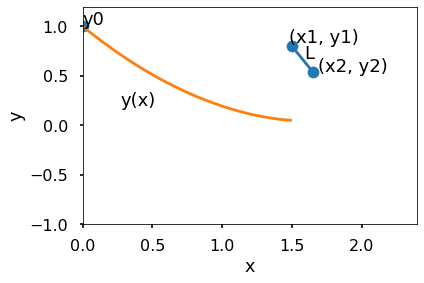

Trial 64: L = 0.40, angle = 0.33 pi, (x1, y1) = (1.50, 0.80)


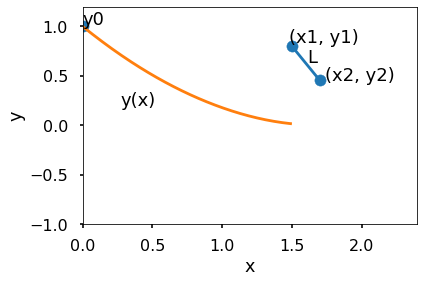

Trial 65: L = 0.50, angle = 0.33 pi, (x1, y1) = (1.50, 0.80)


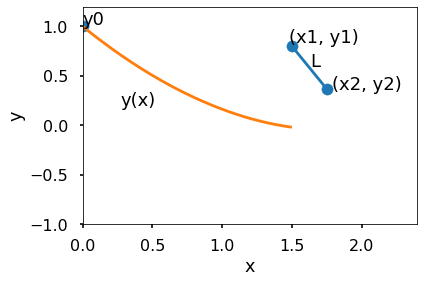

Trial 66: L = 0.60, angle = 0.33 pi, (x1, y1) = (1.50, 0.80)


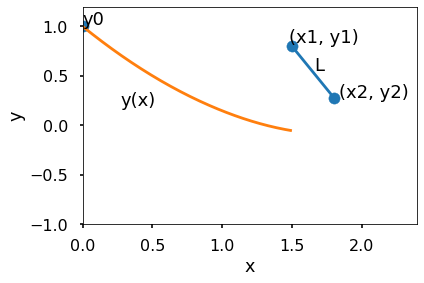

Trial 67: L = 0.10, angle = 0.50 pi, (x1, y1) = (1.50, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


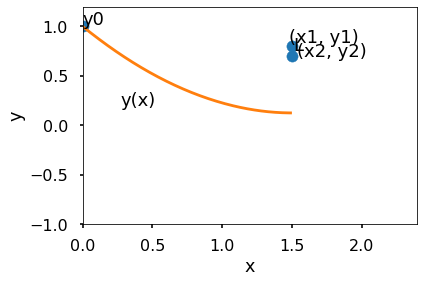

Trial 68: L = 0.20, angle = 0.50 pi, (x1, y1) = (1.50, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


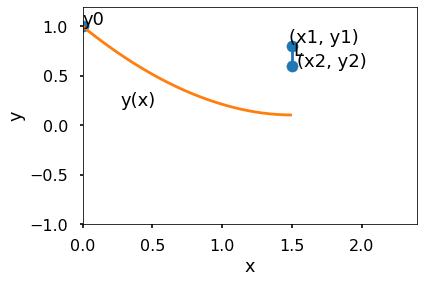

Trial 69: L = 0.30, angle = 0.50 pi, (x1, y1) = (1.50, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


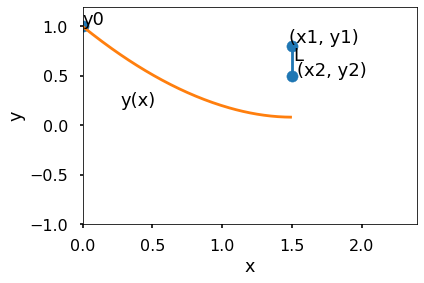

Trial 70: L = 0.40, angle = 0.50 pi, (x1, y1) = (1.50, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


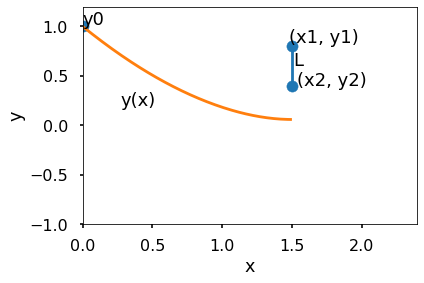

Trial 71: L = 0.50, angle = 0.50 pi, (x1, y1) = (1.50, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


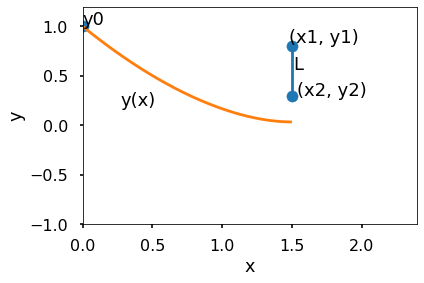

Trial 72: L = 0.60, angle = 0.50 pi, (x1, y1) = (1.50, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


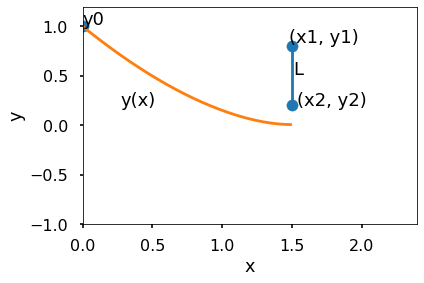

Trial 73: L = 0.10, angle = 0.00 pi, (x1, y1) = (1.50, 1.00)


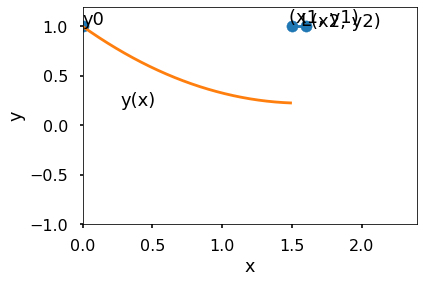

Trial 74: L = 0.20, angle = 0.00 pi, (x1, y1) = (1.50, 1.00)


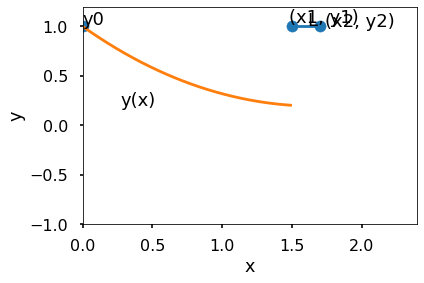

Trial 75: L = 0.30, angle = 0.00 pi, (x1, y1) = (1.50, 1.00)


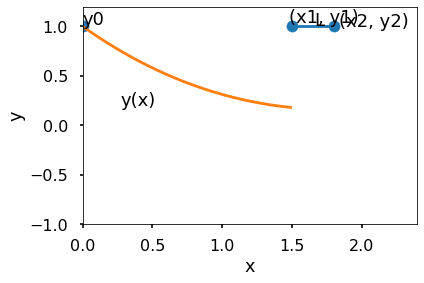

Trial 76: L = 0.40, angle = 0.00 pi, (x1, y1) = (1.50, 1.00)


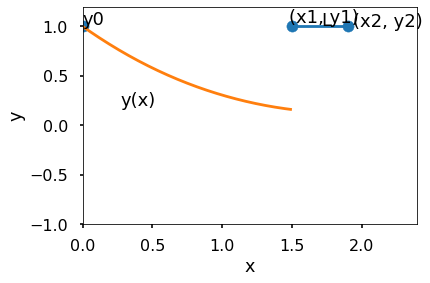

Trial 77: L = 0.50, angle = 0.00 pi, (x1, y1) = (1.50, 1.00)


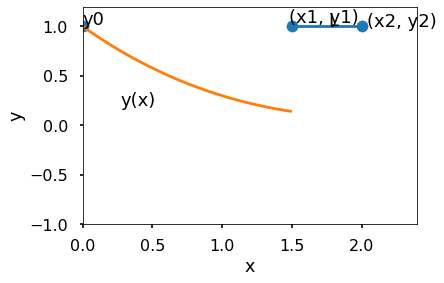

Trial 78: L = 0.60, angle = 0.00 pi, (x1, y1) = (1.50, 1.00)


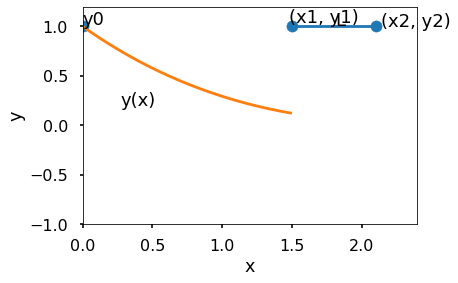

Trial 79: L = 0.10, angle = 0.17 pi, (x1, y1) = (1.50, 1.00)


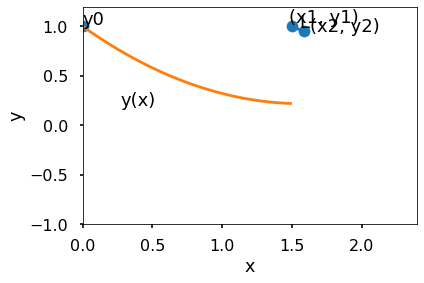

Trial 80: L = 0.20, angle = 0.17 pi, (x1, y1) = (1.50, 1.00)


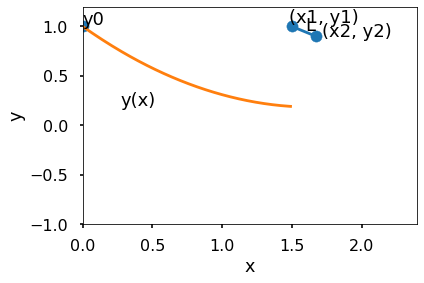

Trial 81: L = 0.30, angle = 0.17 pi, (x1, y1) = (1.50, 1.00)


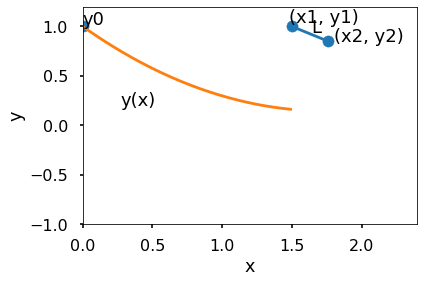

Trial 82: L = 0.40, angle = 0.17 pi, (x1, y1) = (1.50, 1.00)


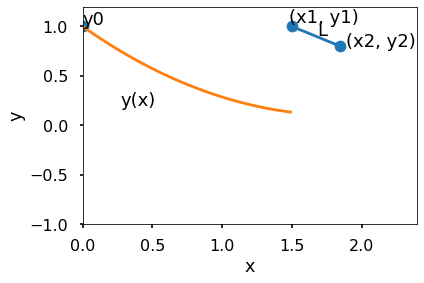

Trial 83: L = 0.50, angle = 0.17 pi, (x1, y1) = (1.50, 1.00)


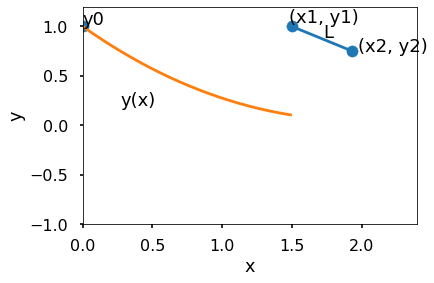

Trial 84: L = 0.60, angle = 0.17 pi, (x1, y1) = (1.50, 1.00)


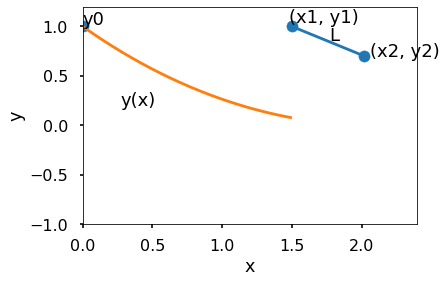

Trial 85: L = 0.10, angle = 0.20 pi, (x1, y1) = (1.50, 1.00)


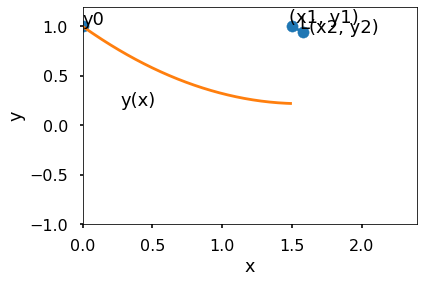

Trial 86: L = 0.20, angle = 0.20 pi, (x1, y1) = (1.50, 1.00)


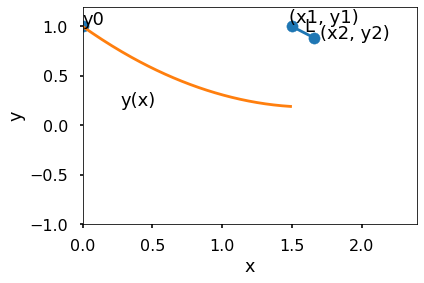

Trial 87: L = 0.30, angle = 0.20 pi, (x1, y1) = (1.50, 1.00)


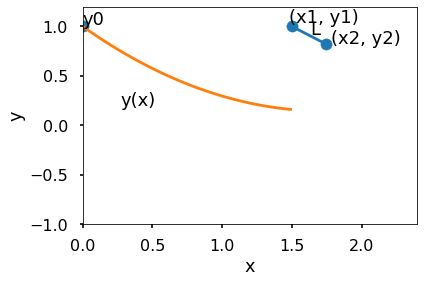

Trial 88: L = 0.40, angle = 0.20 pi, (x1, y1) = (1.50, 1.00)


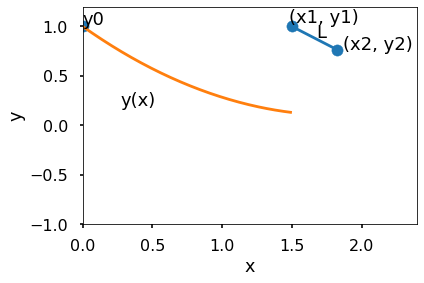

Trial 89: L = 0.50, angle = 0.20 pi, (x1, y1) = (1.50, 1.00)


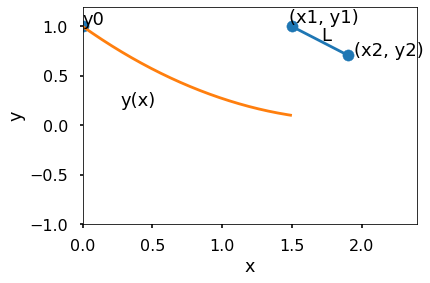

Trial 90: L = 0.60, angle = 0.20 pi, (x1, y1) = (1.50, 1.00)


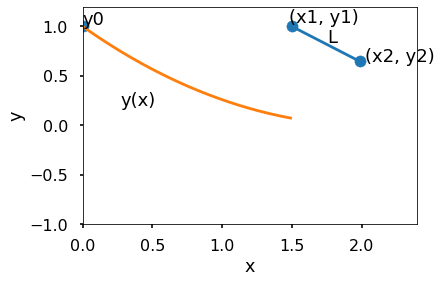

Trial 91: L = 0.10, angle = 0.25 pi, (x1, y1) = (1.50, 1.00)


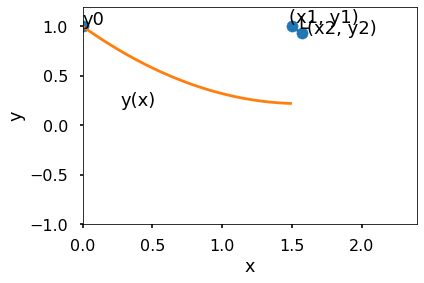

Trial 92: L = 0.20, angle = 0.25 pi, (x1, y1) = (1.50, 1.00)


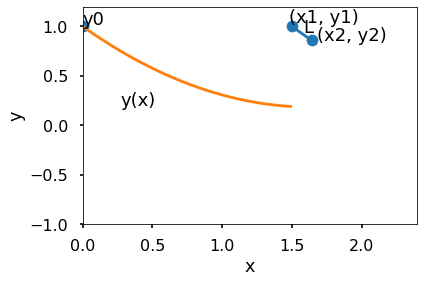

Trial 93: L = 0.30, angle = 0.25 pi, (x1, y1) = (1.50, 1.00)


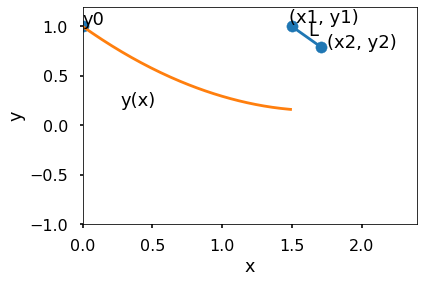

Trial 94: L = 0.40, angle = 0.25 pi, (x1, y1) = (1.50, 1.00)


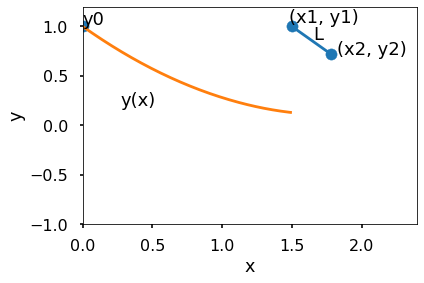

Trial 95: L = 0.50, angle = 0.25 pi, (x1, y1) = (1.50, 1.00)


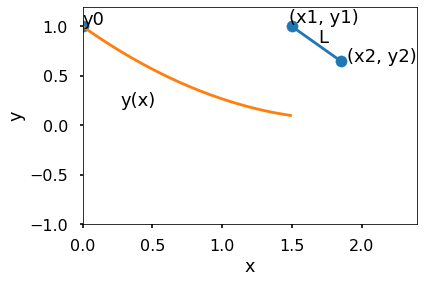

Trial 96: L = 0.60, angle = 0.25 pi, (x1, y1) = (1.50, 1.00)


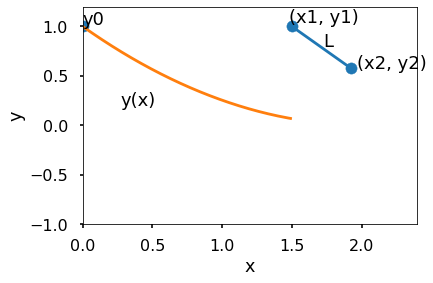

Trial 97: L = 0.10, angle = 0.33 pi, (x1, y1) = (1.50, 1.00)


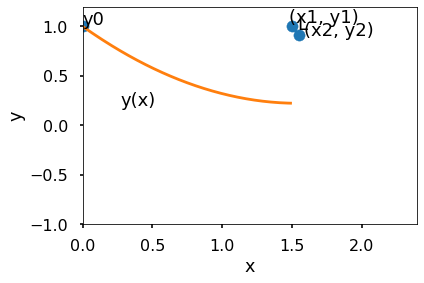

Trial 98: L = 0.20, angle = 0.33 pi, (x1, y1) = (1.50, 1.00)


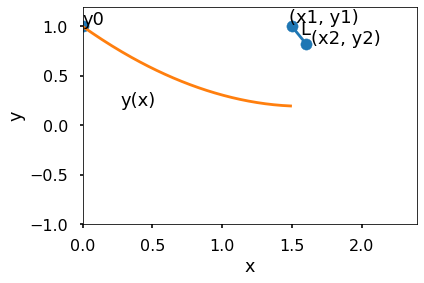

Trial 99: L = 0.30, angle = 0.33 pi, (x1, y1) = (1.50, 1.00)


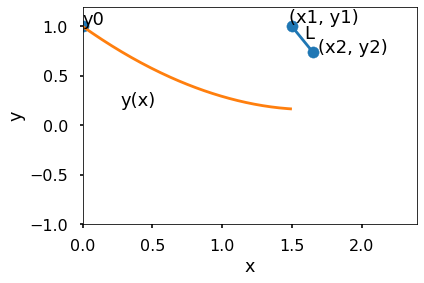

Trial 100: L = 0.40, angle = 0.33 pi, (x1, y1) = (1.50, 1.00)


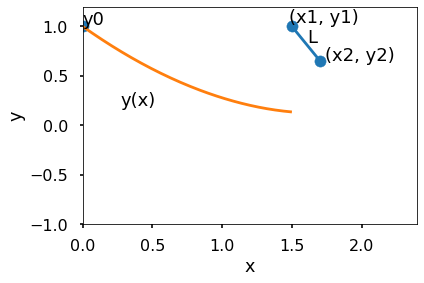

Trial 101: L = 0.50, angle = 0.33 pi, (x1, y1) = (1.50, 1.00)


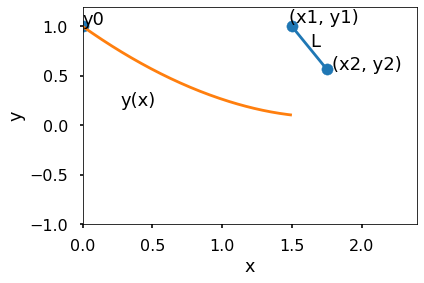

Trial 102: L = 0.60, angle = 0.33 pi, (x1, y1) = (1.50, 1.00)


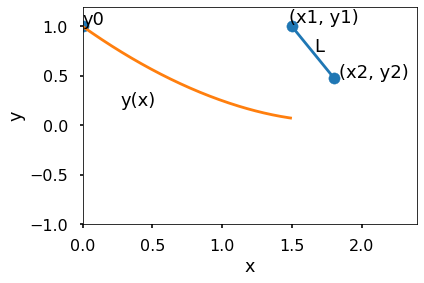

Trial 103: L = 0.10, angle = 0.50 pi, (x1, y1) = (1.50, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


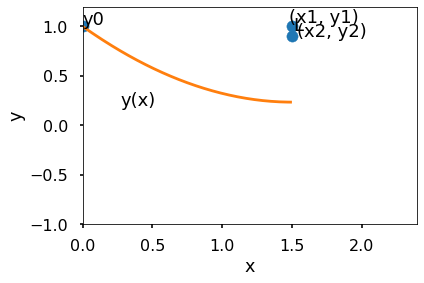

Trial 104: L = 0.20, angle = 0.50 pi, (x1, y1) = (1.50, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


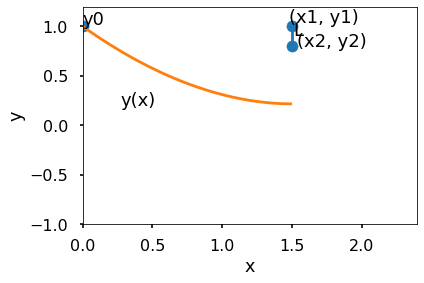

Trial 105: L = 0.30, angle = 0.50 pi, (x1, y1) = (1.50, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


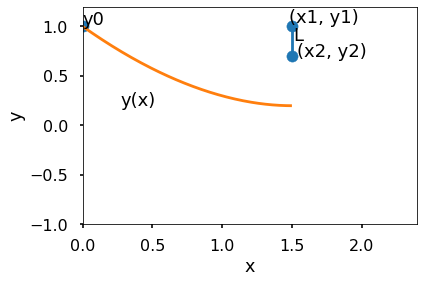

Trial 106: L = 0.40, angle = 0.50 pi, (x1, y1) = (1.50, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


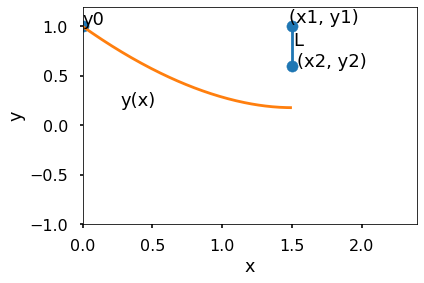

Trial 107: L = 0.50, angle = 0.50 pi, (x1, y1) = (1.50, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


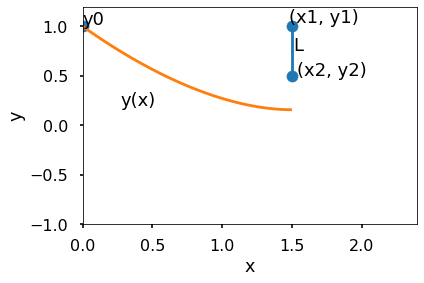

Trial 108: L = 0.60, angle = 0.50 pi, (x1, y1) = (1.50, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


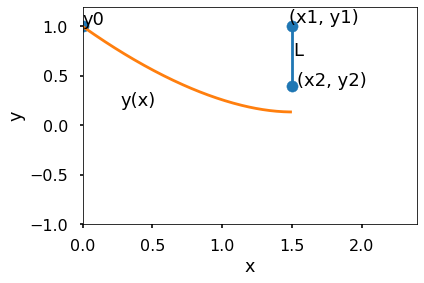

Trial 109: L = 0.10, angle = 0.00 pi, (x1, y1) = (1.50, 1.20)


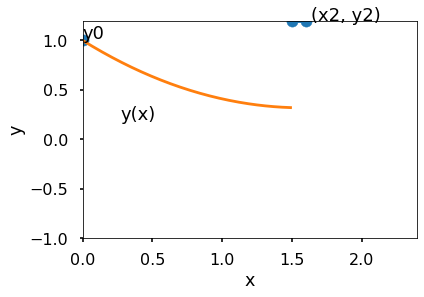

Trial 110: L = 0.20, angle = 0.00 pi, (x1, y1) = (1.50, 1.20)


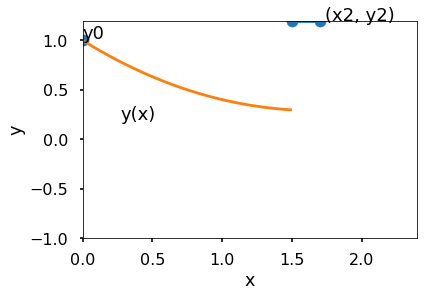

Trial 111: L = 0.30, angle = 0.00 pi, (x1, y1) = (1.50, 1.20)


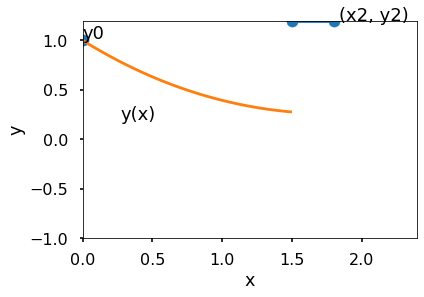

Trial 112: L = 0.40, angle = 0.00 pi, (x1, y1) = (1.50, 1.20)


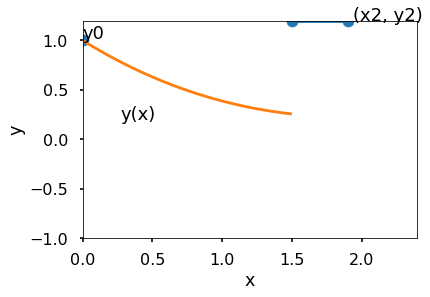

Trial 113: L = 0.50, angle = 0.00 pi, (x1, y1) = (1.50, 1.20)


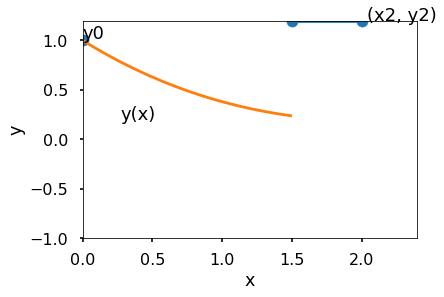

Trial 114: L = 0.60, angle = 0.00 pi, (x1, y1) = (1.50, 1.20)


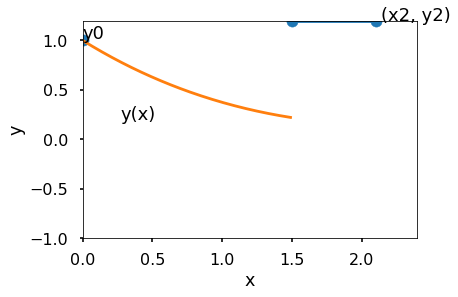

Trial 115: L = 0.10, angle = 0.17 pi, (x1, y1) = (1.50, 1.20)


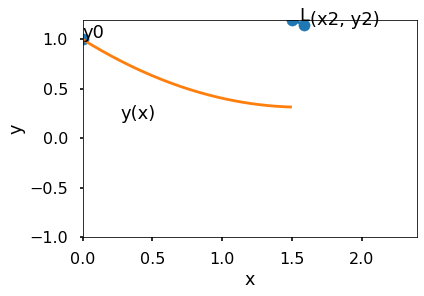

Trial 116: L = 0.20, angle = 0.17 pi, (x1, y1) = (1.50, 1.20)


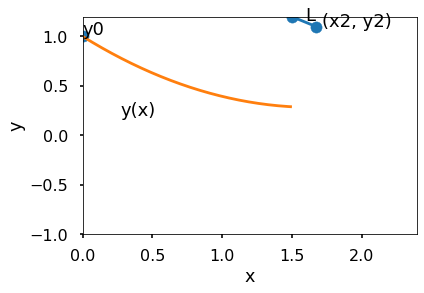

Trial 117: L = 0.30, angle = 0.17 pi, (x1, y1) = (1.50, 1.20)


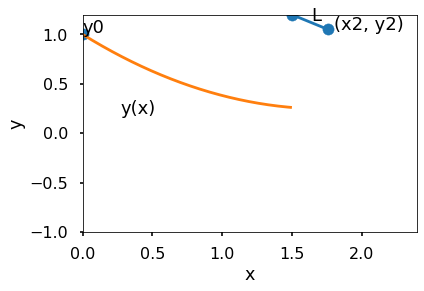

Trial 118: L = 0.40, angle = 0.17 pi, (x1, y1) = (1.50, 1.20)


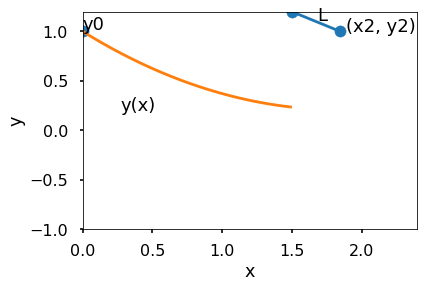

Trial 119: L = 0.50, angle = 0.17 pi, (x1, y1) = (1.50, 1.20)


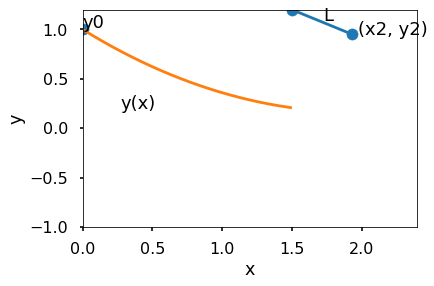

Trial 120: L = 0.60, angle = 0.17 pi, (x1, y1) = (1.50, 1.20)


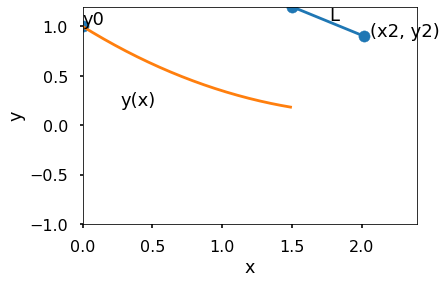

Trial 121: L = 0.10, angle = 0.20 pi, (x1, y1) = (1.50, 1.20)


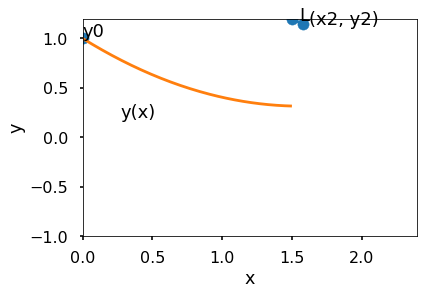

Trial 122: L = 0.20, angle = 0.20 pi, (x1, y1) = (1.50, 1.20)


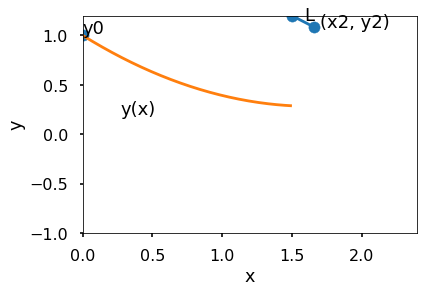

Trial 123: L = 0.30, angle = 0.20 pi, (x1, y1) = (1.50, 1.20)


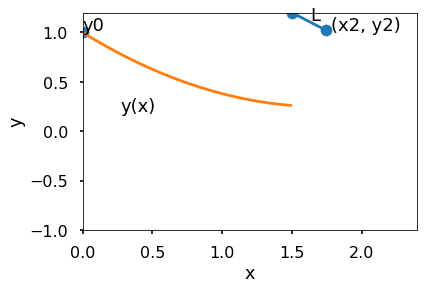

Trial 124: L = 0.40, angle = 0.20 pi, (x1, y1) = (1.50, 1.20)


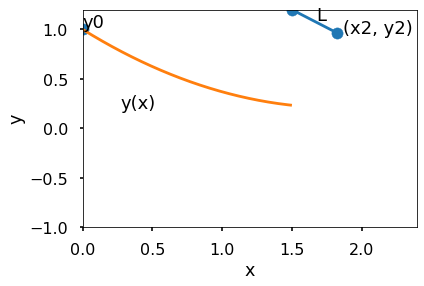

Trial 125: L = 0.50, angle = 0.20 pi, (x1, y1) = (1.50, 1.20)


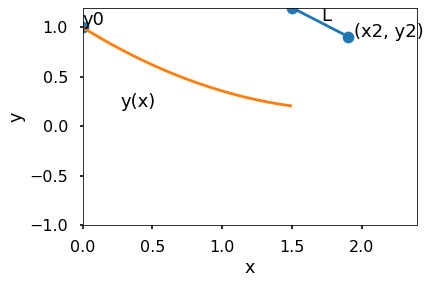

Trial 126: L = 0.60, angle = 0.20 pi, (x1, y1) = (1.50, 1.20)


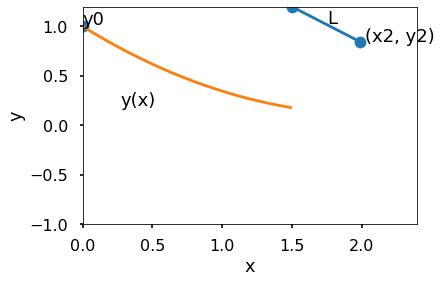

Trial 127: L = 0.10, angle = 0.25 pi, (x1, y1) = (1.50, 1.20)


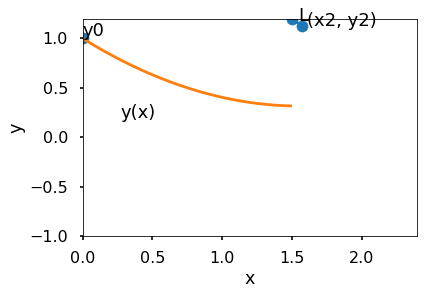

Trial 128: L = 0.20, angle = 0.25 pi, (x1, y1) = (1.50, 1.20)


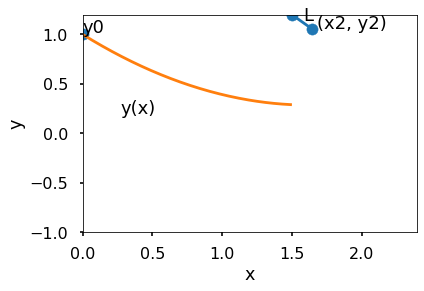

Trial 129: L = 0.30, angle = 0.25 pi, (x1, y1) = (1.50, 1.20)


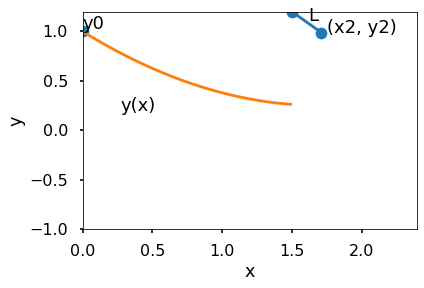

Trial 130: L = 0.40, angle = 0.25 pi, (x1, y1) = (1.50, 1.20)


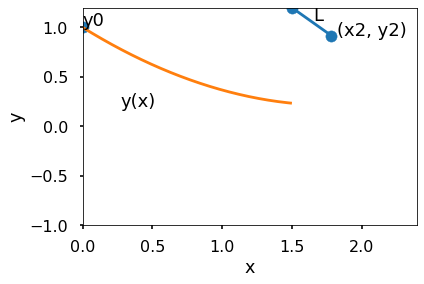

Trial 131: L = 0.50, angle = 0.25 pi, (x1, y1) = (1.50, 1.20)


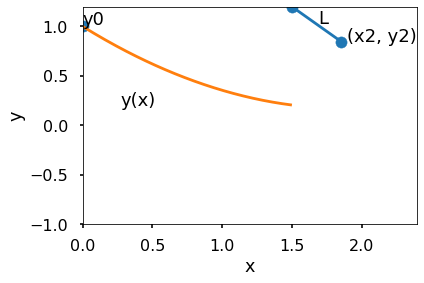

Trial 132: L = 0.60, angle = 0.25 pi, (x1, y1) = (1.50, 1.20)


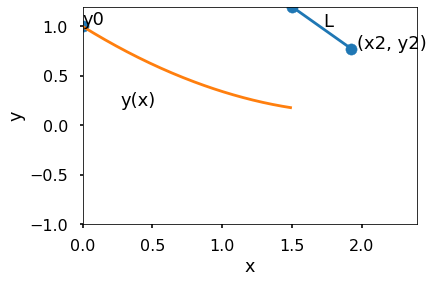

Trial 133: L = 0.10, angle = 0.33 pi, (x1, y1) = (1.50, 1.20)


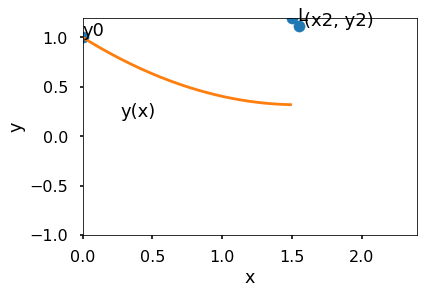

Trial 134: L = 0.20, angle = 0.33 pi, (x1, y1) = (1.50, 1.20)


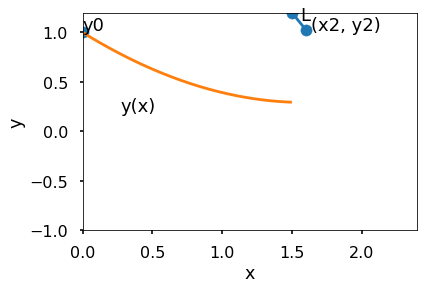

Trial 135: L = 0.30, angle = 0.33 pi, (x1, y1) = (1.50, 1.20)


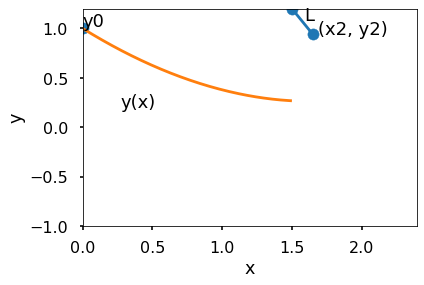

Trial 136: L = 0.40, angle = 0.33 pi, (x1, y1) = (1.50, 1.20)


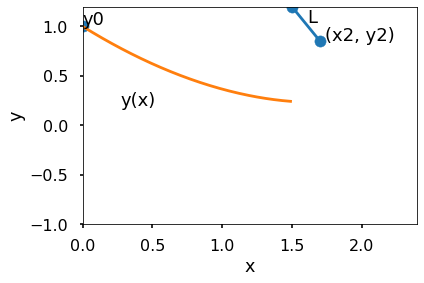

Trial 137: L = 0.50, angle = 0.33 pi, (x1, y1) = (1.50, 1.20)


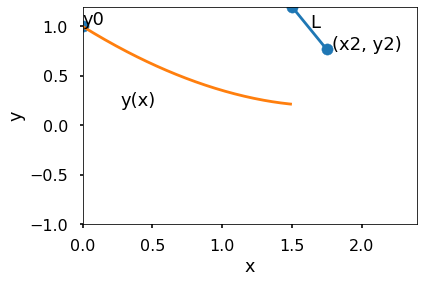

Trial 138: L = 0.60, angle = 0.33 pi, (x1, y1) = (1.50, 1.20)


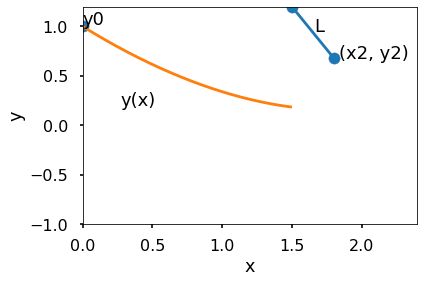

Trial 139: L = 0.10, angle = 0.50 pi, (x1, y1) = (1.50, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


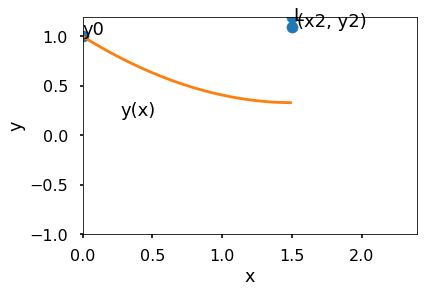

Trial 140: L = 0.20, angle = 0.50 pi, (x1, y1) = (1.50, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


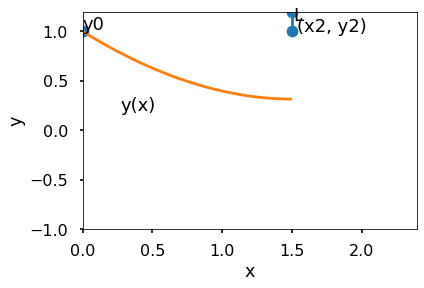

Trial 141: L = 0.30, angle = 0.50 pi, (x1, y1) = (1.50, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


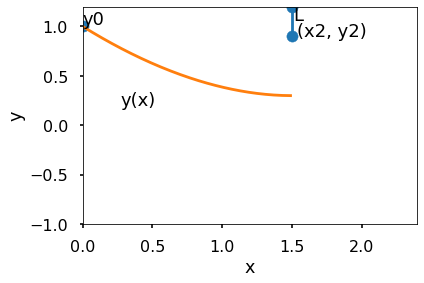

Trial 142: L = 0.40, angle = 0.50 pi, (x1, y1) = (1.50, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


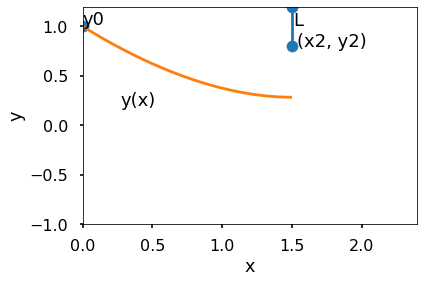

Trial 143: L = 0.50, angle = 0.50 pi, (x1, y1) = (1.50, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


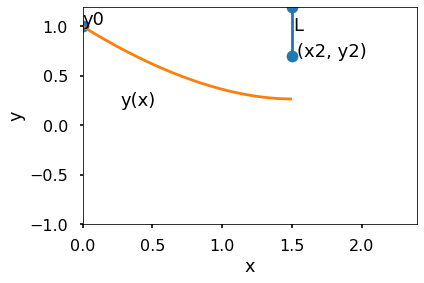

Trial 144: L = 0.60, angle = 0.50 pi, (x1, y1) = (1.50, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


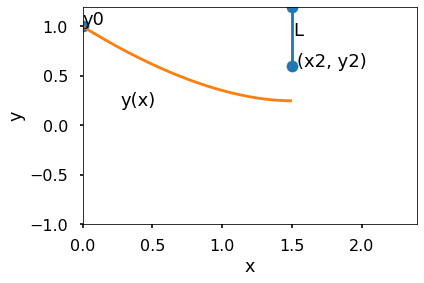

Trial 145: L = 0.10, angle = 0.00 pi, (x1, y1) = (1.75, 0.60)


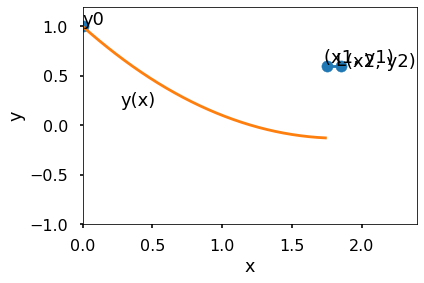

Trial 146: L = 0.20, angle = 0.00 pi, (x1, y1) = (1.75, 0.60)


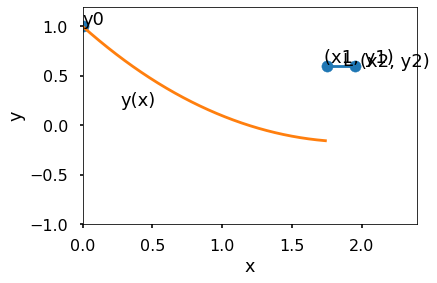

Trial 147: L = 0.30, angle = 0.00 pi, (x1, y1) = (1.75, 0.60)


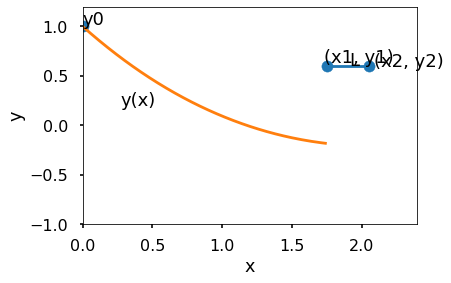

Trial 148: L = 0.40, angle = 0.00 pi, (x1, y1) = (1.75, 0.60)


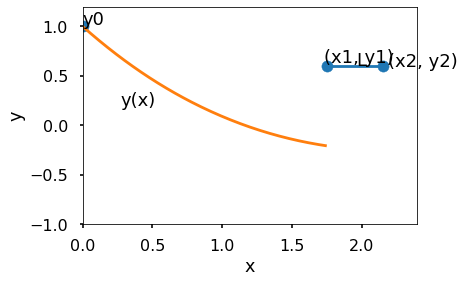

Trial 149: L = 0.50, angle = 0.00 pi, (x1, y1) = (1.75, 0.60)


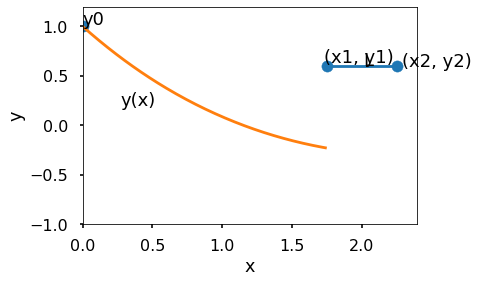

Trial 150: L = 0.60, angle = 0.00 pi, (x1, y1) = (1.75, 0.60)


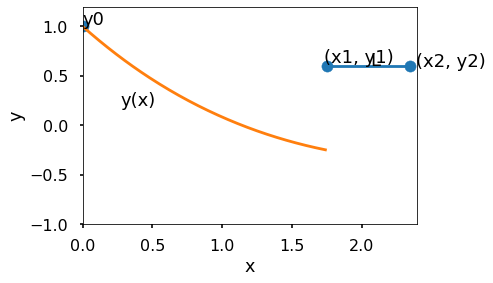

Trial 151: L = 0.10, angle = 0.17 pi, (x1, y1) = (1.75, 0.60)


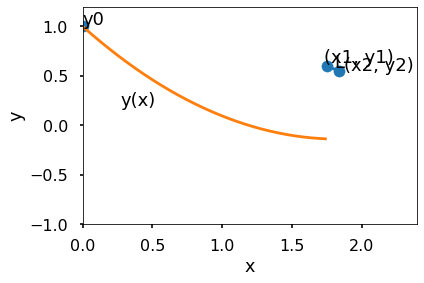

Trial 152: L = 0.20, angle = 0.17 pi, (x1, y1) = (1.75, 0.60)


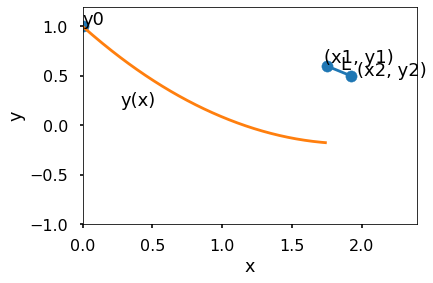

Trial 153: L = 0.30, angle = 0.17 pi, (x1, y1) = (1.75, 0.60)


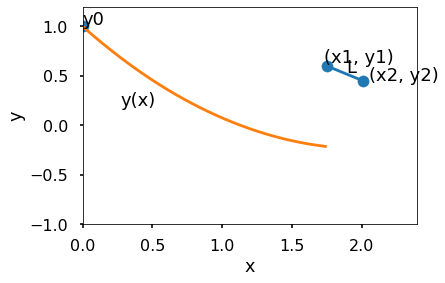

Trial 154: L = 0.40, angle = 0.17 pi, (x1, y1) = (1.75, 0.60)


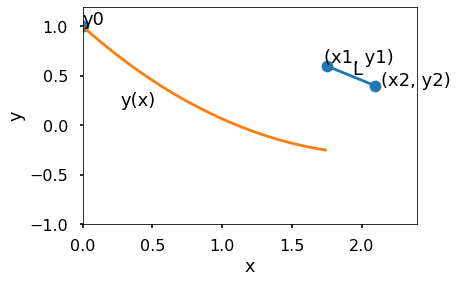

Trial 155: L = 0.50, angle = 0.17 pi, (x1, y1) = (1.75, 0.60)


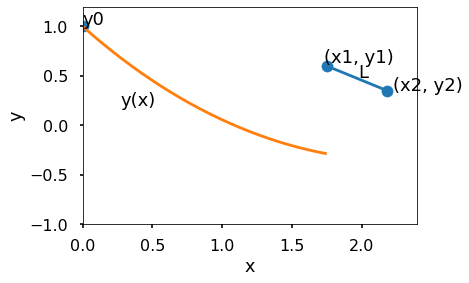

Trial 156: L = 0.60, angle = 0.17 pi, (x1, y1) = (1.75, 0.60)


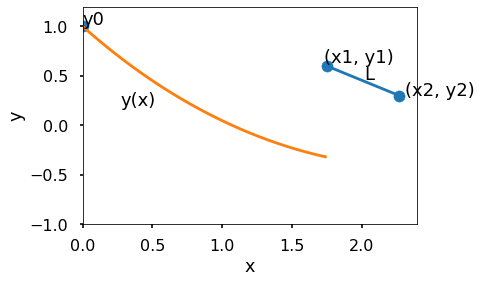

Trial 157: L = 0.10, angle = 0.20 pi, (x1, y1) = (1.75, 0.60)


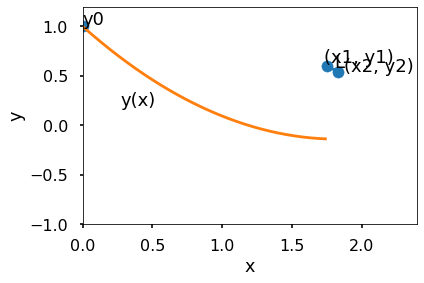

Trial 158: L = 0.20, angle = 0.20 pi, (x1, y1) = (1.75, 0.60)


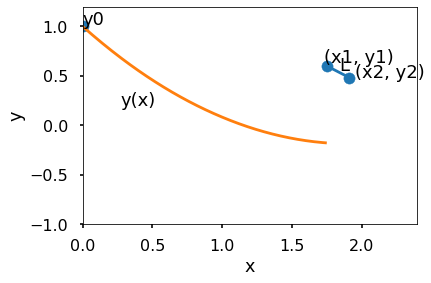

Trial 159: L = 0.30, angle = 0.20 pi, (x1, y1) = (1.75, 0.60)


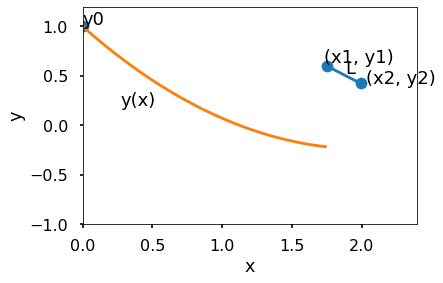

Trial 160: L = 0.40, angle = 0.20 pi, (x1, y1) = (1.75, 0.60)


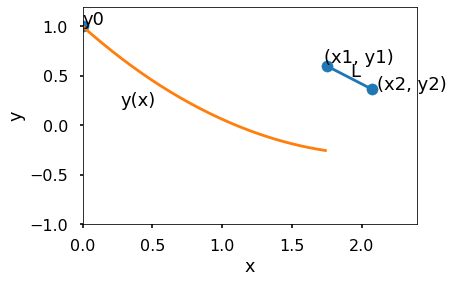

Trial 161: L = 0.50, angle = 0.20 pi, (x1, y1) = (1.75, 0.60)


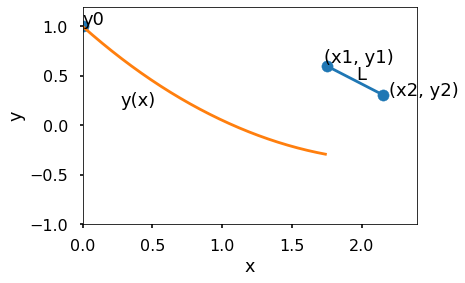

Trial 162: L = 0.60, angle = 0.20 pi, (x1, y1) = (1.75, 0.60)


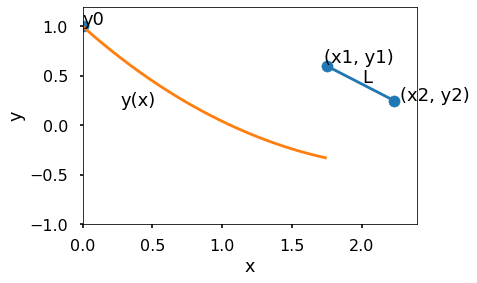

Trial 163: L = 0.10, angle = 0.25 pi, (x1, y1) = (1.75, 0.60)


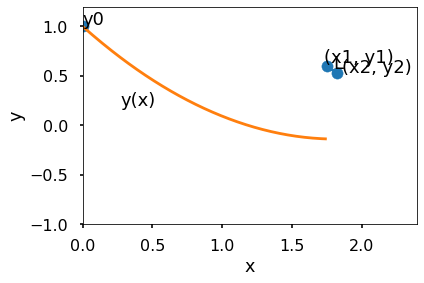

Trial 164: L = 0.20, angle = 0.25 pi, (x1, y1) = (1.75, 0.60)


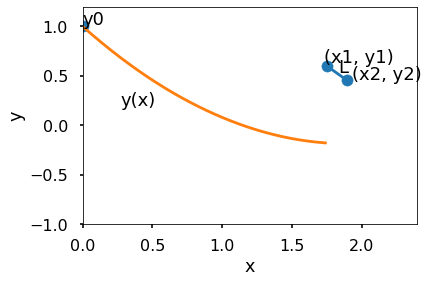

Trial 165: L = 0.30, angle = 0.25 pi, (x1, y1) = (1.75, 0.60)


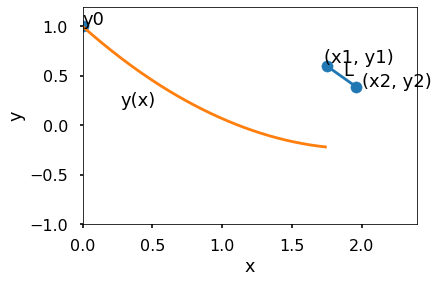

Trial 166: L = 0.40, angle = 0.25 pi, (x1, y1) = (1.75, 0.60)


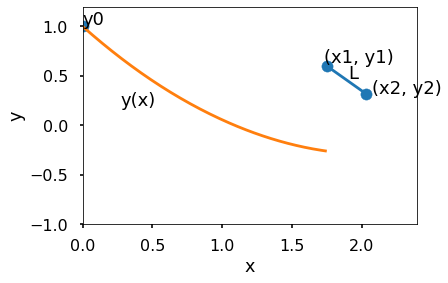

Trial 167: L = 0.50, angle = 0.25 pi, (x1, y1) = (1.75, 0.60)


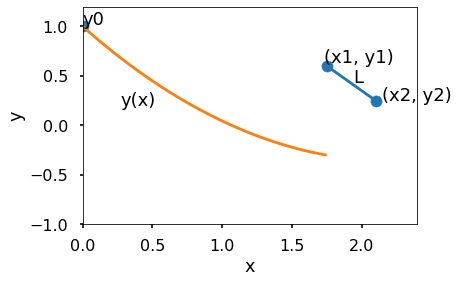

Trial 168: L = 0.60, angle = 0.25 pi, (x1, y1) = (1.75, 0.60)


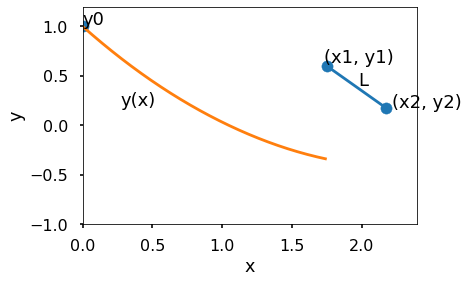

Trial 169: L = 0.10, angle = 0.33 pi, (x1, y1) = (1.75, 0.60)


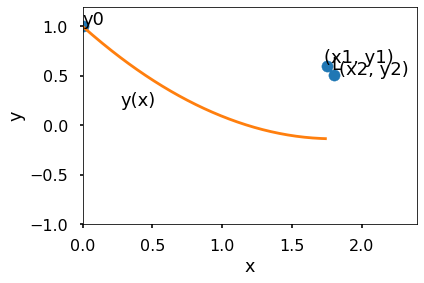

Trial 170: L = 0.20, angle = 0.33 pi, (x1, y1) = (1.75, 0.60)


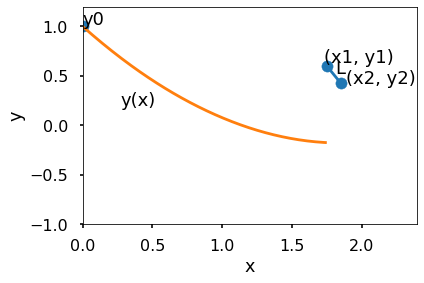

Trial 171: L = 0.30, angle = 0.33 pi, (x1, y1) = (1.75, 0.60)


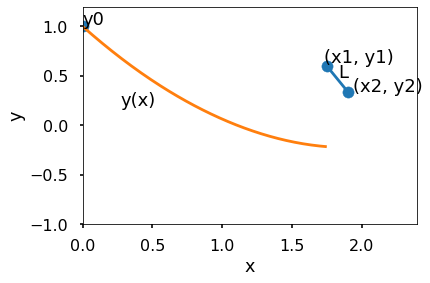

Trial 172: L = 0.40, angle = 0.33 pi, (x1, y1) = (1.75, 0.60)


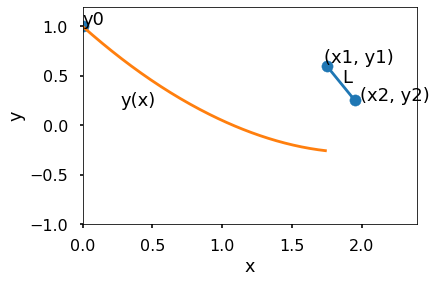

Trial 173: L = 0.50, angle = 0.33 pi, (x1, y1) = (1.75, 0.60)


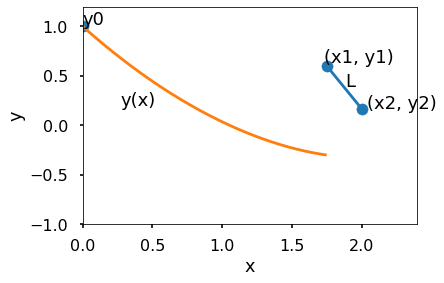

Trial 174: L = 0.60, angle = 0.33 pi, (x1, y1) = (1.75, 0.60)


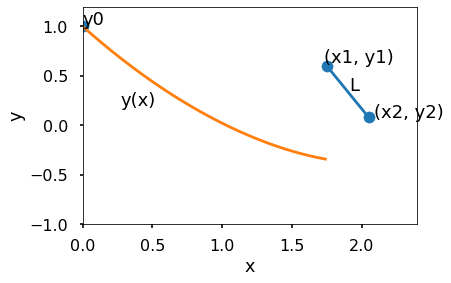

Trial 175: L = 0.10, angle = 0.50 pi, (x1, y1) = (1.75, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


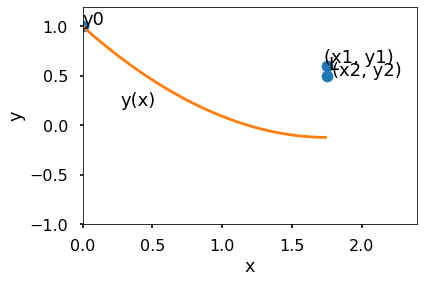

Trial 176: L = 0.20, angle = 0.50 pi, (x1, y1) = (1.75, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


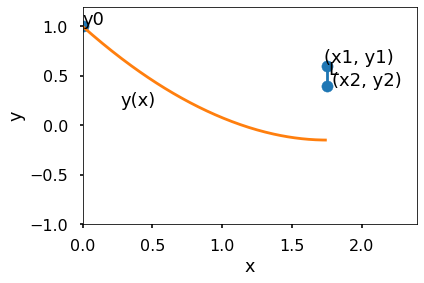

Trial 177: L = 0.30, angle = 0.50 pi, (x1, y1) = (1.75, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


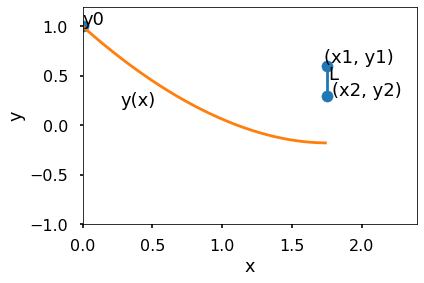

Trial 178: L = 0.40, angle = 0.50 pi, (x1, y1) = (1.75, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


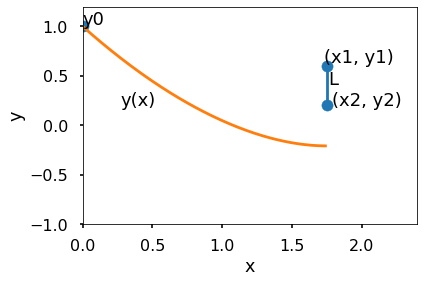

Trial 179: L = 0.50, angle = 0.50 pi, (x1, y1) = (1.75, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


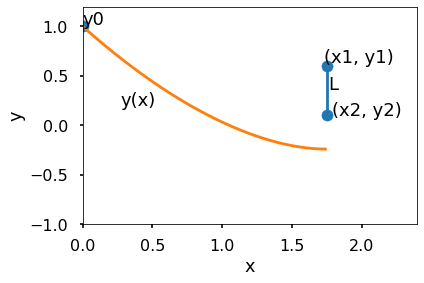

Trial 180: L = 0.60, angle = 0.50 pi, (x1, y1) = (1.75, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


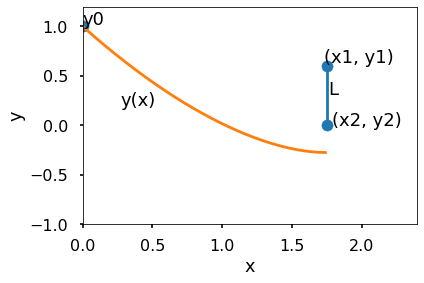

Trial 181: L = 0.10, angle = 0.00 pi, (x1, y1) = (1.75, 0.80)


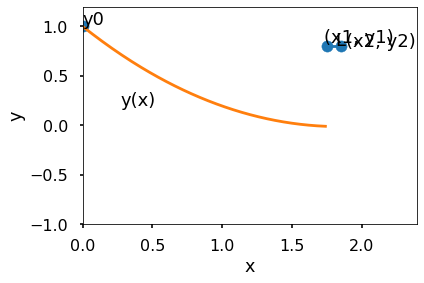

Trial 182: L = 0.20, angle = 0.00 pi, (x1, y1) = (1.75, 0.80)


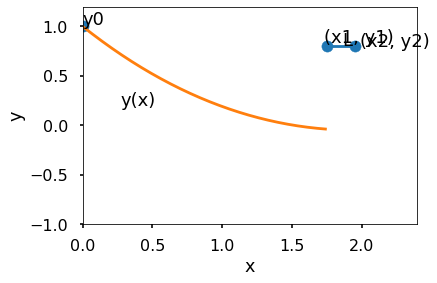

Trial 183: L = 0.30, angle = 0.00 pi, (x1, y1) = (1.75, 0.80)


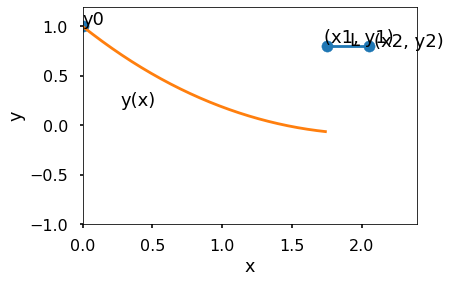

Trial 184: L = 0.40, angle = 0.00 pi, (x1, y1) = (1.75, 0.80)


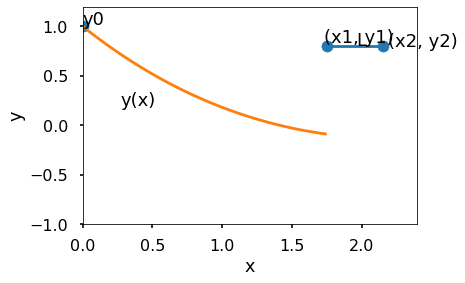

Trial 185: L = 0.50, angle = 0.00 pi, (x1, y1) = (1.75, 0.80)


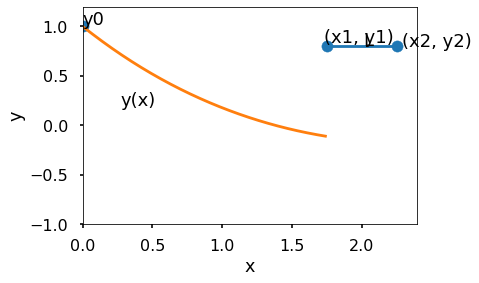

Trial 186: L = 0.60, angle = 0.00 pi, (x1, y1) = (1.75, 0.80)


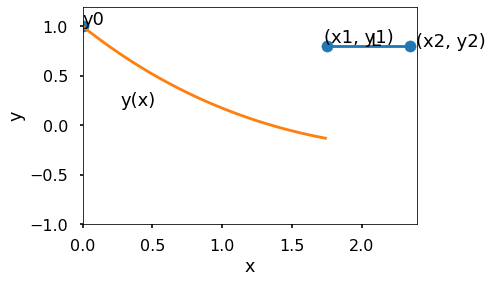

Trial 187: L = 0.10, angle = 0.17 pi, (x1, y1) = (1.75, 0.80)


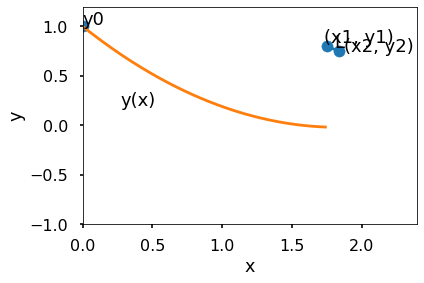

Trial 188: L = 0.20, angle = 0.17 pi, (x1, y1) = (1.75, 0.80)


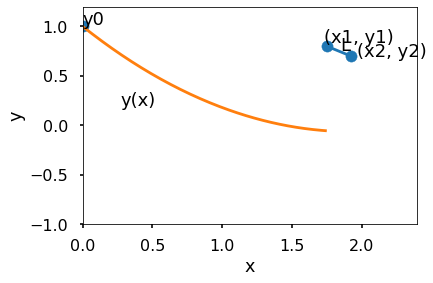

Trial 189: L = 0.30, angle = 0.17 pi, (x1, y1) = (1.75, 0.80)


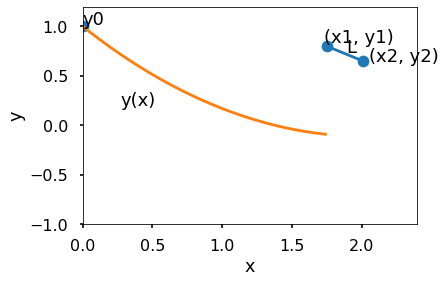

Trial 190: L = 0.40, angle = 0.17 pi, (x1, y1) = (1.75, 0.80)


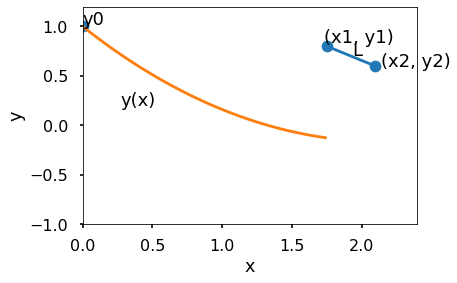

Trial 191: L = 0.50, angle = 0.17 pi, (x1, y1) = (1.75, 0.80)


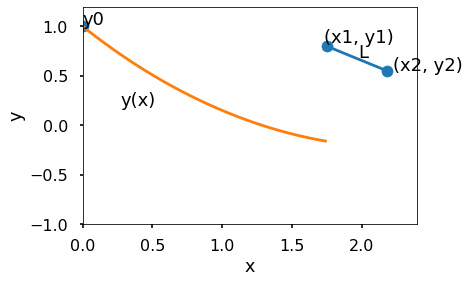

Trial 192: L = 0.60, angle = 0.17 pi, (x1, y1) = (1.75, 0.80)


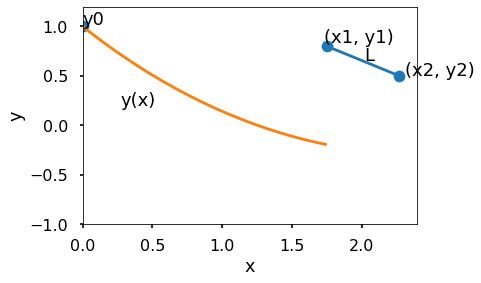

Trial 193: L = 0.10, angle = 0.20 pi, (x1, y1) = (1.75, 0.80)


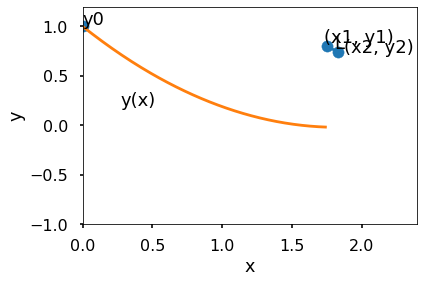

Trial 194: L = 0.20, angle = 0.20 pi, (x1, y1) = (1.75, 0.80)


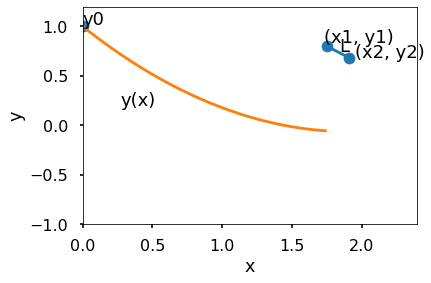

Trial 195: L = 0.30, angle = 0.20 pi, (x1, y1) = (1.75, 0.80)


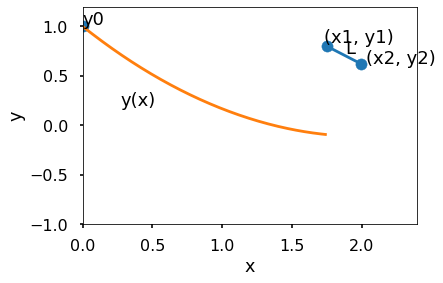

Trial 196: L = 0.40, angle = 0.20 pi, (x1, y1) = (1.75, 0.80)


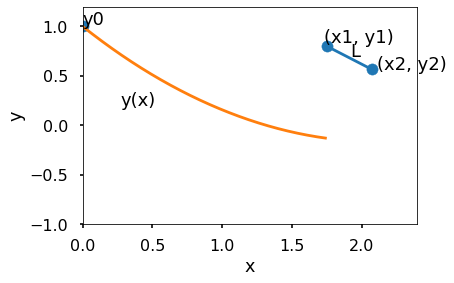

Trial 197: L = 0.50, angle = 0.20 pi, (x1, y1) = (1.75, 0.80)


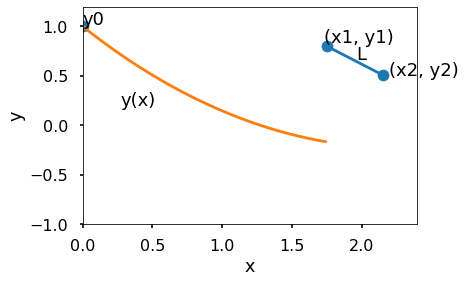

Trial 198: L = 0.60, angle = 0.20 pi, (x1, y1) = (1.75, 0.80)


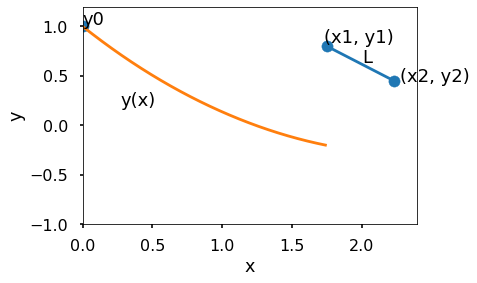

Trial 199: L = 0.10, angle = 0.25 pi, (x1, y1) = (1.75, 0.80)


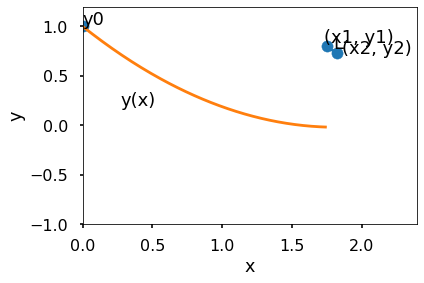

Trial 200: L = 0.20, angle = 0.25 pi, (x1, y1) = (1.75, 0.80)


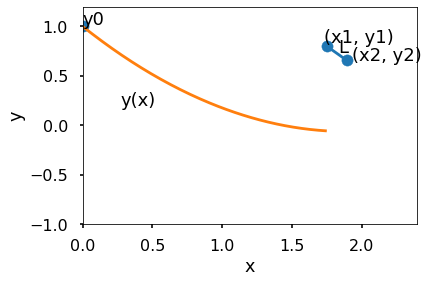

Trial 201: L = 0.30, angle = 0.25 pi, (x1, y1) = (1.75, 0.80)


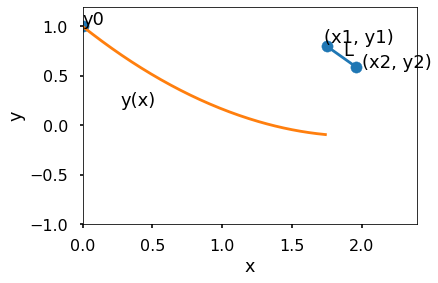

Trial 202: L = 0.40, angle = 0.25 pi, (x1, y1) = (1.75, 0.80)


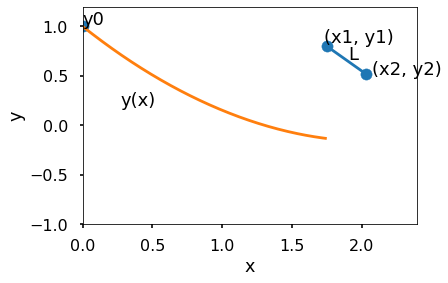

Trial 203: L = 0.50, angle = 0.25 pi, (x1, y1) = (1.75, 0.80)


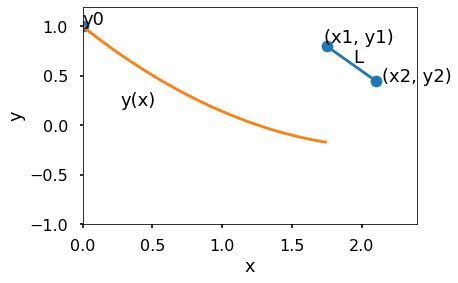

Trial 204: L = 0.60, angle = 0.25 pi, (x1, y1) = (1.75, 0.80)


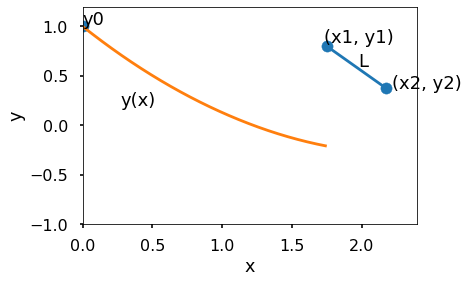

Trial 205: L = 0.10, angle = 0.33 pi, (x1, y1) = (1.75, 0.80)


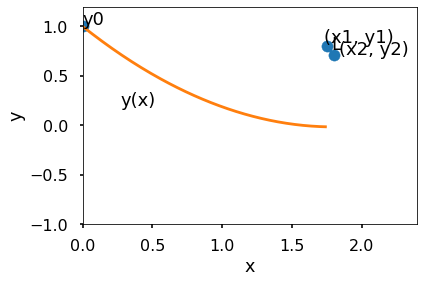

Trial 206: L = 0.20, angle = 0.33 pi, (x1, y1) = (1.75, 0.80)


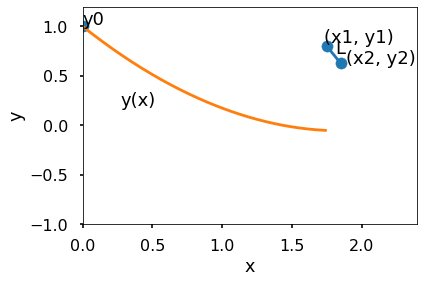

Trial 207: L = 0.30, angle = 0.33 pi, (x1, y1) = (1.75, 0.80)


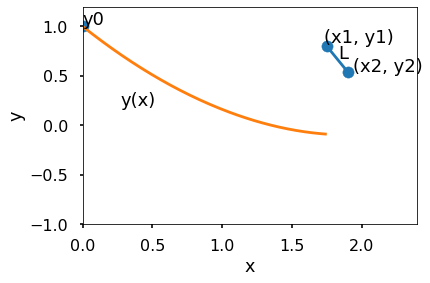

Trial 208: L = 0.40, angle = 0.33 pi, (x1, y1) = (1.75, 0.80)


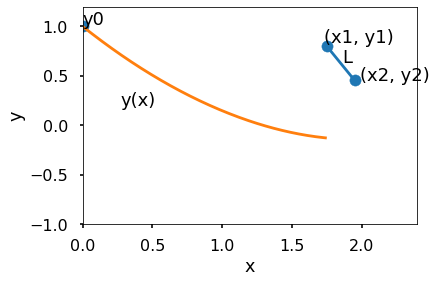

Trial 209: L = 0.50, angle = 0.33 pi, (x1, y1) = (1.75, 0.80)


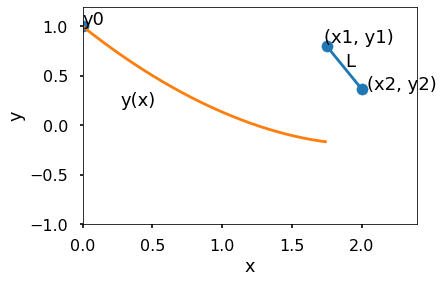

Trial 210: L = 0.60, angle = 0.33 pi, (x1, y1) = (1.75, 0.80)


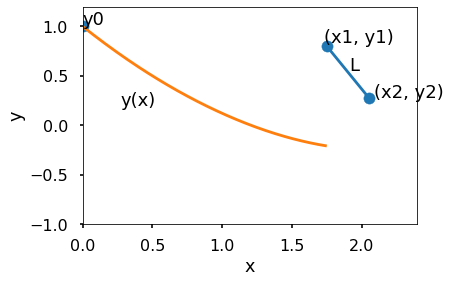

Trial 211: L = 0.10, angle = 0.50 pi, (x1, y1) = (1.75, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


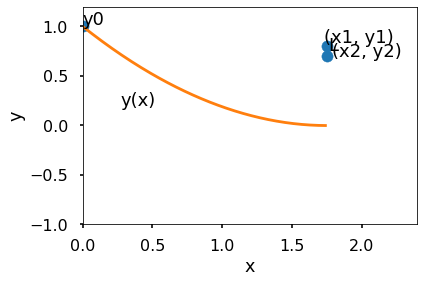

Trial 212: L = 0.20, angle = 0.50 pi, (x1, y1) = (1.75, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


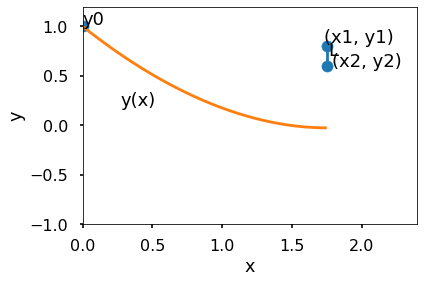

Trial 213: L = 0.30, angle = 0.50 pi, (x1, y1) = (1.75, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


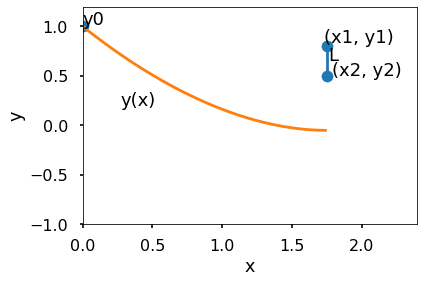

Trial 214: L = 0.40, angle = 0.50 pi, (x1, y1) = (1.75, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


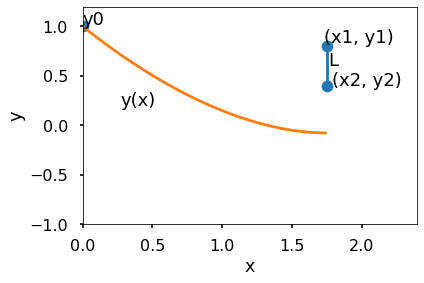

Trial 215: L = 0.50, angle = 0.50 pi, (x1, y1) = (1.75, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


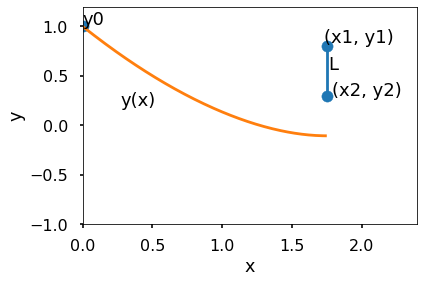

Trial 216: L = 0.60, angle = 0.50 pi, (x1, y1) = (1.75, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


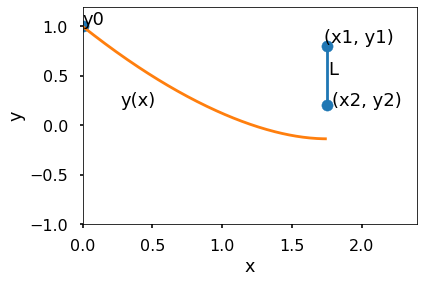

Trial 217: L = 0.10, angle = 0.00 pi, (x1, y1) = (1.75, 1.00)


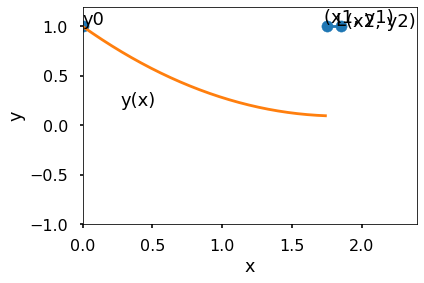

Trial 218: L = 0.20, angle = 0.00 pi, (x1, y1) = (1.75, 1.00)


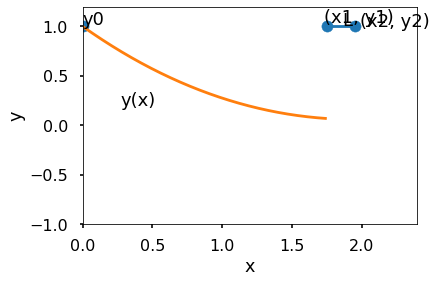

Trial 219: L = 0.30, angle = 0.00 pi, (x1, y1) = (1.75, 1.00)


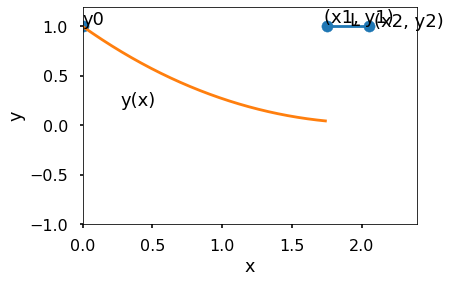

Trial 220: L = 0.40, angle = 0.00 pi, (x1, y1) = (1.75, 1.00)


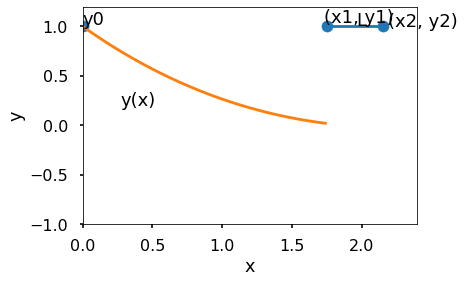

Trial 221: L = 0.50, angle = 0.00 pi, (x1, y1) = (1.75, 1.00)


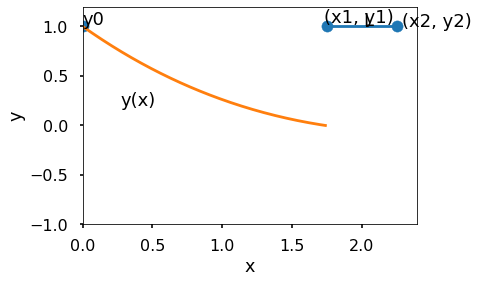

Trial 222: L = 0.60, angle = 0.00 pi, (x1, y1) = (1.75, 1.00)


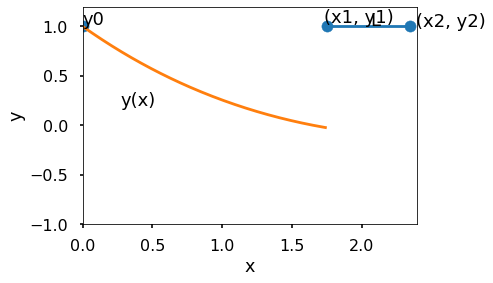

Trial 223: L = 0.10, angle = 0.17 pi, (x1, y1) = (1.75, 1.00)


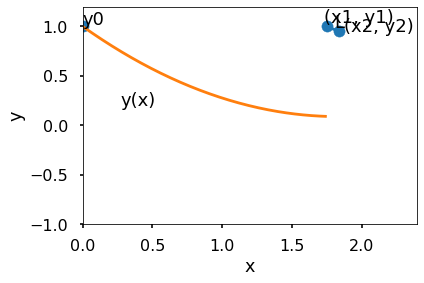

Trial 224: L = 0.20, angle = 0.17 pi, (x1, y1) = (1.75, 1.00)


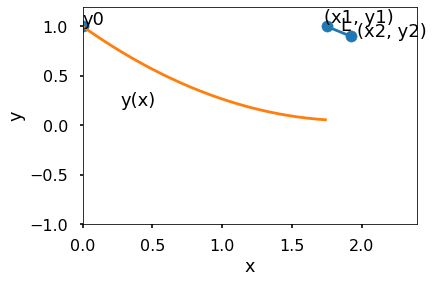

Trial 225: L = 0.30, angle = 0.17 pi, (x1, y1) = (1.75, 1.00)


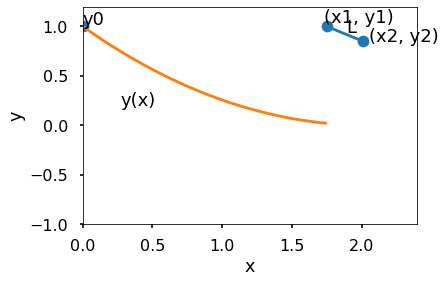

Trial 226: L = 0.40, angle = 0.17 pi, (x1, y1) = (1.75, 1.00)


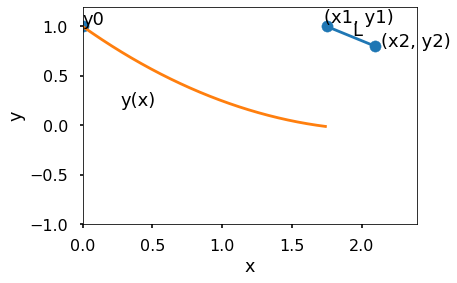

Trial 227: L = 0.50, angle = 0.17 pi, (x1, y1) = (1.75, 1.00)


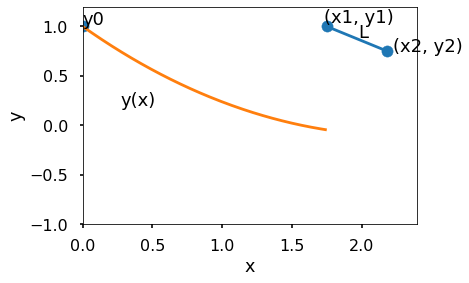

Trial 228: L = 0.60, angle = 0.17 pi, (x1, y1) = (1.75, 1.00)


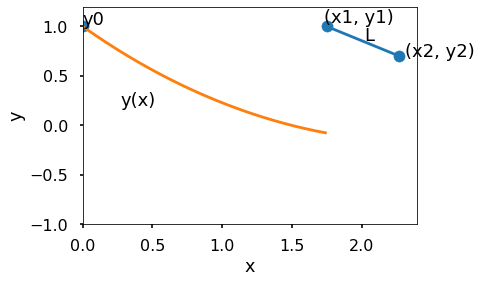

Trial 229: L = 0.10, angle = 0.20 pi, (x1, y1) = (1.75, 1.00)


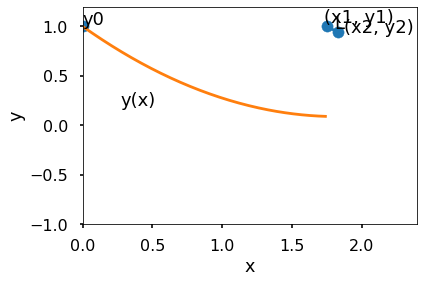

Trial 230: L = 0.20, angle = 0.20 pi, (x1, y1) = (1.75, 1.00)


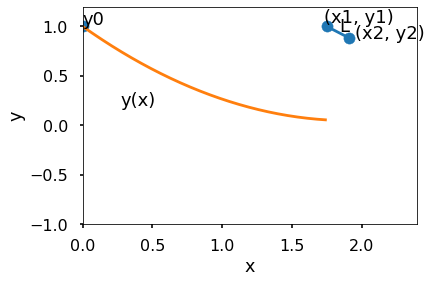

Trial 231: L = 0.30, angle = 0.20 pi, (x1, y1) = (1.75, 1.00)


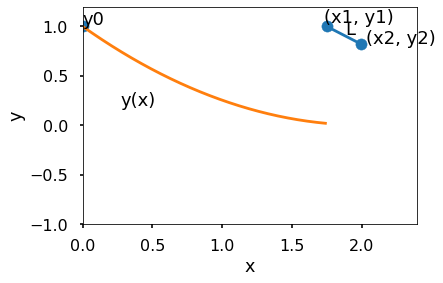

Trial 232: L = 0.40, angle = 0.20 pi, (x1, y1) = (1.75, 1.00)


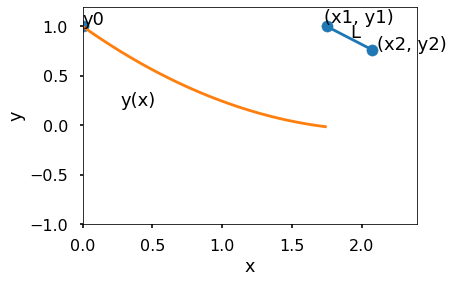

Trial 233: L = 0.50, angle = 0.20 pi, (x1, y1) = (1.75, 1.00)


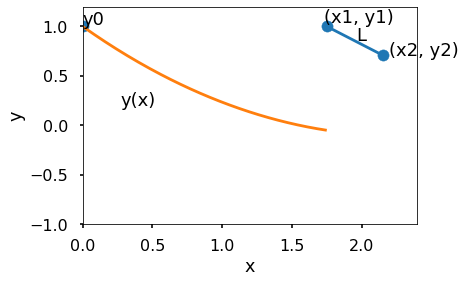

Trial 234: L = 0.60, angle = 0.20 pi, (x1, y1) = (1.75, 1.00)


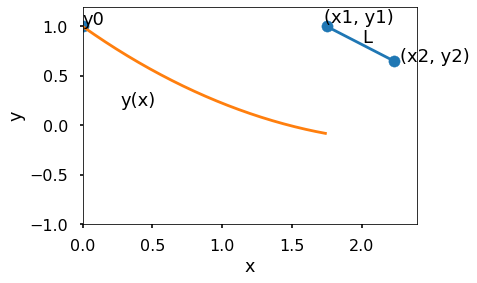

Trial 235: L = 0.10, angle = 0.25 pi, (x1, y1) = (1.75, 1.00)


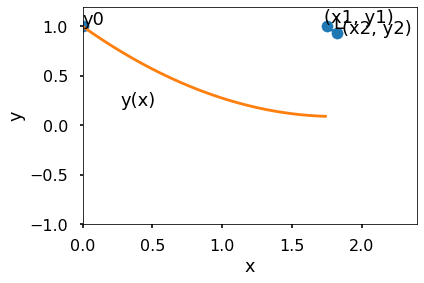

Trial 236: L = 0.20, angle = 0.25 pi, (x1, y1) = (1.75, 1.00)


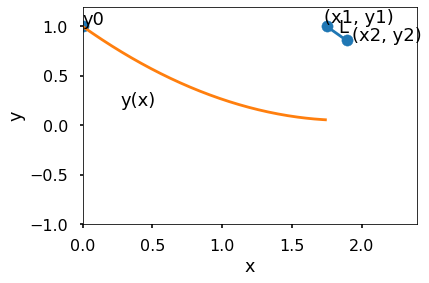

Trial 237: L = 0.30, angle = 0.25 pi, (x1, y1) = (1.75, 1.00)


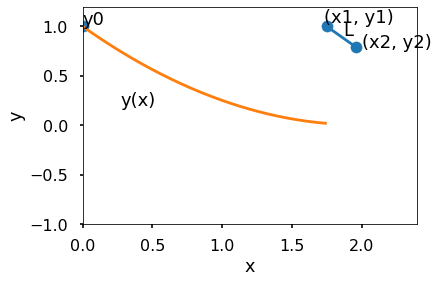

Trial 238: L = 0.40, angle = 0.25 pi, (x1, y1) = (1.75, 1.00)


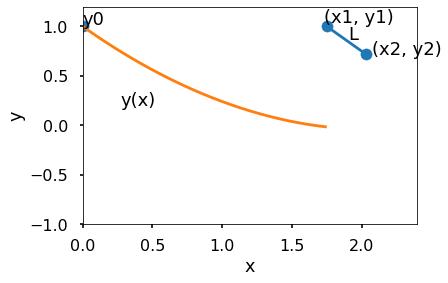

Trial 239: L = 0.50, angle = 0.25 pi, (x1, y1) = (1.75, 1.00)


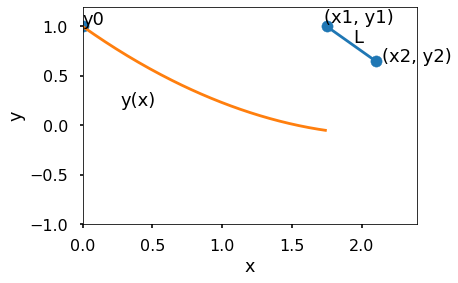

Trial 240: L = 0.60, angle = 0.25 pi, (x1, y1) = (1.75, 1.00)


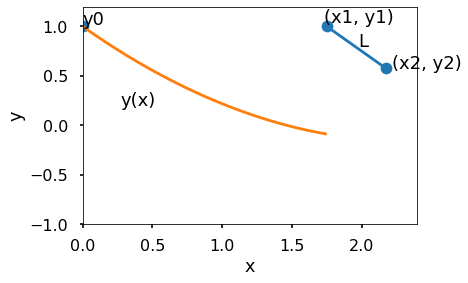

Trial 241: L = 0.10, angle = 0.33 pi, (x1, y1) = (1.75, 1.00)


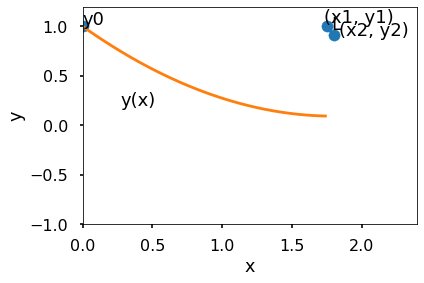

Trial 242: L = 0.20, angle = 0.33 pi, (x1, y1) = (1.75, 1.00)


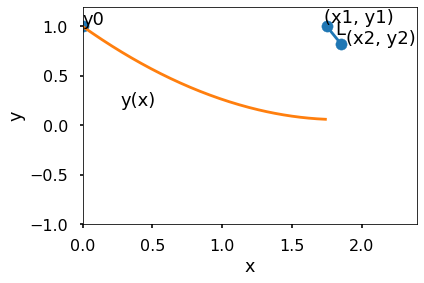

Trial 243: L = 0.30, angle = 0.33 pi, (x1, y1) = (1.75, 1.00)


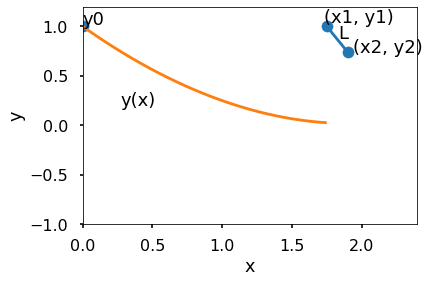

Trial 244: L = 0.40, angle = 0.33 pi, (x1, y1) = (1.75, 1.00)


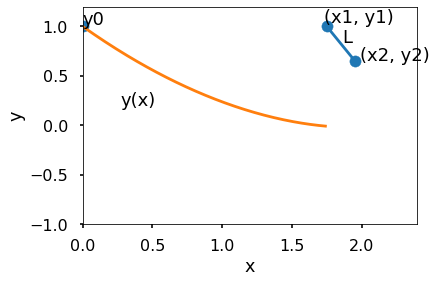

Trial 245: L = 0.50, angle = 0.33 pi, (x1, y1) = (1.75, 1.00)


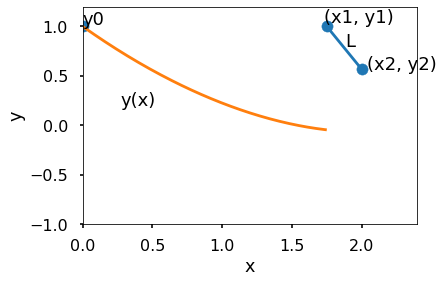

Trial 246: L = 0.60, angle = 0.33 pi, (x1, y1) = (1.75, 1.00)


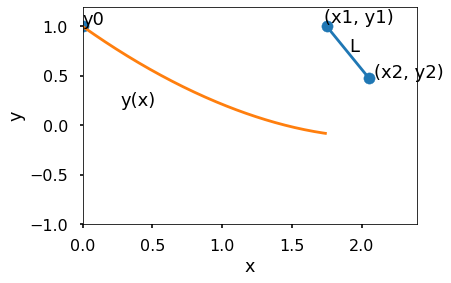

Trial 247: L = 0.10, angle = 0.50 pi, (x1, y1) = (1.75, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


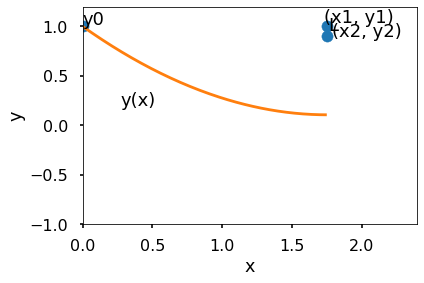

Trial 248: L = 0.20, angle = 0.50 pi, (x1, y1) = (1.75, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


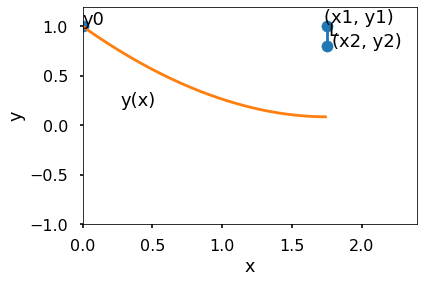

Trial 249: L = 0.30, angle = 0.50 pi, (x1, y1) = (1.75, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


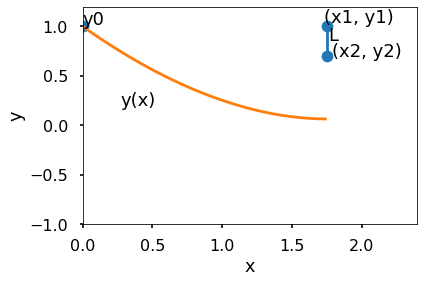

Trial 250: L = 0.40, angle = 0.50 pi, (x1, y1) = (1.75, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


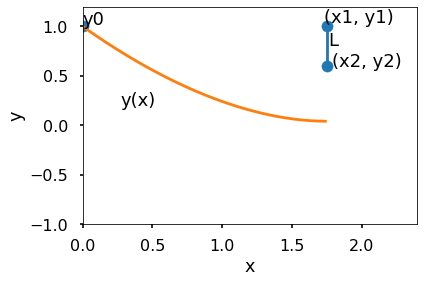

Trial 251: L = 0.50, angle = 0.50 pi, (x1, y1) = (1.75, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


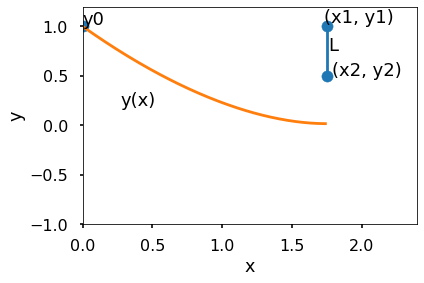

Trial 252: L = 0.60, angle = 0.50 pi, (x1, y1) = (1.75, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


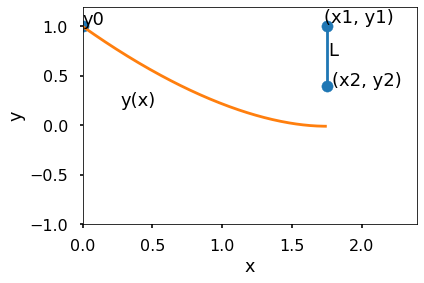

Trial 253: L = 0.10, angle = 0.00 pi, (x1, y1) = (1.75, 1.20)


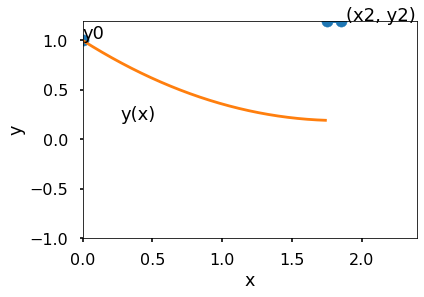

Trial 254: L = 0.20, angle = 0.00 pi, (x1, y1) = (1.75, 1.20)


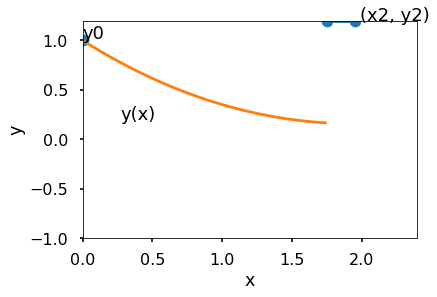

Trial 255: L = 0.30, angle = 0.00 pi, (x1, y1) = (1.75, 1.20)


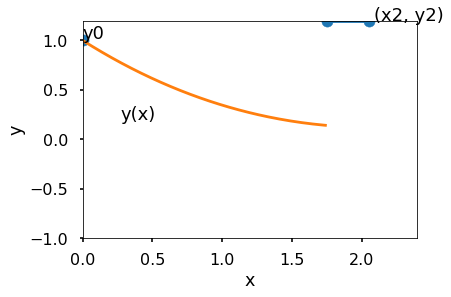

Trial 256: L = 0.40, angle = 0.00 pi, (x1, y1) = (1.75, 1.20)


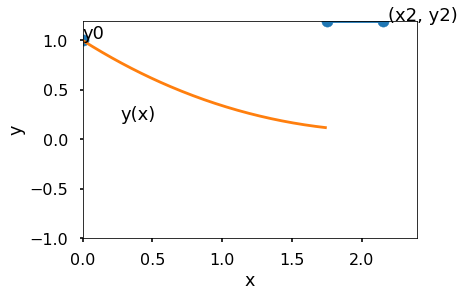

Trial 257: L = 0.50, angle = 0.00 pi, (x1, y1) = (1.75, 1.20)


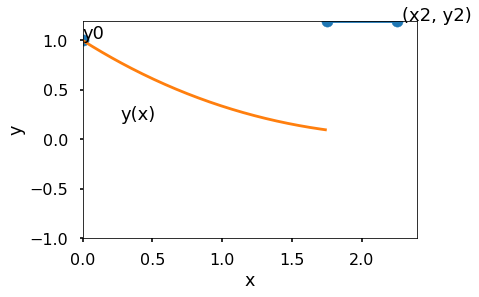

Trial 258: L = 0.60, angle = 0.00 pi, (x1, y1) = (1.75, 1.20)


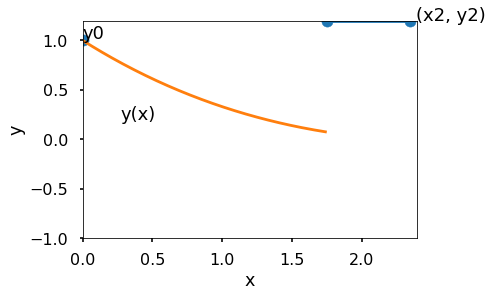

Trial 259: L = 0.10, angle = 0.17 pi, (x1, y1) = (1.75, 1.20)


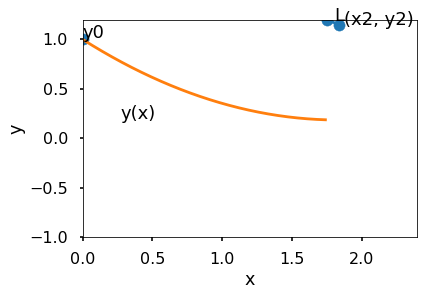

Trial 260: L = 0.20, angle = 0.17 pi, (x1, y1) = (1.75, 1.20)


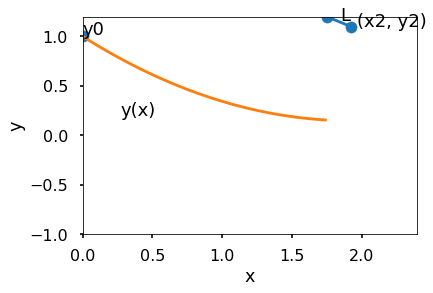

Trial 261: L = 0.30, angle = 0.17 pi, (x1, y1) = (1.75, 1.20)


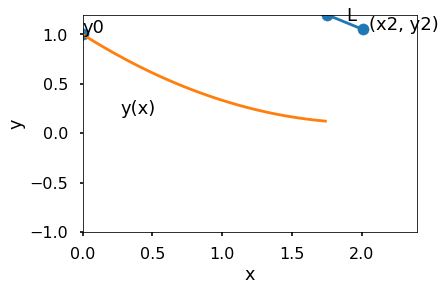

Trial 262: L = 0.40, angle = 0.17 pi, (x1, y1) = (1.75, 1.20)


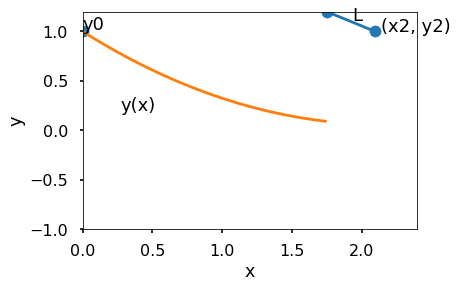

Trial 263: L = 0.50, angle = 0.17 pi, (x1, y1) = (1.75, 1.20)


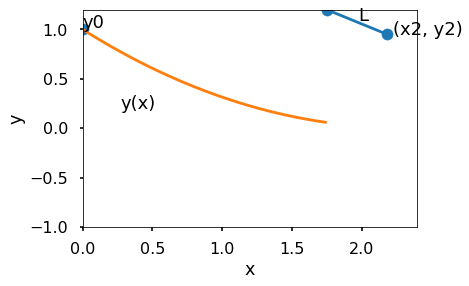

Trial 264: L = 0.60, angle = 0.17 pi, (x1, y1) = (1.75, 1.20)


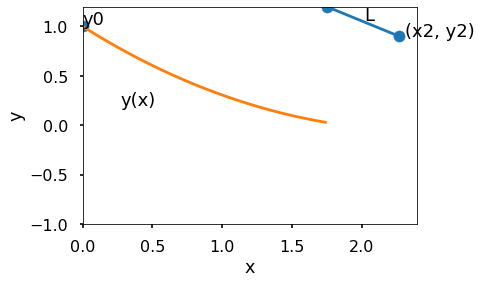

Trial 265: L = 0.10, angle = 0.20 pi, (x1, y1) = (1.75, 1.20)


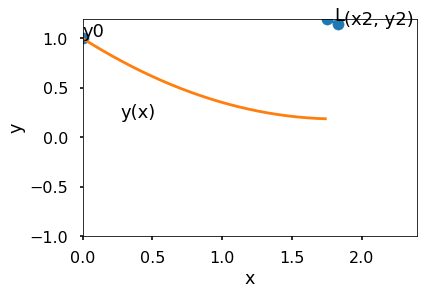

Trial 266: L = 0.20, angle = 0.20 pi, (x1, y1) = (1.75, 1.20)


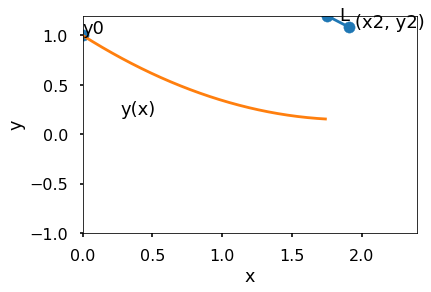

Trial 267: L = 0.30, angle = 0.20 pi, (x1, y1) = (1.75, 1.20)


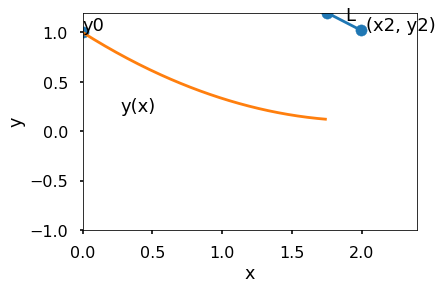

Trial 268: L = 0.40, angle = 0.20 pi, (x1, y1) = (1.75, 1.20)


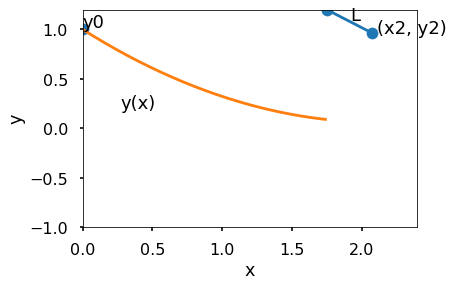

Trial 269: L = 0.50, angle = 0.20 pi, (x1, y1) = (1.75, 1.20)


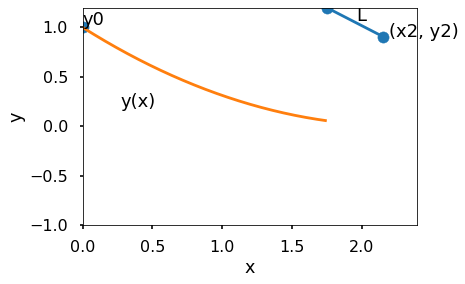

Trial 270: L = 0.60, angle = 0.20 pi, (x1, y1) = (1.75, 1.20)


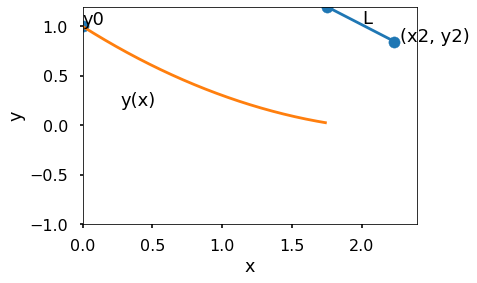

Trial 271: L = 0.10, angle = 0.25 pi, (x1, y1) = (1.75, 1.20)


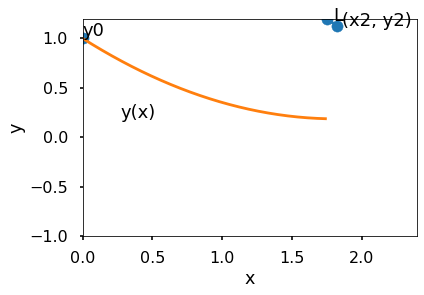

Trial 272: L = 0.20, angle = 0.25 pi, (x1, y1) = (1.75, 1.20)


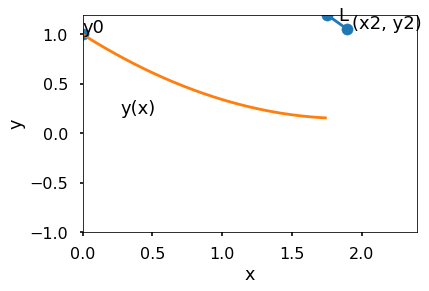

Trial 273: L = 0.30, angle = 0.25 pi, (x1, y1) = (1.75, 1.20)


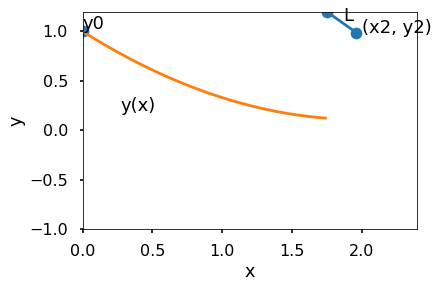

Trial 274: L = 0.40, angle = 0.25 pi, (x1, y1) = (1.75, 1.20)


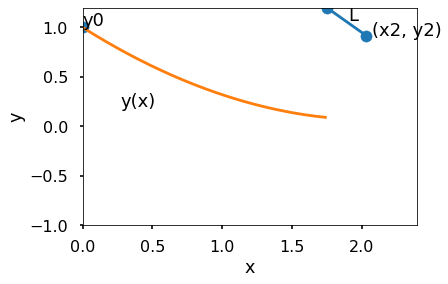

Trial 275: L = 0.50, angle = 0.25 pi, (x1, y1) = (1.75, 1.20)


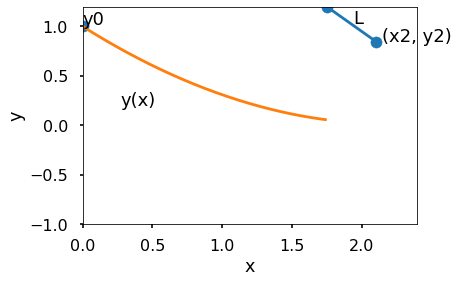

Trial 276: L = 0.60, angle = 0.25 pi, (x1, y1) = (1.75, 1.20)


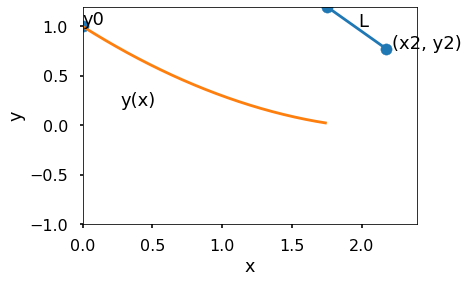

Trial 277: L = 0.10, angle = 0.33 pi, (x1, y1) = (1.75, 1.20)


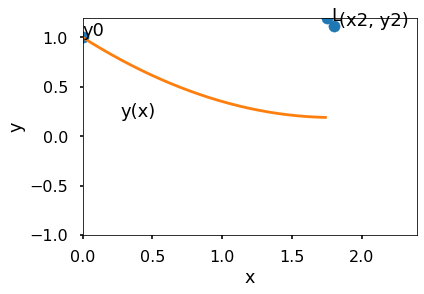

Trial 278: L = 0.20, angle = 0.33 pi, (x1, y1) = (1.75, 1.20)


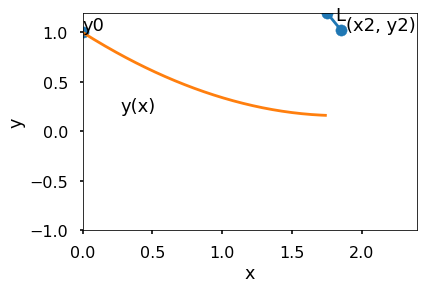

Trial 279: L = 0.30, angle = 0.33 pi, (x1, y1) = (1.75, 1.20)


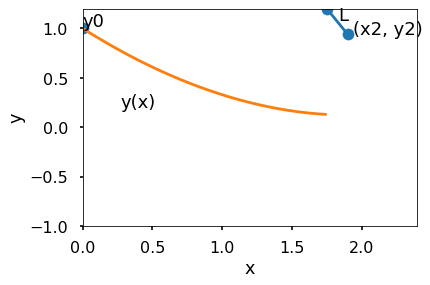

Trial 280: L = 0.40, angle = 0.33 pi, (x1, y1) = (1.75, 1.20)


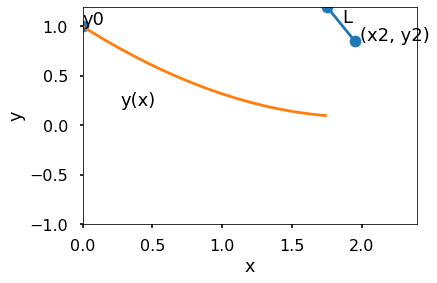

Trial 281: L = 0.50, angle = 0.33 pi, (x1, y1) = (1.75, 1.20)


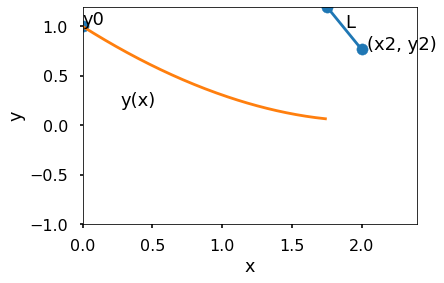

Trial 282: L = 0.60, angle = 0.33 pi, (x1, y1) = (1.75, 1.20)


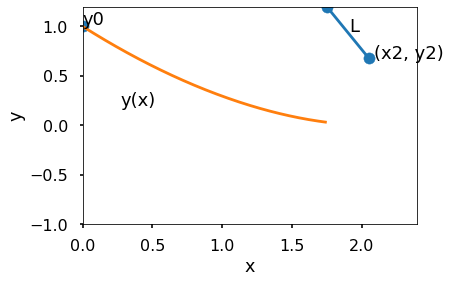

Trial 283: L = 0.10, angle = 0.50 pi, (x1, y1) = (1.75, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


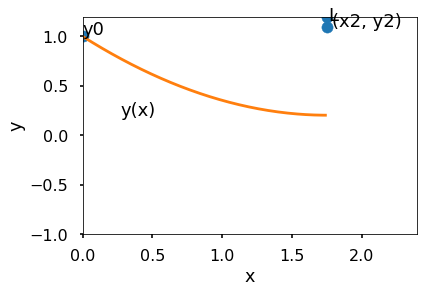

Trial 284: L = 0.20, angle = 0.50 pi, (x1, y1) = (1.75, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


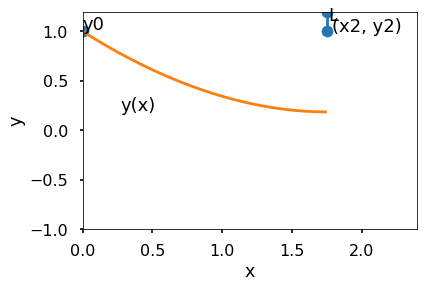

Trial 285: L = 0.30, angle = 0.50 pi, (x1, y1) = (1.75, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


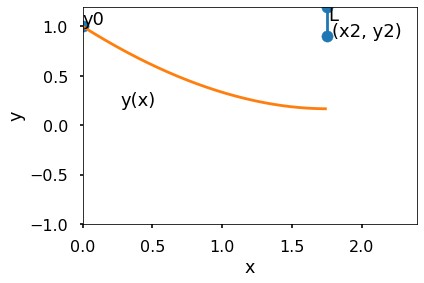

Trial 286: L = 0.40, angle = 0.50 pi, (x1, y1) = (1.75, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


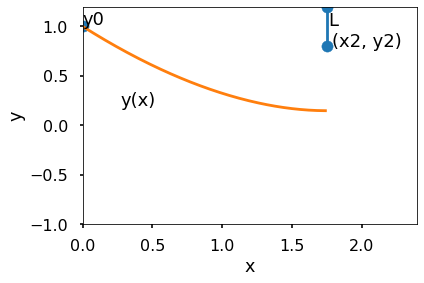

Trial 287: L = 0.50, angle = 0.50 pi, (x1, y1) = (1.75, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


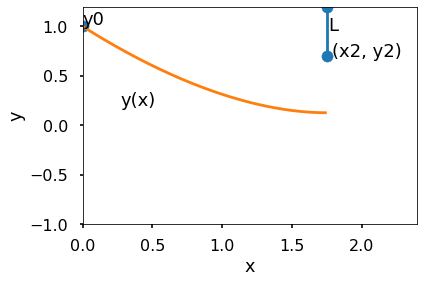

Trial 288: L = 0.60, angle = 0.50 pi, (x1, y1) = (1.75, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


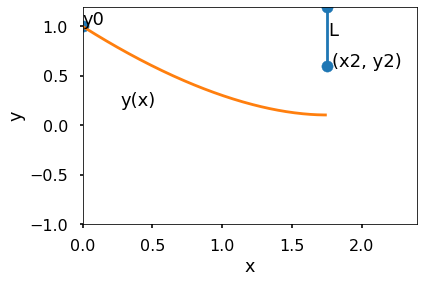

Trial 289: L = 0.10, angle = 0.00 pi, (x1, y1) = (2.00, 0.60)


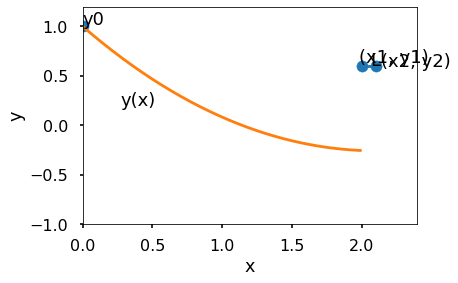

Trial 290: L = 0.20, angle = 0.00 pi, (x1, y1) = (2.00, 0.60)


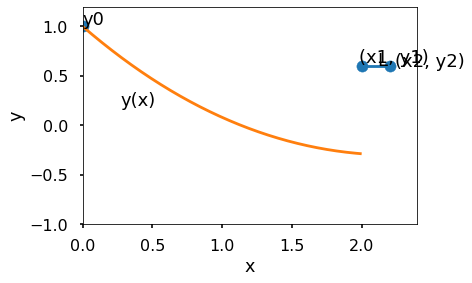

Trial 291: L = 0.30, angle = 0.00 pi, (x1, y1) = (2.00, 0.60)


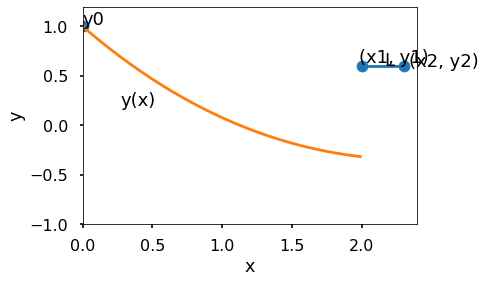

Trial 292: L = 0.40, angle = 0.00 pi, (x1, y1) = (2.00, 0.60)


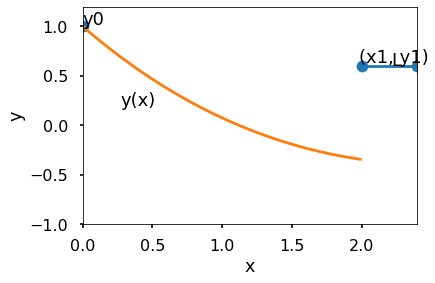

Trial 293: L = 0.50, angle = 0.00 pi, (x1, y1) = (2.00, 0.60)


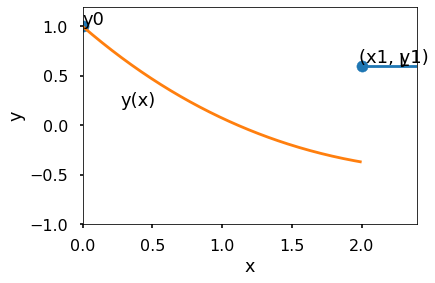

Trial 294: L = 0.60, angle = 0.00 pi, (x1, y1) = (2.00, 0.60)


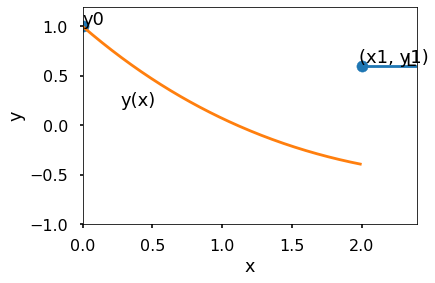

Trial 295: L = 0.10, angle = 0.17 pi, (x1, y1) = (2.00, 0.60)


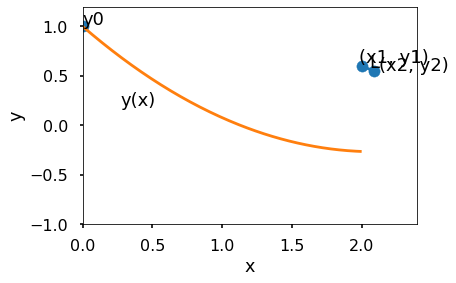

Trial 296: L = 0.20, angle = 0.17 pi, (x1, y1) = (2.00, 0.60)


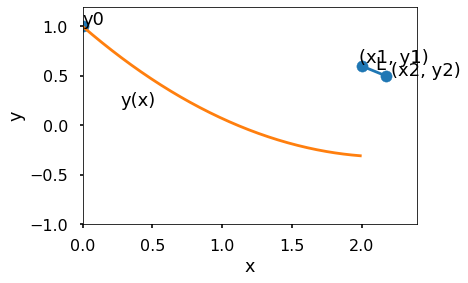

Trial 297: L = 0.30, angle = 0.17 pi, (x1, y1) = (2.00, 0.60)


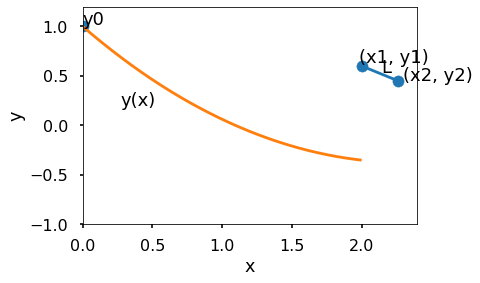

Trial 298: L = 0.40, angle = 0.17 pi, (x1, y1) = (2.00, 0.60)


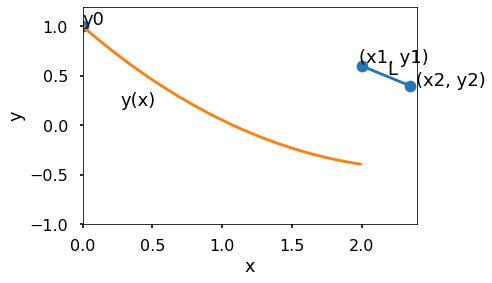

Trial 299: L = 0.50, angle = 0.17 pi, (x1, y1) = (2.00, 0.60)


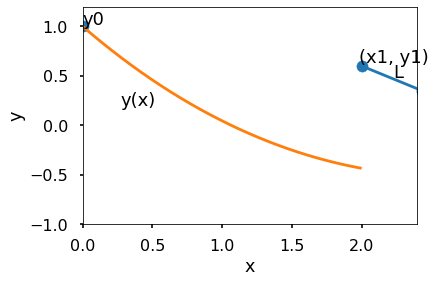

Trial 300: L = 0.60, angle = 0.17 pi, (x1, y1) = (2.00, 0.60)


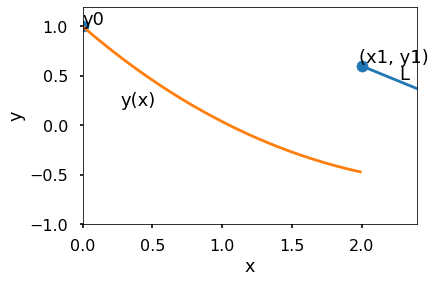

Trial 301: L = 0.10, angle = 0.20 pi, (x1, y1) = (2.00, 0.60)


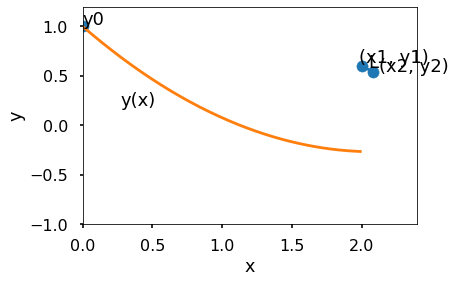

Trial 302: L = 0.20, angle = 0.20 pi, (x1, y1) = (2.00, 0.60)


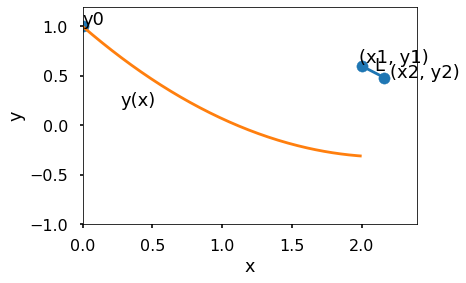

Trial 303: L = 0.30, angle = 0.20 pi, (x1, y1) = (2.00, 0.60)


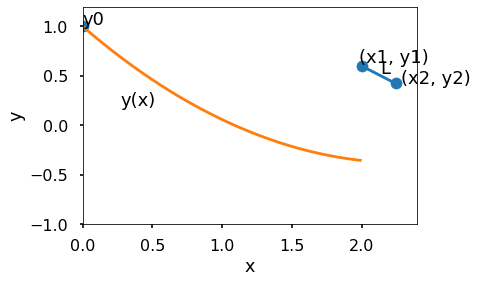

Trial 304: L = 0.40, angle = 0.20 pi, (x1, y1) = (2.00, 0.60)


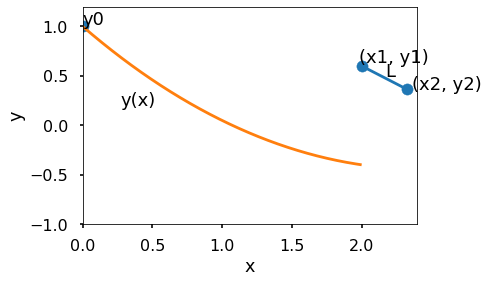

Trial 305: L = 0.50, angle = 0.20 pi, (x1, y1) = (2.00, 0.60)


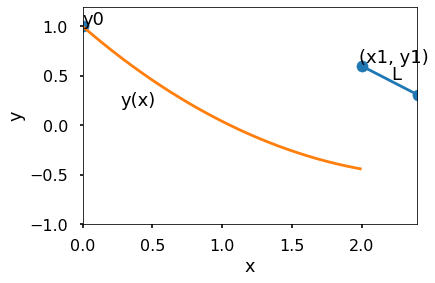

Trial 306: L = 0.60, angle = 0.20 pi, (x1, y1) = (2.00, 0.60)


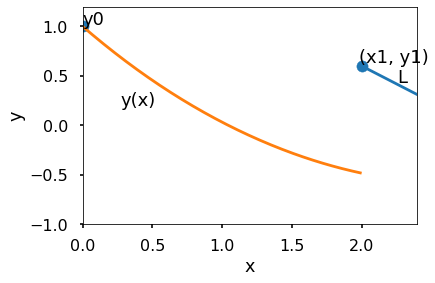

Trial 307: L = 0.10, angle = 0.25 pi, (x1, y1) = (2.00, 0.60)


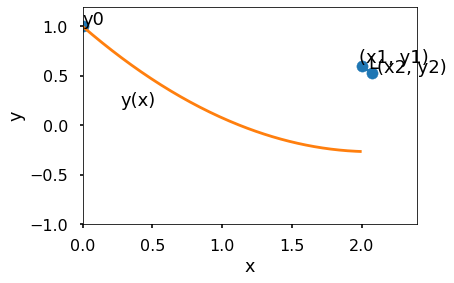

Trial 308: L = 0.20, angle = 0.25 pi, (x1, y1) = (2.00, 0.60)


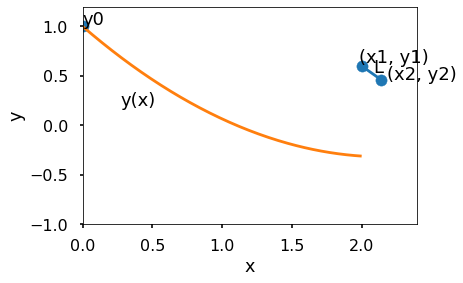

Trial 309: L = 0.30, angle = 0.25 pi, (x1, y1) = (2.00, 0.60)


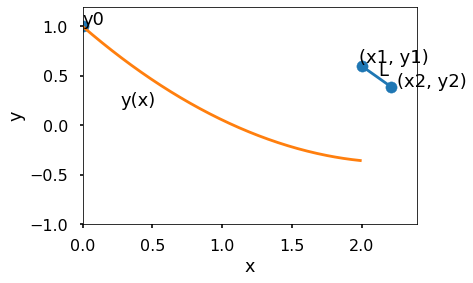

Trial 310: L = 0.40, angle = 0.25 pi, (x1, y1) = (2.00, 0.60)


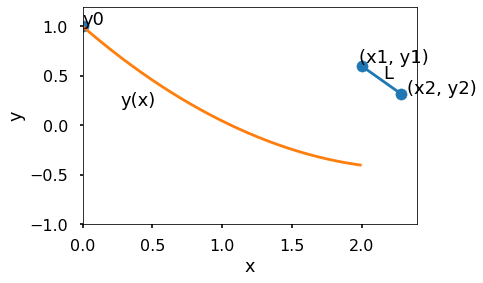

Trial 311: L = 0.50, angle = 0.25 pi, (x1, y1) = (2.00, 0.60)


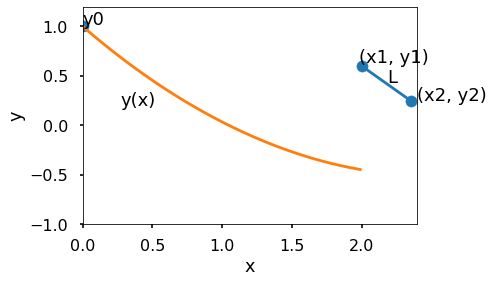

Trial 312: L = 0.60, angle = 0.25 pi, (x1, y1) = (2.00, 0.60)


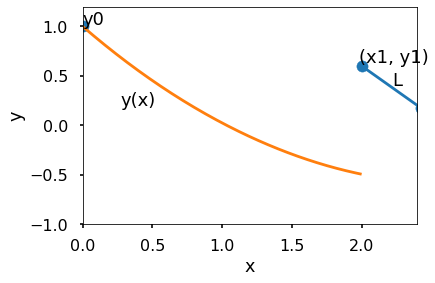

Trial 313: L = 0.10, angle = 0.33 pi, (x1, y1) = (2.00, 0.60)


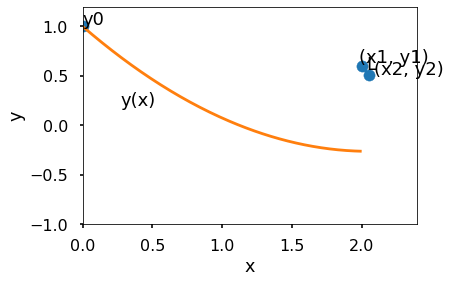

Trial 314: L = 0.20, angle = 0.33 pi, (x1, y1) = (2.00, 0.60)


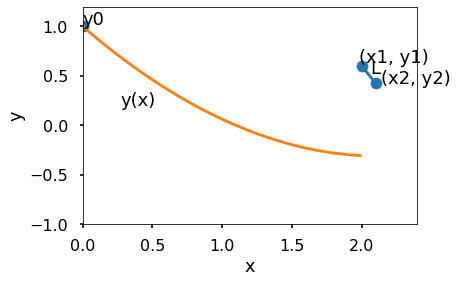

Trial 315: L = 0.30, angle = 0.33 pi, (x1, y1) = (2.00, 0.60)


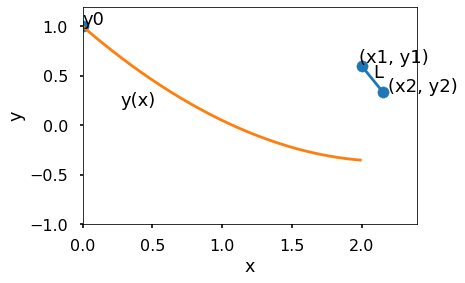

Trial 316: L = 0.40, angle = 0.33 pi, (x1, y1) = (2.00, 0.60)


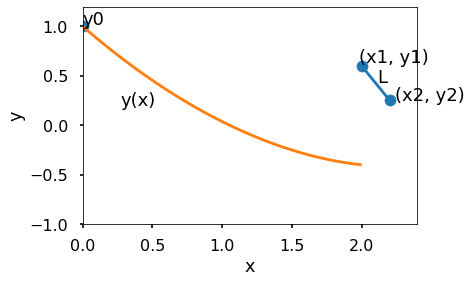

Trial 317: L = 0.50, angle = 0.33 pi, (x1, y1) = (2.00, 0.60)


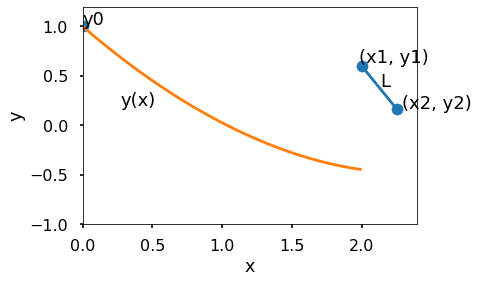

Trial 318: L = 0.60, angle = 0.33 pi, (x1, y1) = (2.00, 0.60)


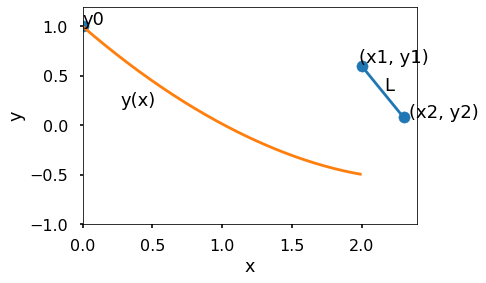

Trial 319: L = 0.10, angle = 0.50 pi, (x1, y1) = (2.00, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


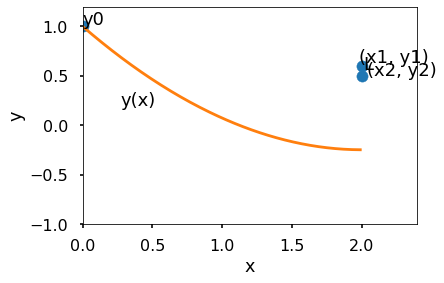

Trial 320: L = 0.20, angle = 0.50 pi, (x1, y1) = (2.00, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


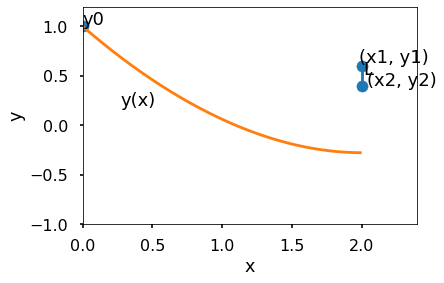

Trial 321: L = 0.30, angle = 0.50 pi, (x1, y1) = (2.00, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


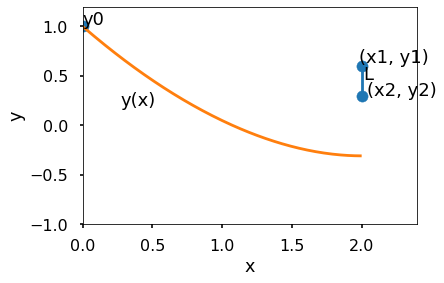

Trial 322: L = 0.40, angle = 0.50 pi, (x1, y1) = (2.00, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


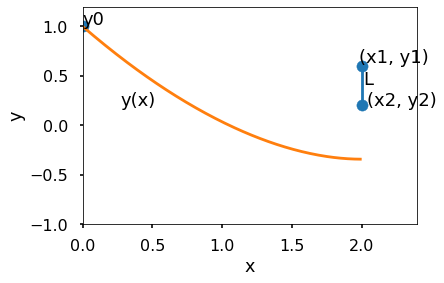

Trial 323: L = 0.50, angle = 0.50 pi, (x1, y1) = (2.00, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


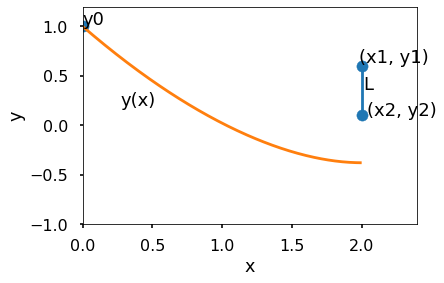

Trial 324: L = 0.60, angle = 0.50 pi, (x1, y1) = (2.00, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


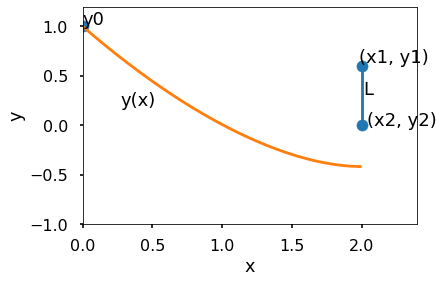

Trial 325: L = 0.10, angle = 0.00 pi, (x1, y1) = (2.00, 0.80)


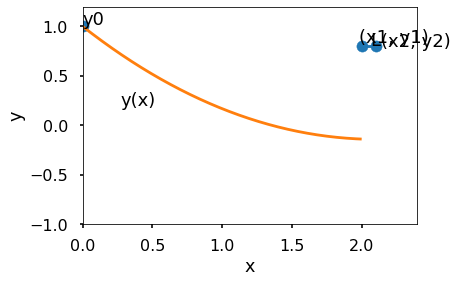

Trial 326: L = 0.20, angle = 0.00 pi, (x1, y1) = (2.00, 0.80)


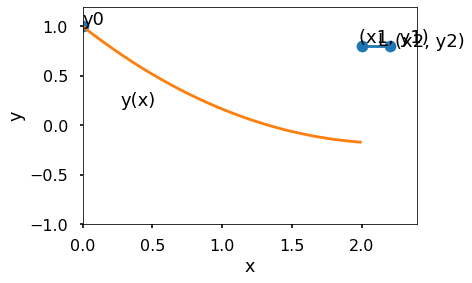

Trial 327: L = 0.30, angle = 0.00 pi, (x1, y1) = (2.00, 0.80)


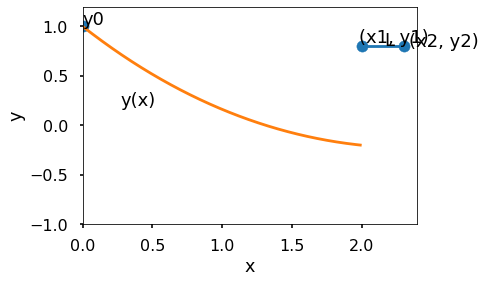

Trial 328: L = 0.40, angle = 0.00 pi, (x1, y1) = (2.00, 0.80)


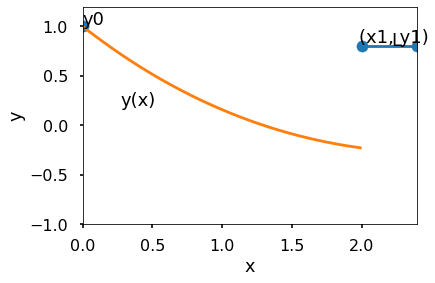

Trial 329: L = 0.50, angle = 0.00 pi, (x1, y1) = (2.00, 0.80)


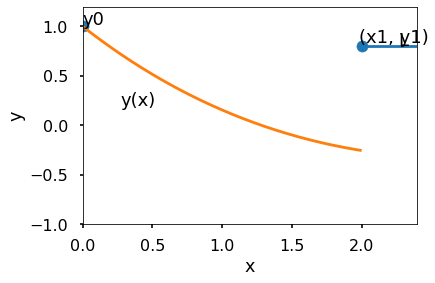

Trial 330: L = 0.60, angle = 0.00 pi, (x1, y1) = (2.00, 0.80)


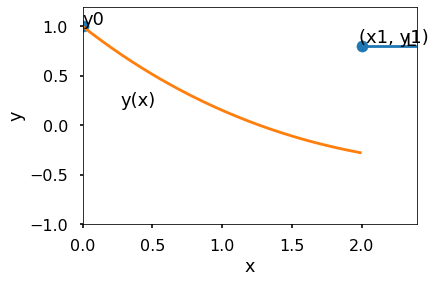

Trial 331: L = 0.10, angle = 0.17 pi, (x1, y1) = (2.00, 0.80)


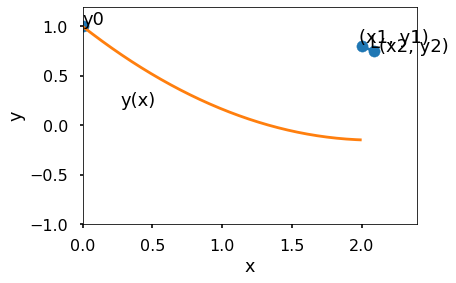

Trial 332: L = 0.20, angle = 0.17 pi, (x1, y1) = (2.00, 0.80)


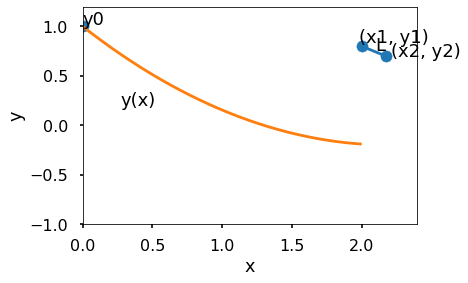

Trial 333: L = 0.30, angle = 0.17 pi, (x1, y1) = (2.00, 0.80)


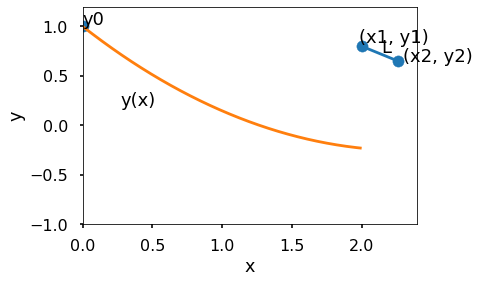

Trial 334: L = 0.40, angle = 0.17 pi, (x1, y1) = (2.00, 0.80)


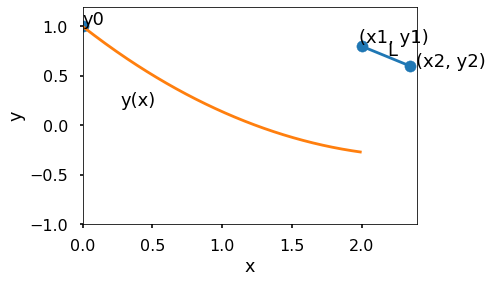

Trial 335: L = 0.50, angle = 0.17 pi, (x1, y1) = (2.00, 0.80)


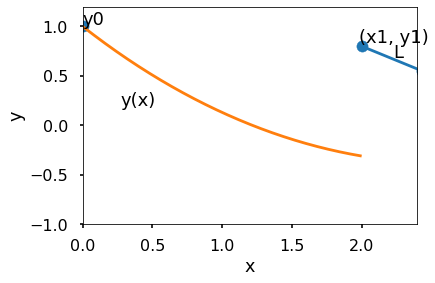

Trial 336: L = 0.60, angle = 0.17 pi, (x1, y1) = (2.00, 0.80)


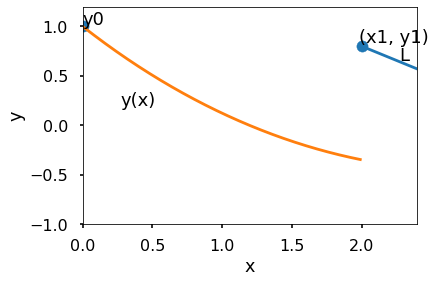

Trial 337: L = 0.10, angle = 0.20 pi, (x1, y1) = (2.00, 0.80)


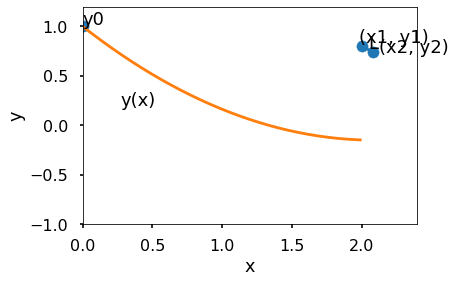

Trial 338: L = 0.20, angle = 0.20 pi, (x1, y1) = (2.00, 0.80)


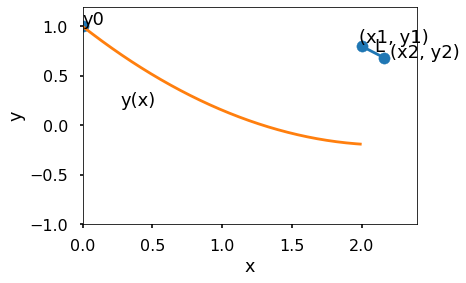

Trial 339: L = 0.30, angle = 0.20 pi, (x1, y1) = (2.00, 0.80)


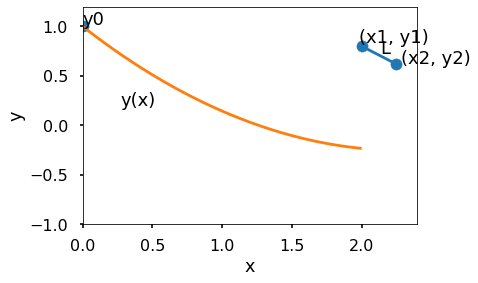

Trial 340: L = 0.40, angle = 0.20 pi, (x1, y1) = (2.00, 0.80)


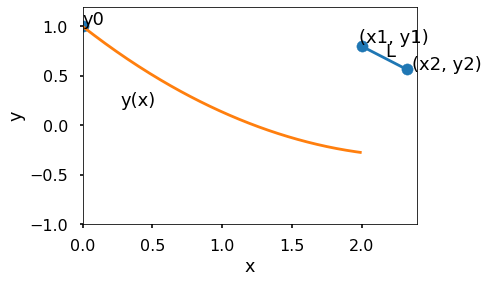

Trial 341: L = 0.50, angle = 0.20 pi, (x1, y1) = (2.00, 0.80)


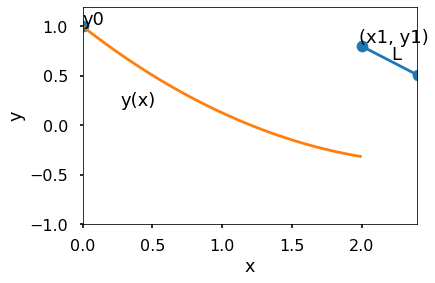

Trial 342: L = 0.60, angle = 0.20 pi, (x1, y1) = (2.00, 0.80)


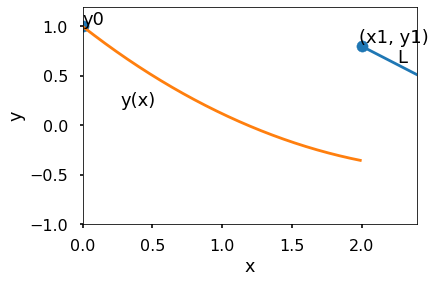

Trial 343: L = 0.10, angle = 0.25 pi, (x1, y1) = (2.00, 0.80)


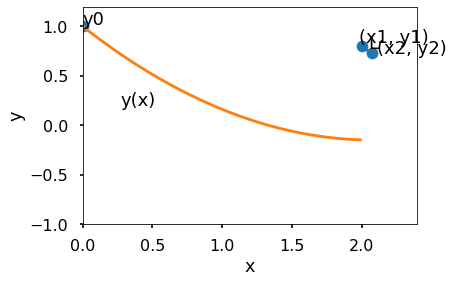

Trial 344: L = 0.20, angle = 0.25 pi, (x1, y1) = (2.00, 0.80)


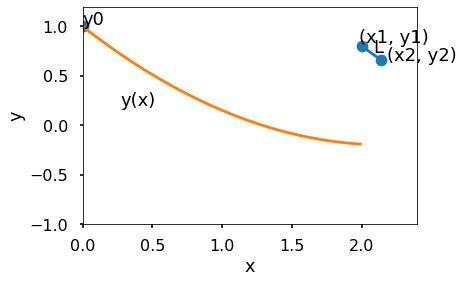

Trial 345: L = 0.30, angle = 0.25 pi, (x1, y1) = (2.00, 0.80)


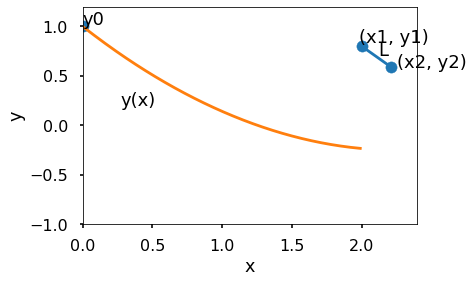

Trial 346: L = 0.40, angle = 0.25 pi, (x1, y1) = (2.00, 0.80)


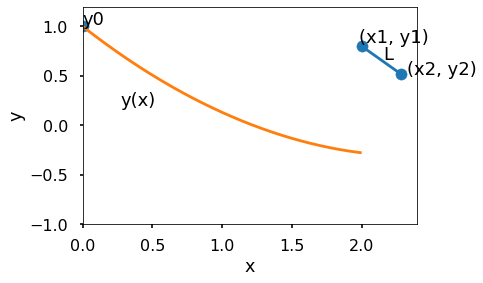

Trial 347: L = 0.50, angle = 0.25 pi, (x1, y1) = (2.00, 0.80)


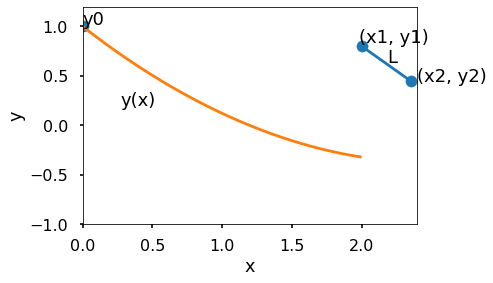

Trial 348: L = 0.60, angle = 0.25 pi, (x1, y1) = (2.00, 0.80)


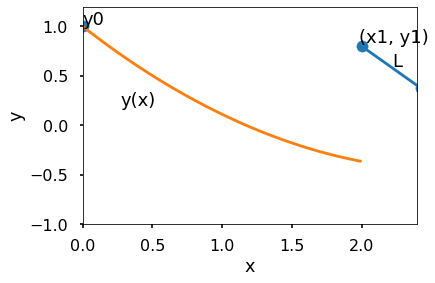

Trial 349: L = 0.10, angle = 0.33 pi, (x1, y1) = (2.00, 0.80)


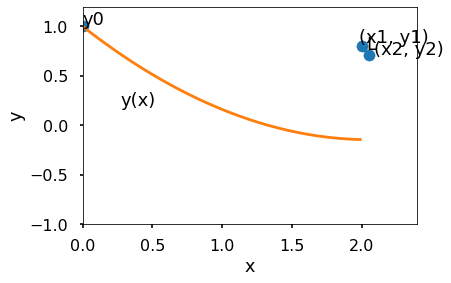

Trial 350: L = 0.20, angle = 0.33 pi, (x1, y1) = (2.00, 0.80)


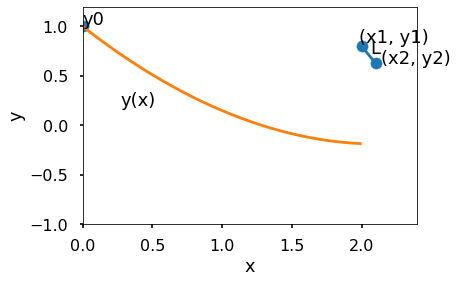

Trial 351: L = 0.30, angle = 0.33 pi, (x1, y1) = (2.00, 0.80)


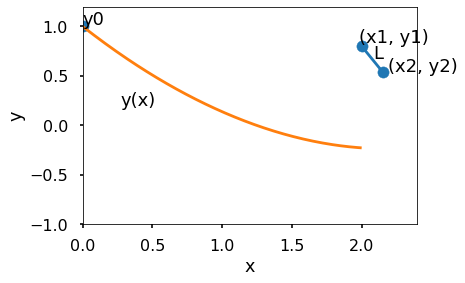

Trial 352: L = 0.40, angle = 0.33 pi, (x1, y1) = (2.00, 0.80)


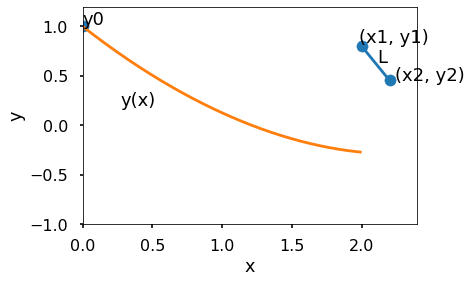

Trial 353: L = 0.50, angle = 0.33 pi, (x1, y1) = (2.00, 0.80)


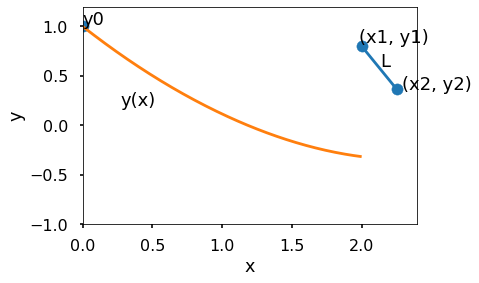

Trial 354: L = 0.60, angle = 0.33 pi, (x1, y1) = (2.00, 0.80)


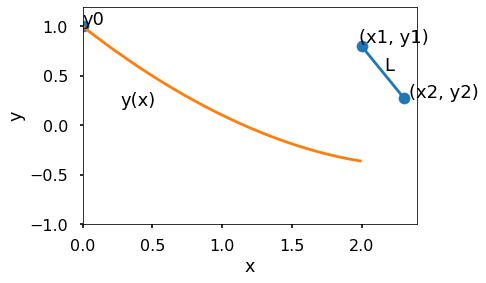

Trial 355: L = 0.10, angle = 0.50 pi, (x1, y1) = (2.00, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


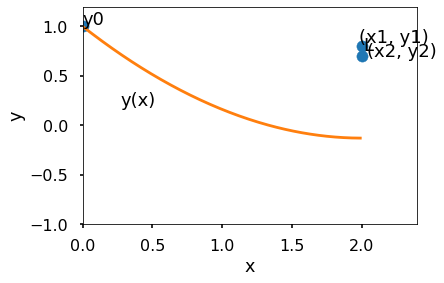

Trial 356: L = 0.20, angle = 0.50 pi, (x1, y1) = (2.00, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


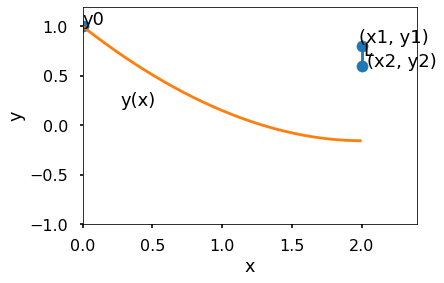

Trial 357: L = 0.30, angle = 0.50 pi, (x1, y1) = (2.00, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


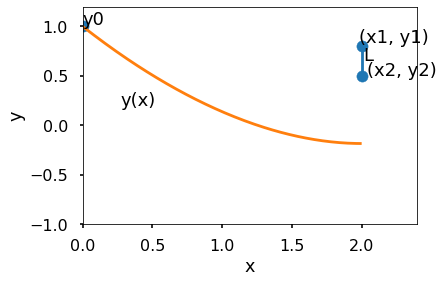

Trial 358: L = 0.40, angle = 0.50 pi, (x1, y1) = (2.00, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


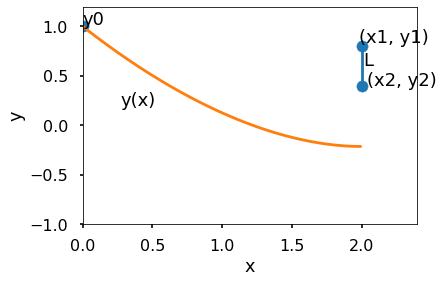

Trial 359: L = 0.50, angle = 0.50 pi, (x1, y1) = (2.00, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


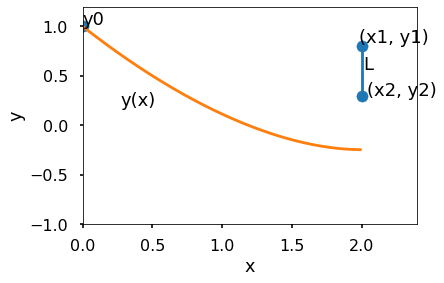

Trial 360: L = 0.60, angle = 0.50 pi, (x1, y1) = (2.00, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


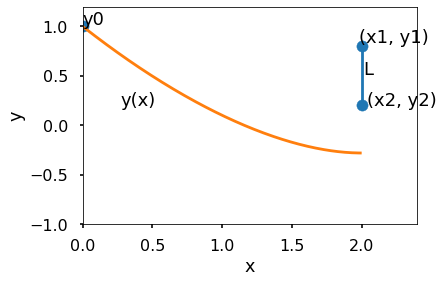

Trial 361: L = 0.10, angle = 0.00 pi, (x1, y1) = (2.00, 1.00)


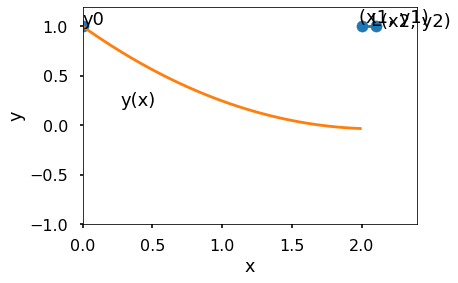

Trial 362: L = 0.20, angle = 0.00 pi, (x1, y1) = (2.00, 1.00)


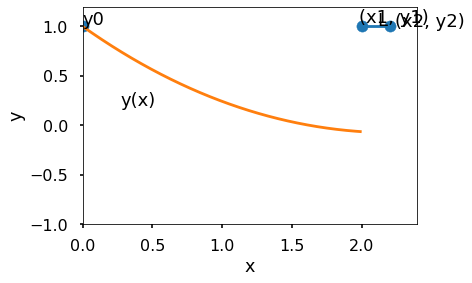

Trial 363: L = 0.30, angle = 0.00 pi, (x1, y1) = (2.00, 1.00)


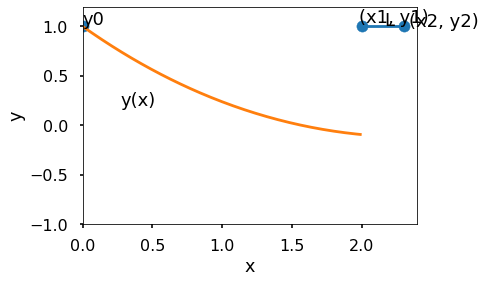

Trial 364: L = 0.40, angle = 0.00 pi, (x1, y1) = (2.00, 1.00)


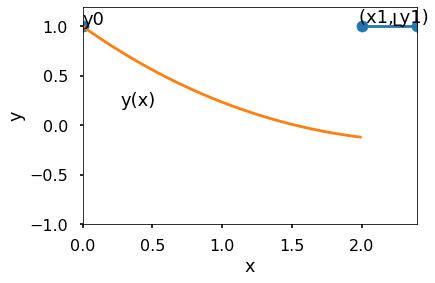

Trial 365: L = 0.50, angle = 0.00 pi, (x1, y1) = (2.00, 1.00)


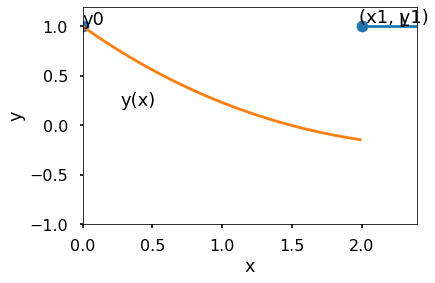

Trial 366: L = 0.60, angle = 0.00 pi, (x1, y1) = (2.00, 1.00)


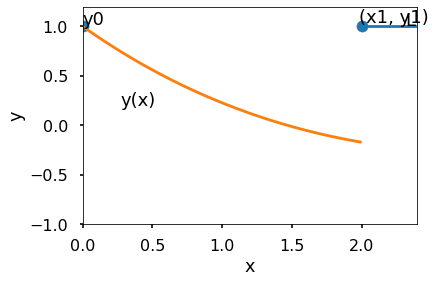

Trial 367: L = 0.10, angle = 0.17 pi, (x1, y1) = (2.00, 1.00)


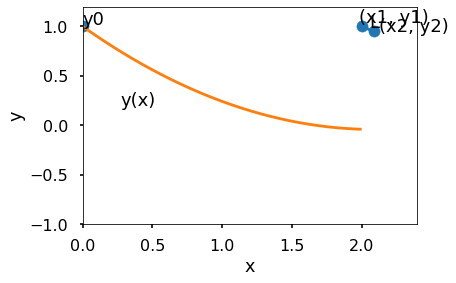

Trial 368: L = 0.20, angle = 0.17 pi, (x1, y1) = (2.00, 1.00)


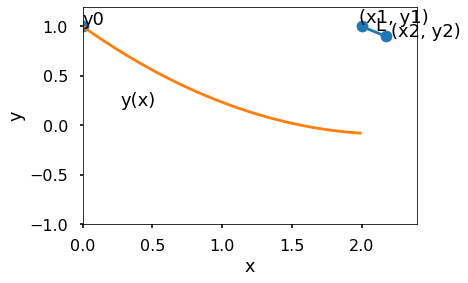

Trial 369: L = 0.30, angle = 0.17 pi, (x1, y1) = (2.00, 1.00)


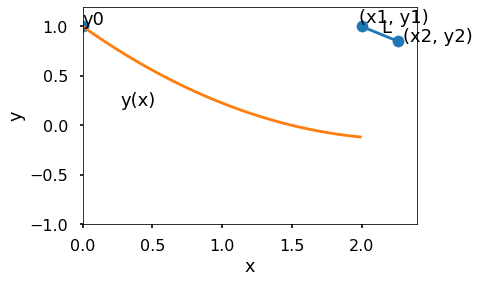

Trial 370: L = 0.40, angle = 0.17 pi, (x1, y1) = (2.00, 1.00)


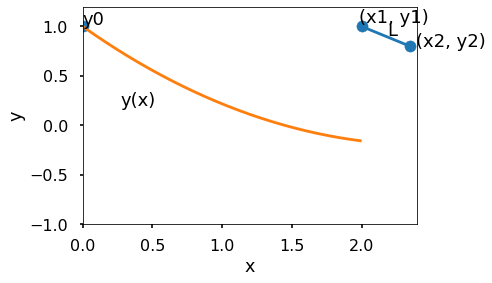

Trial 371: L = 0.50, angle = 0.17 pi, (x1, y1) = (2.00, 1.00)


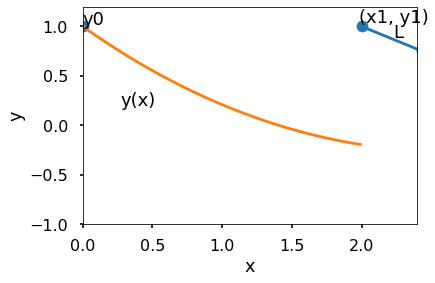

Trial 372: L = 0.60, angle = 0.17 pi, (x1, y1) = (2.00, 1.00)


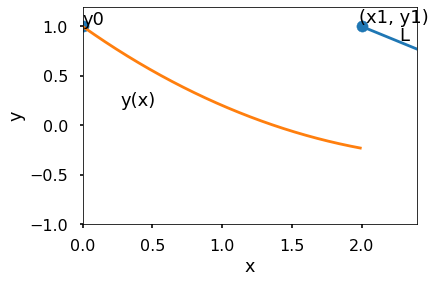

Trial 373: L = 0.10, angle = 0.20 pi, (x1, y1) = (2.00, 1.00)


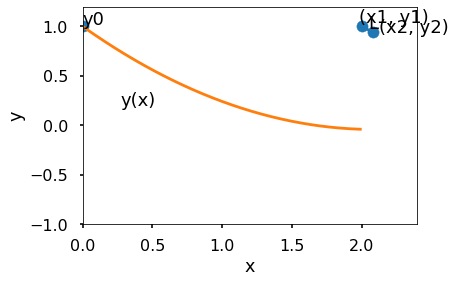

Trial 374: L = 0.20, angle = 0.20 pi, (x1, y1) = (2.00, 1.00)


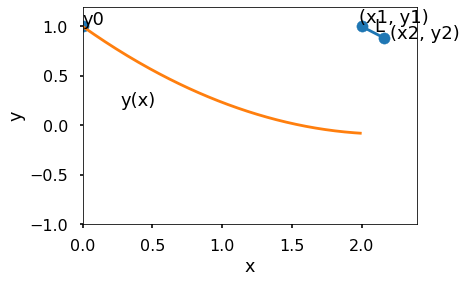

Trial 375: L = 0.30, angle = 0.20 pi, (x1, y1) = (2.00, 1.00)


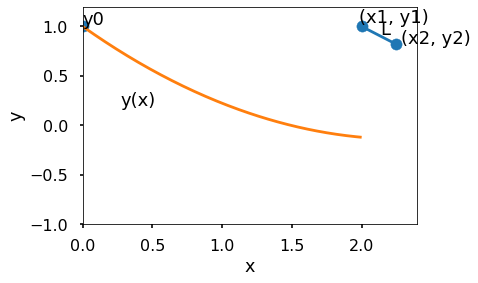

Trial 376: L = 0.40, angle = 0.20 pi, (x1, y1) = (2.00, 1.00)


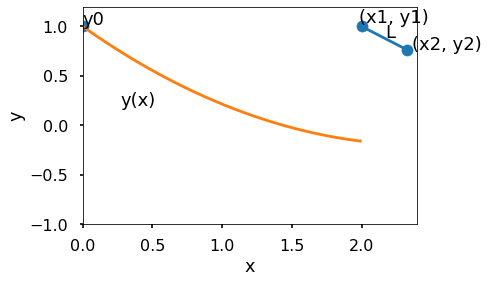

Trial 377: L = 0.50, angle = 0.20 pi, (x1, y1) = (2.00, 1.00)


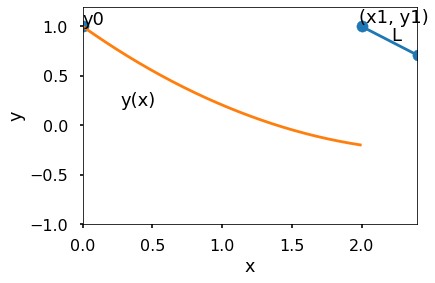

Trial 378: L = 0.60, angle = 0.20 pi, (x1, y1) = (2.00, 1.00)


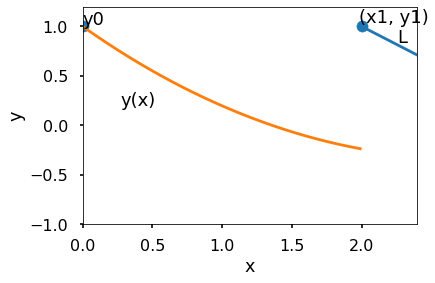

Trial 379: L = 0.10, angle = 0.25 pi, (x1, y1) = (2.00, 1.00)


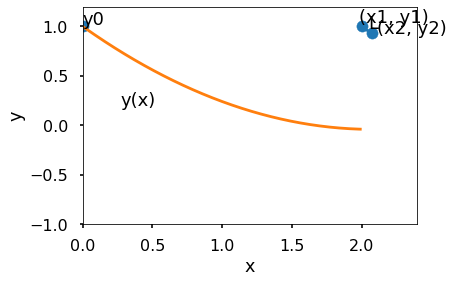

Trial 380: L = 0.20, angle = 0.25 pi, (x1, y1) = (2.00, 1.00)


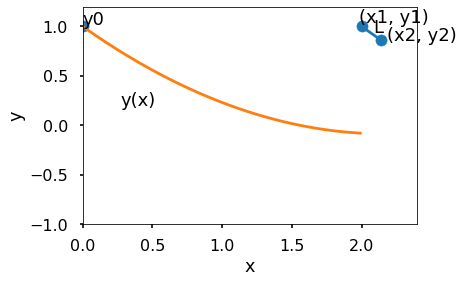

Trial 381: L = 0.30, angle = 0.25 pi, (x1, y1) = (2.00, 1.00)


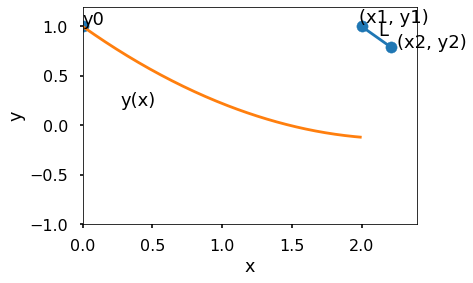

Trial 382: L = 0.40, angle = 0.25 pi, (x1, y1) = (2.00, 1.00)


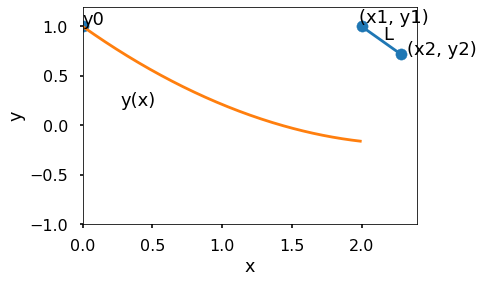

Trial 383: L = 0.50, angle = 0.25 pi, (x1, y1) = (2.00, 1.00)


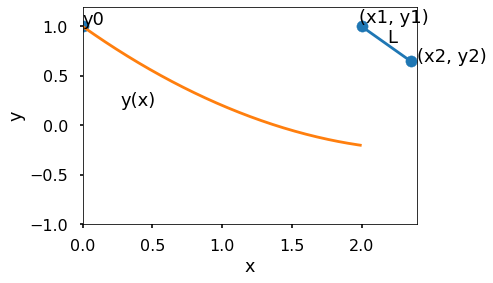

Trial 384: L = 0.60, angle = 0.25 pi, (x1, y1) = (2.00, 1.00)


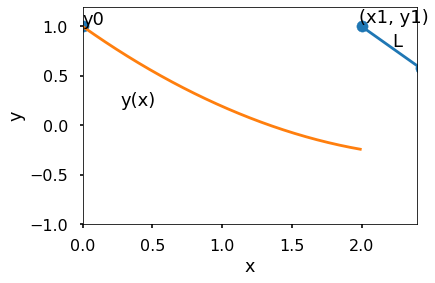

Trial 385: L = 0.10, angle = 0.33 pi, (x1, y1) = (2.00, 1.00)


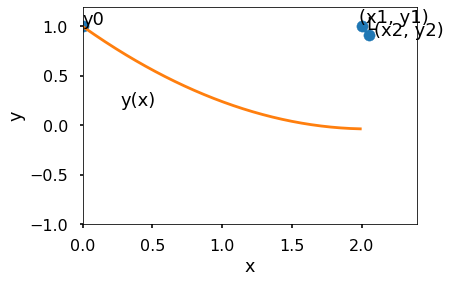

Trial 386: L = 0.20, angle = 0.33 pi, (x1, y1) = (2.00, 1.00)


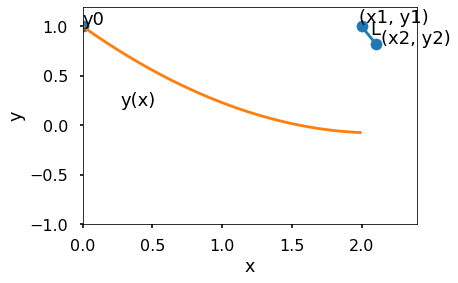

Trial 387: L = 0.30, angle = 0.33 pi, (x1, y1) = (2.00, 1.00)


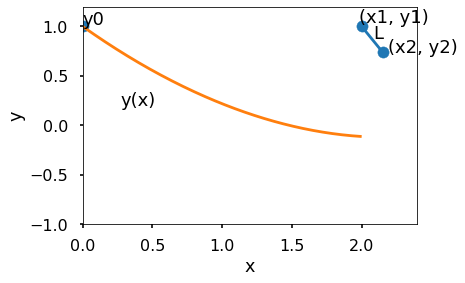

Trial 388: L = 0.40, angle = 0.33 pi, (x1, y1) = (2.00, 1.00)


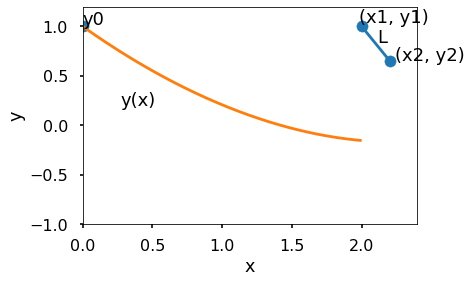

Trial 389: L = 0.50, angle = 0.33 pi, (x1, y1) = (2.00, 1.00)


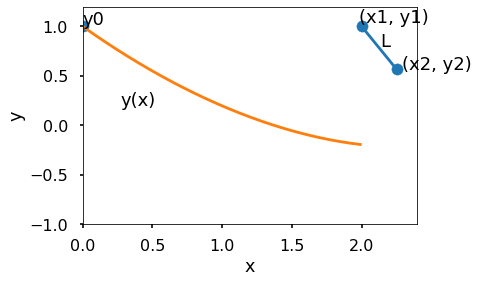

Trial 390: L = 0.60, angle = 0.33 pi, (x1, y1) = (2.00, 1.00)


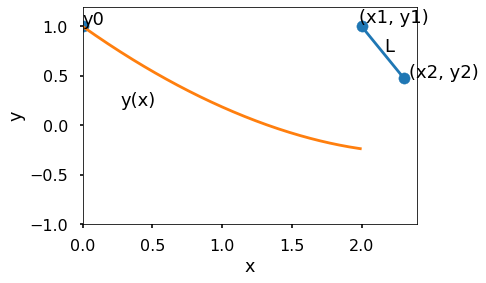

Trial 391: L = 0.10, angle = 0.50 pi, (x1, y1) = (2.00, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


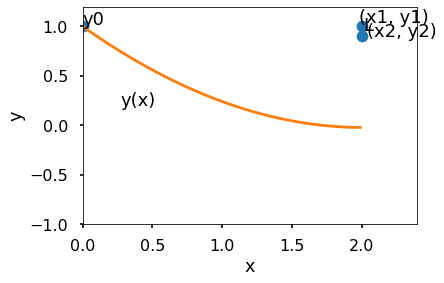

Trial 392: L = 0.20, angle = 0.50 pi, (x1, y1) = (2.00, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


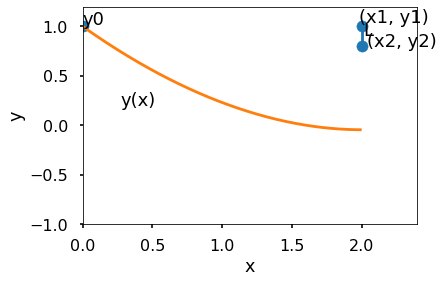

Trial 393: L = 0.30, angle = 0.50 pi, (x1, y1) = (2.00, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


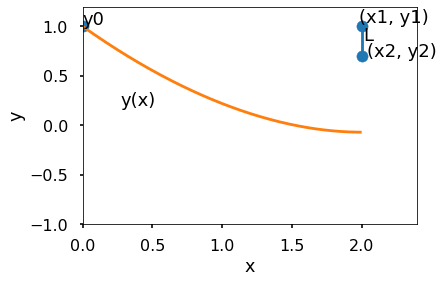

Trial 394: L = 0.40, angle = 0.50 pi, (x1, y1) = (2.00, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


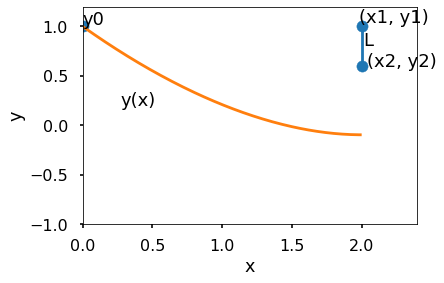

Trial 395: L = 0.50, angle = 0.50 pi, (x1, y1) = (2.00, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


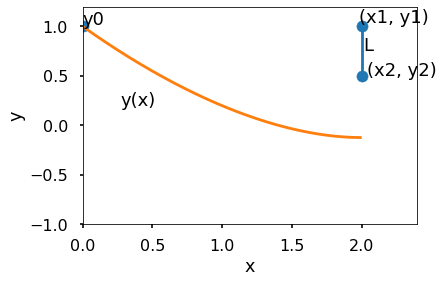

Trial 396: L = 0.60, angle = 0.50 pi, (x1, y1) = (2.00, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


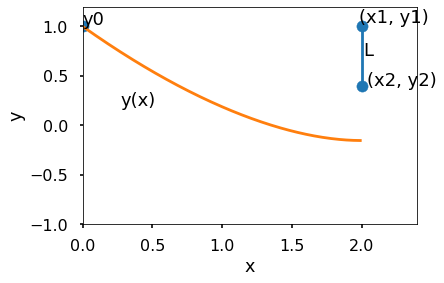

Trial 397: L = 0.10, angle = 0.00 pi, (x1, y1) = (2.00, 1.20)


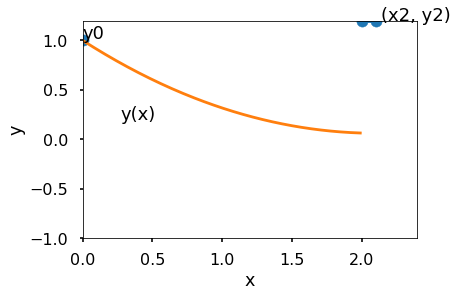

Trial 398: L = 0.20, angle = 0.00 pi, (x1, y1) = (2.00, 1.20)


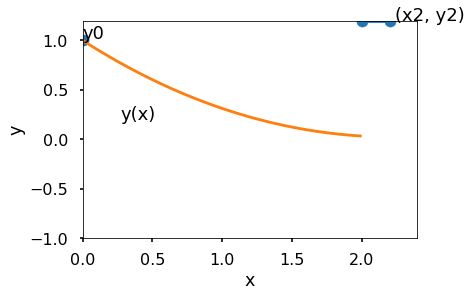

Trial 399: L = 0.30, angle = 0.00 pi, (x1, y1) = (2.00, 1.20)


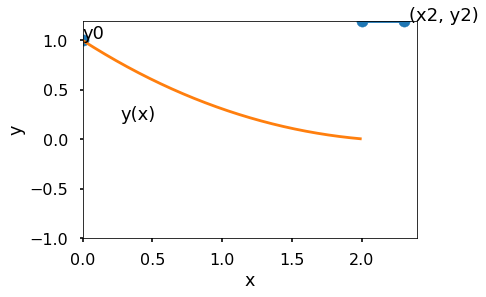

Trial 400: L = 0.40, angle = 0.00 pi, (x1, y1) = (2.00, 1.20)


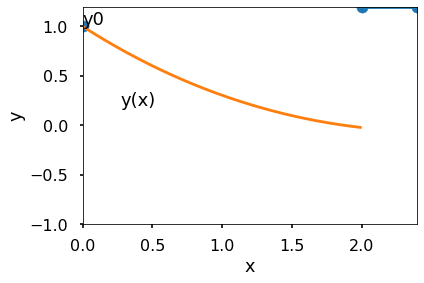

Trial 401: L = 0.50, angle = 0.00 pi, (x1, y1) = (2.00, 1.20)


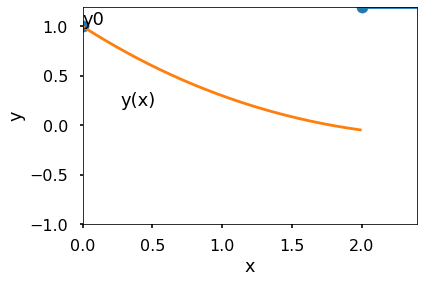

Trial 402: L = 0.60, angle = 0.00 pi, (x1, y1) = (2.00, 1.20)


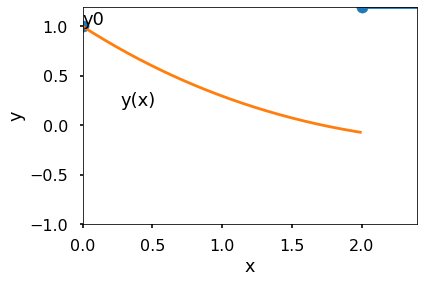

Trial 403: L = 0.10, angle = 0.17 pi, (x1, y1) = (2.00, 1.20)


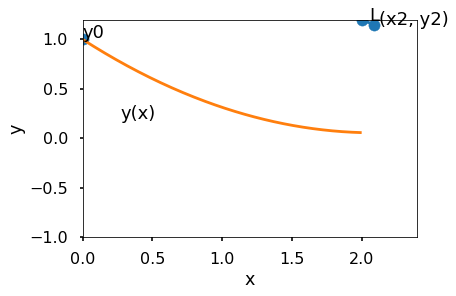

Trial 404: L = 0.20, angle = 0.17 pi, (x1, y1) = (2.00, 1.20)


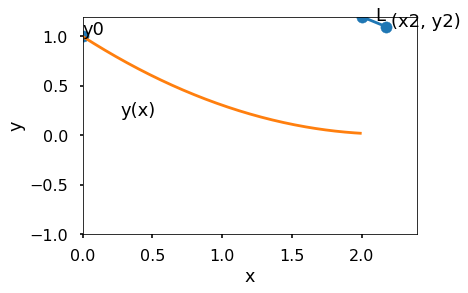

Trial 405: L = 0.30, angle = 0.17 pi, (x1, y1) = (2.00, 1.20)


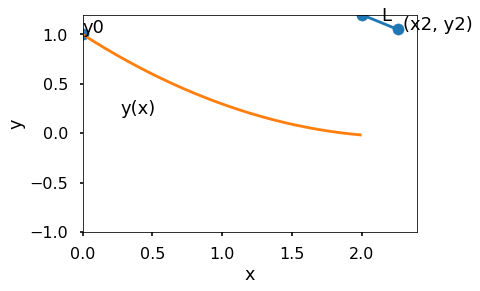

Trial 406: L = 0.40, angle = 0.17 pi, (x1, y1) = (2.00, 1.20)


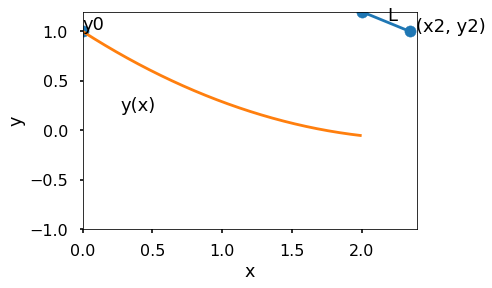

Trial 407: L = 0.50, angle = 0.17 pi, (x1, y1) = (2.00, 1.20)


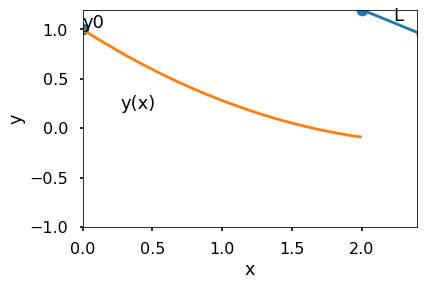

Trial 408: L = 0.60, angle = 0.17 pi, (x1, y1) = (2.00, 1.20)


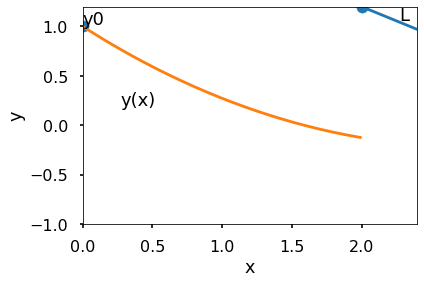

Trial 409: L = 0.10, angle = 0.20 pi, (x1, y1) = (2.00, 1.20)


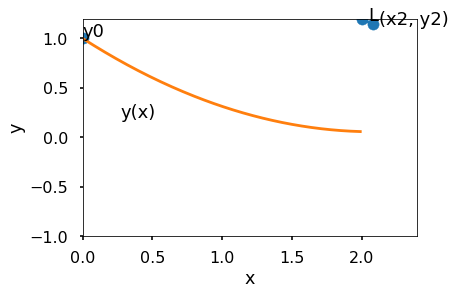

Trial 410: L = 0.20, angle = 0.20 pi, (x1, y1) = (2.00, 1.20)


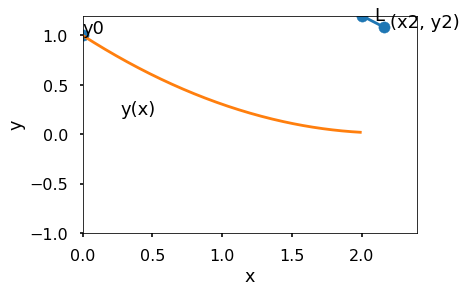

Trial 411: L = 0.30, angle = 0.20 pi, (x1, y1) = (2.00, 1.20)


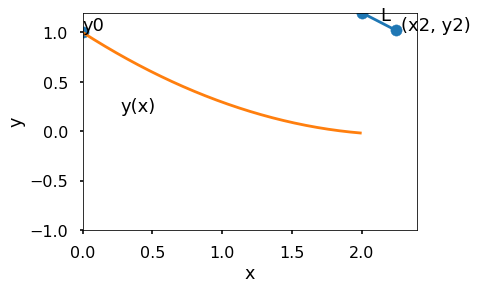

Trial 412: L = 0.40, angle = 0.20 pi, (x1, y1) = (2.00, 1.20)


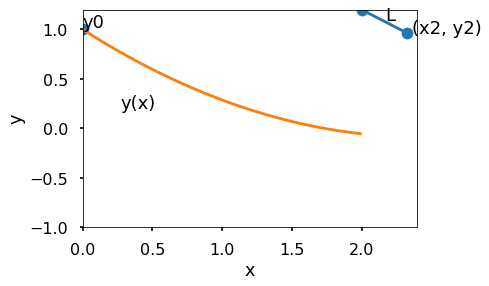

Trial 413: L = 0.50, angle = 0.20 pi, (x1, y1) = (2.00, 1.20)


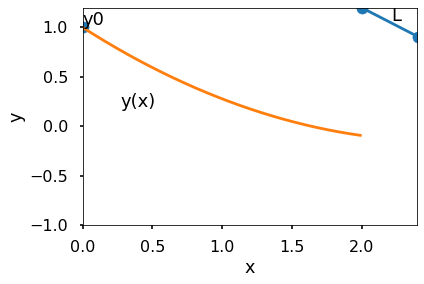

Trial 414: L = 0.60, angle = 0.20 pi, (x1, y1) = (2.00, 1.20)


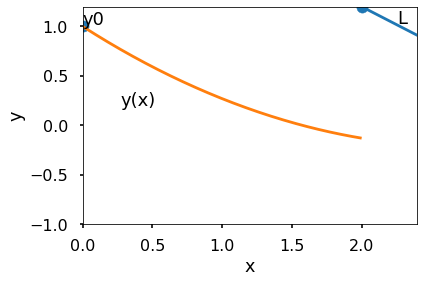

Trial 415: L = 0.10, angle = 0.25 pi, (x1, y1) = (2.00, 1.20)


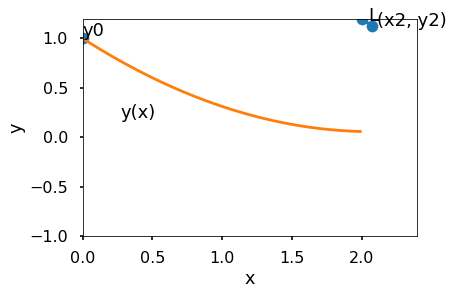

Trial 416: L = 0.20, angle = 0.25 pi, (x1, y1) = (2.00, 1.20)


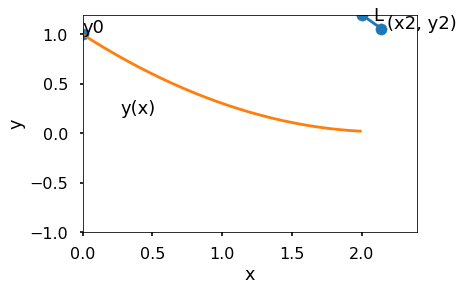

Trial 417: L = 0.30, angle = 0.25 pi, (x1, y1) = (2.00, 1.20)


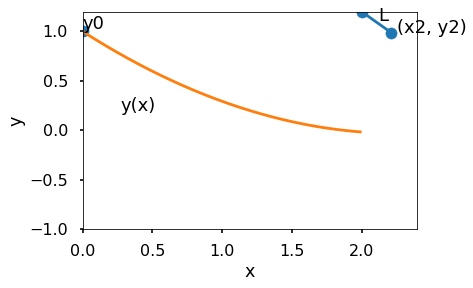

Trial 418: L = 0.40, angle = 0.25 pi, (x1, y1) = (2.00, 1.20)


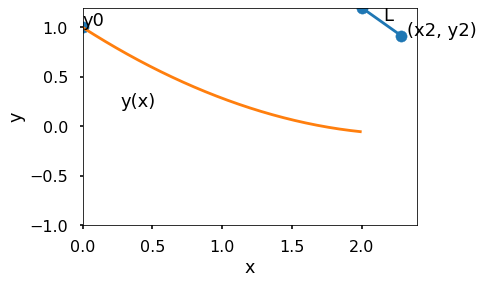

Trial 419: L = 0.50, angle = 0.25 pi, (x1, y1) = (2.00, 1.20)


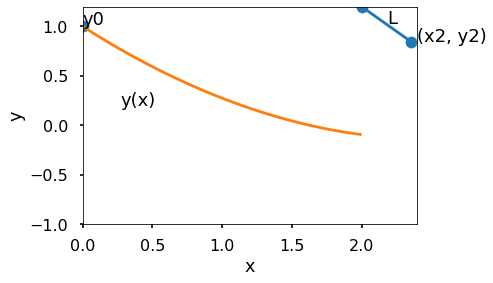

Trial 420: L = 0.60, angle = 0.25 pi, (x1, y1) = (2.00, 1.20)


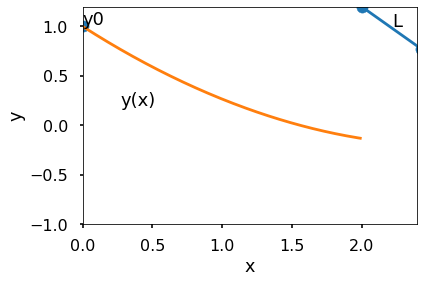

Trial 421: L = 0.10, angle = 0.33 pi, (x1, y1) = (2.00, 1.20)


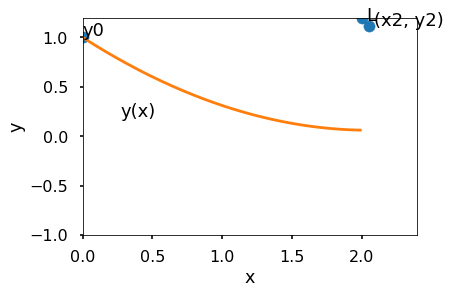

Trial 422: L = 0.20, angle = 0.33 pi, (x1, y1) = (2.00, 1.20)


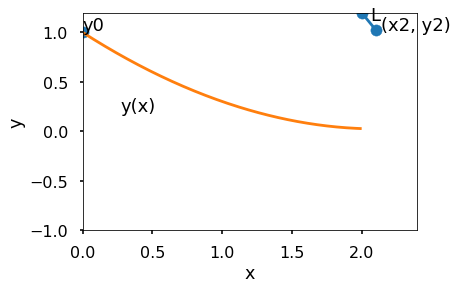

Trial 423: L = 0.30, angle = 0.33 pi, (x1, y1) = (2.00, 1.20)


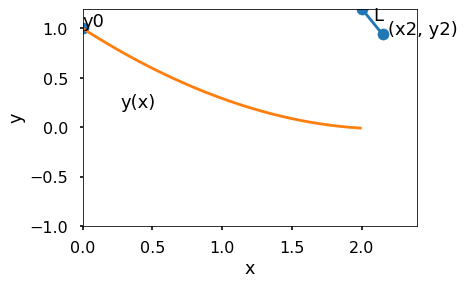

Trial 424: L = 0.40, angle = 0.33 pi, (x1, y1) = (2.00, 1.20)


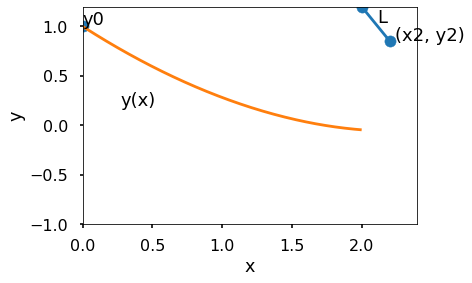

Trial 425: L = 0.50, angle = 0.33 pi, (x1, y1) = (2.00, 1.20)


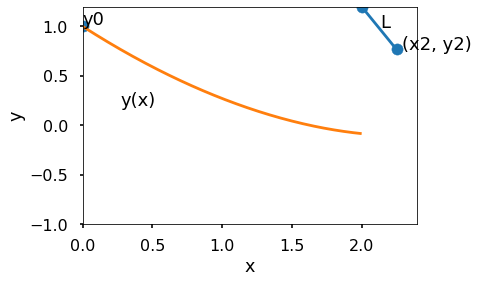

Trial 426: L = 0.60, angle = 0.33 pi, (x1, y1) = (2.00, 1.20)


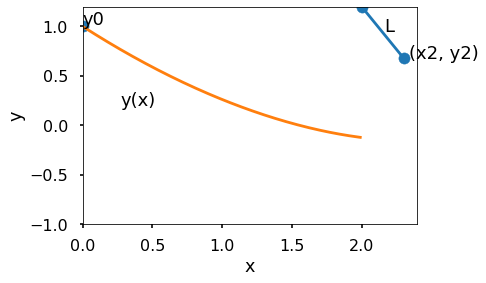

Trial 427: L = 0.10, angle = 0.50 pi, (x1, y1) = (2.00, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


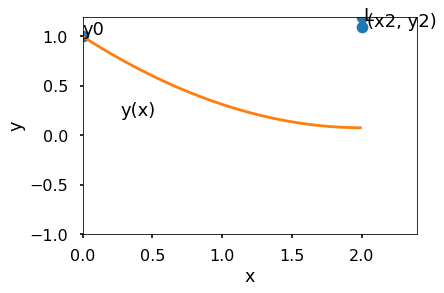

Trial 428: L = 0.20, angle = 0.50 pi, (x1, y1) = (2.00, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


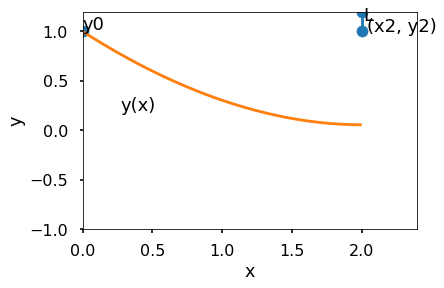

Trial 429: L = 0.30, angle = 0.50 pi, (x1, y1) = (2.00, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


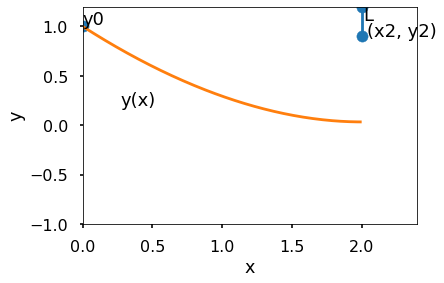

Trial 430: L = 0.40, angle = 0.50 pi, (x1, y1) = (2.00, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


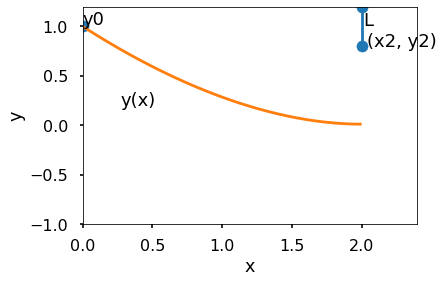

Trial 431: L = 0.50, angle = 0.50 pi, (x1, y1) = (2.00, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


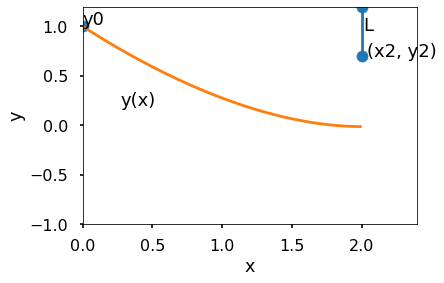

Trial 432: L = 0.60, angle = 0.50 pi, (x1, y1) = (2.00, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


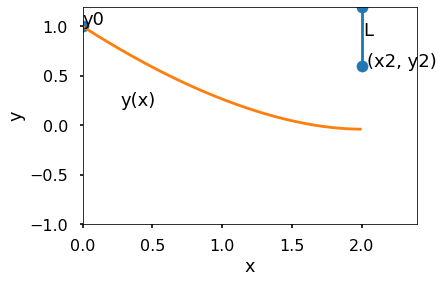

Trial 433: L = 0.10, angle = 0.00 pi, (x1, y1) = (2.25, 0.60)


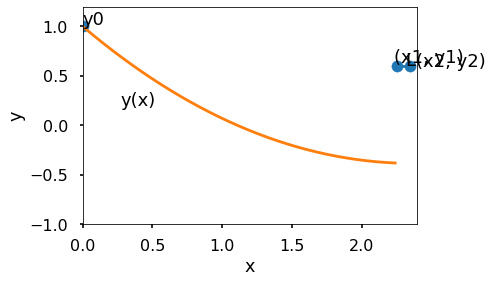

Trial 434: L = 0.20, angle = 0.00 pi, (x1, y1) = (2.25, 0.60)


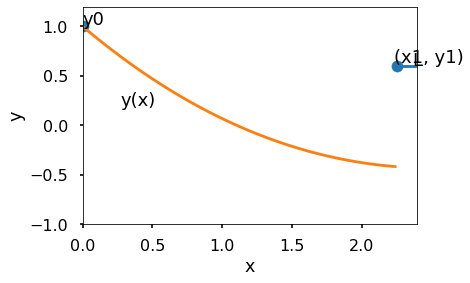

Trial 435: L = 0.30, angle = 0.00 pi, (x1, y1) = (2.25, 0.60)


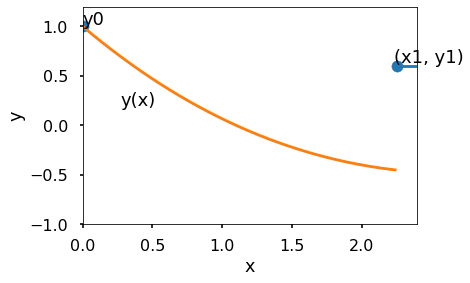

Trial 436: L = 0.40, angle = 0.00 pi, (x1, y1) = (2.25, 0.60)


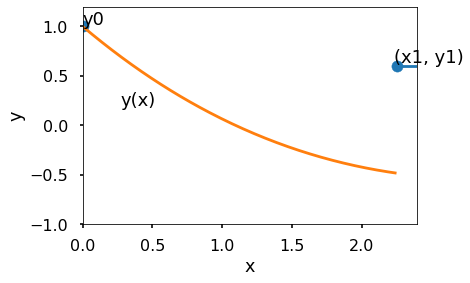

Trial 437: L = 0.50, angle = 0.00 pi, (x1, y1) = (2.25, 0.60)


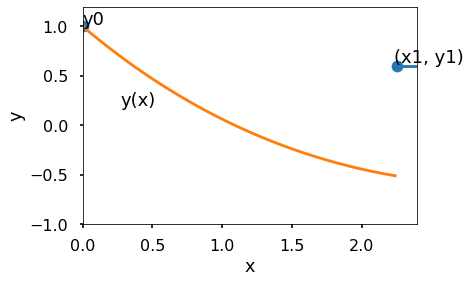

Trial 438: L = 0.60, angle = 0.00 pi, (x1, y1) = (2.25, 0.60)


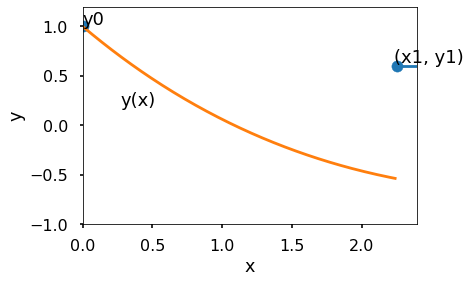

Trial 439: L = 0.10, angle = 0.17 pi, (x1, y1) = (2.25, 0.60)


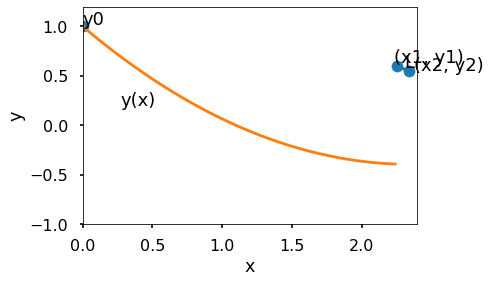

Trial 440: L = 0.20, angle = 0.17 pi, (x1, y1) = (2.25, 0.60)


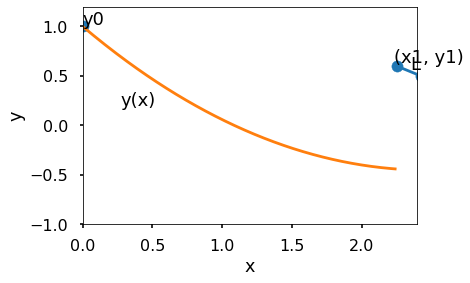

Trial 441: L = 0.30, angle = 0.17 pi, (x1, y1) = (2.25, 0.60)


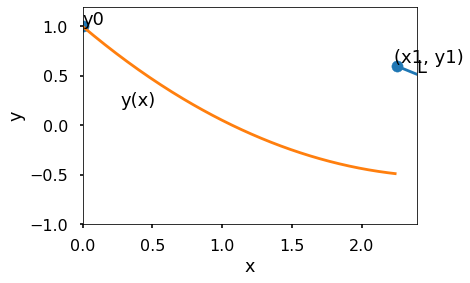

Trial 442: L = 0.40, angle = 0.17 pi, (x1, y1) = (2.25, 0.60)


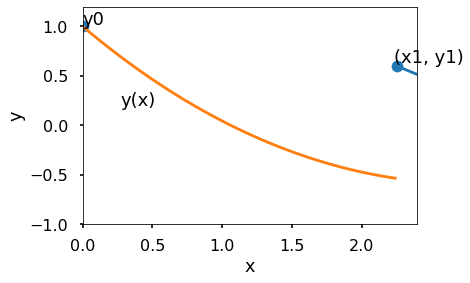

Trial 443: L = 0.50, angle = 0.17 pi, (x1, y1) = (2.25, 0.60)


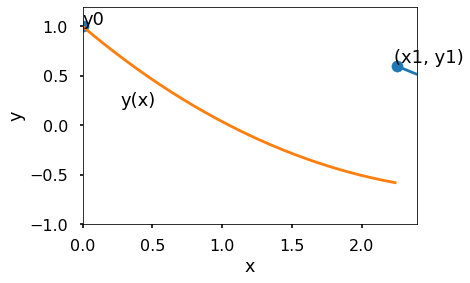

Trial 444: L = 0.60, angle = 0.17 pi, (x1, y1) = (2.25, 0.60)


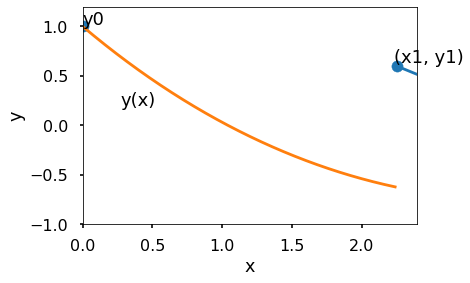

Trial 445: L = 0.10, angle = 0.20 pi, (x1, y1) = (2.25, 0.60)


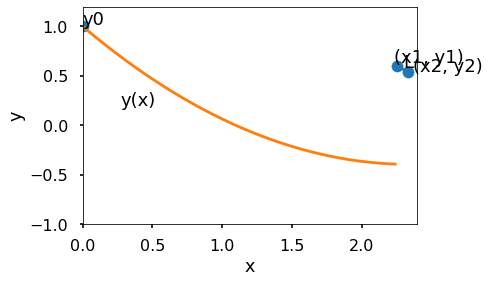

Trial 446: L = 0.20, angle = 0.20 pi, (x1, y1) = (2.25, 0.60)


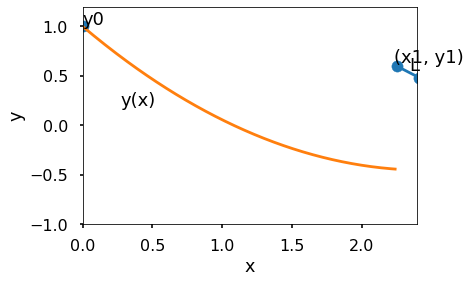

Trial 447: L = 0.30, angle = 0.20 pi, (x1, y1) = (2.25, 0.60)


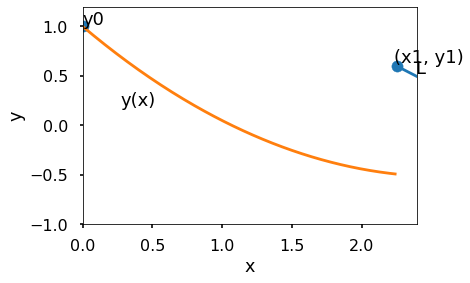

Trial 448: L = 0.40, angle = 0.20 pi, (x1, y1) = (2.25, 0.60)


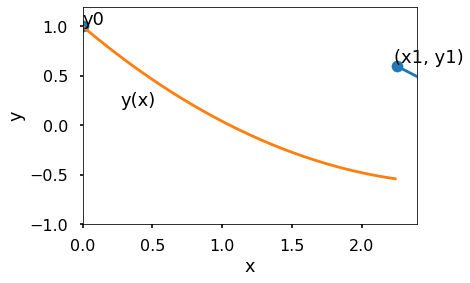

Trial 449: L = 0.50, angle = 0.20 pi, (x1, y1) = (2.25, 0.60)


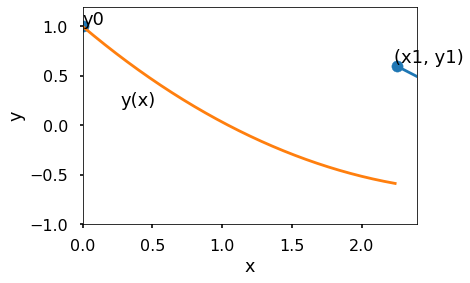

Trial 450: L = 0.60, angle = 0.20 pi, (x1, y1) = (2.25, 0.60)


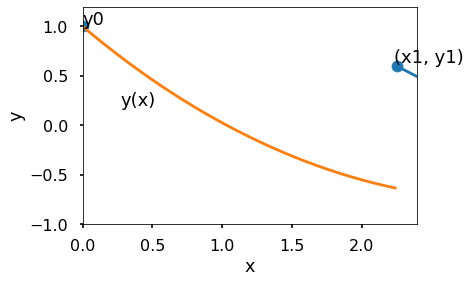

Trial 451: L = 0.10, angle = 0.25 pi, (x1, y1) = (2.25, 0.60)


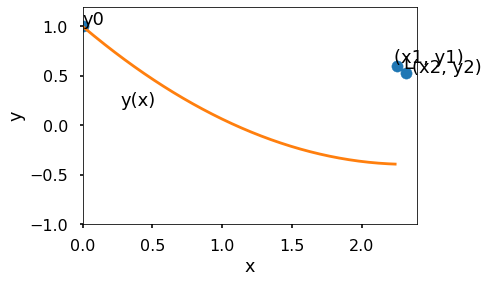

Trial 452: L = 0.20, angle = 0.25 pi, (x1, y1) = (2.25, 0.60)


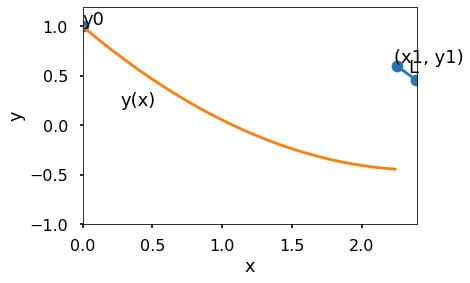

Trial 453: L = 0.30, angle = 0.25 pi, (x1, y1) = (2.25, 0.60)


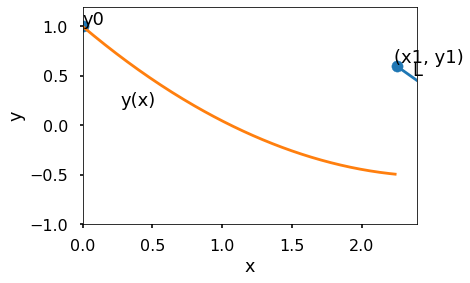

Trial 454: L = 0.40, angle = 0.25 pi, (x1, y1) = (2.25, 0.60)


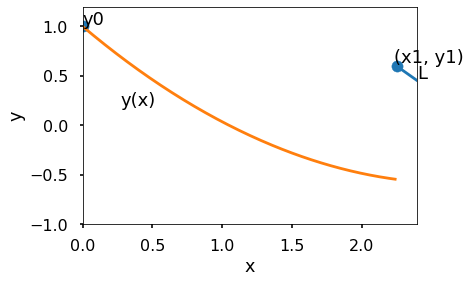

Trial 455: L = 0.50, angle = 0.25 pi, (x1, y1) = (2.25, 0.60)


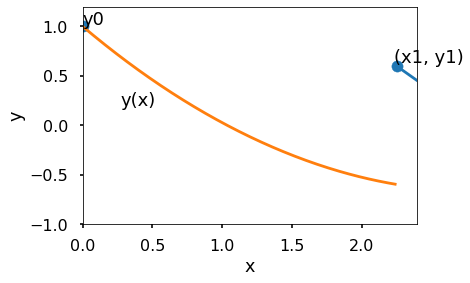

Trial 456: L = 0.60, angle = 0.25 pi, (x1, y1) = (2.25, 0.60)


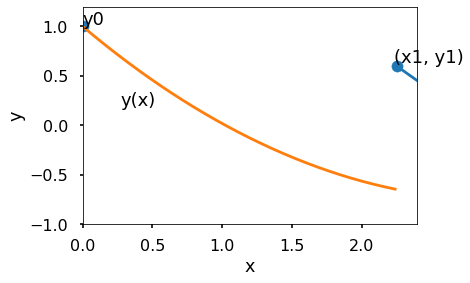

Trial 457: L = 0.10, angle = 0.33 pi, (x1, y1) = (2.25, 0.60)


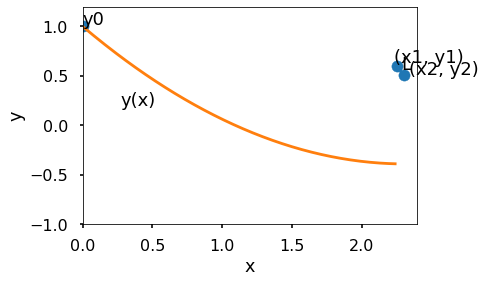

Trial 458: L = 0.20, angle = 0.33 pi, (x1, y1) = (2.25, 0.60)


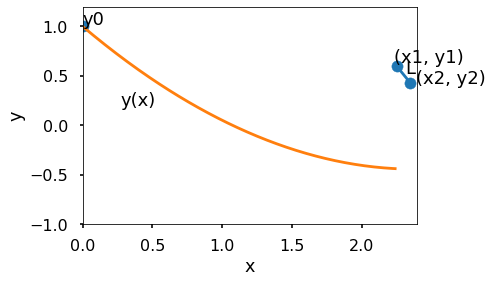

Trial 459: L = 0.30, angle = 0.33 pi, (x1, y1) = (2.25, 0.60)


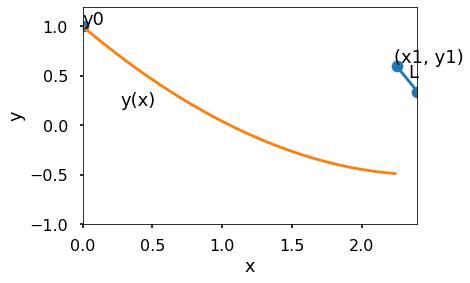

Trial 460: L = 0.40, angle = 0.33 pi, (x1, y1) = (2.25, 0.60)


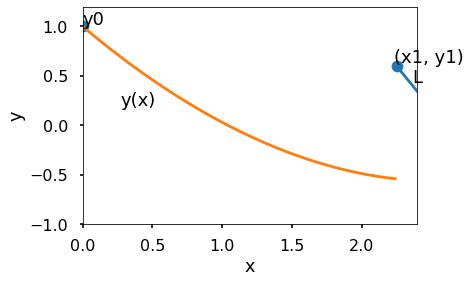

Trial 461: L = 0.50, angle = 0.33 pi, (x1, y1) = (2.25, 0.60)


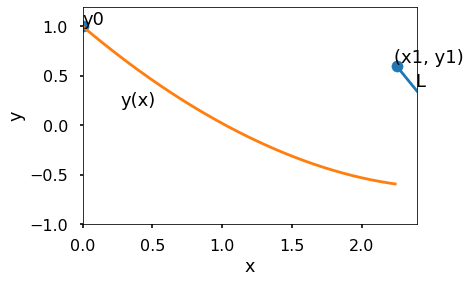

Trial 462: L = 0.60, angle = 0.33 pi, (x1, y1) = (2.25, 0.60)


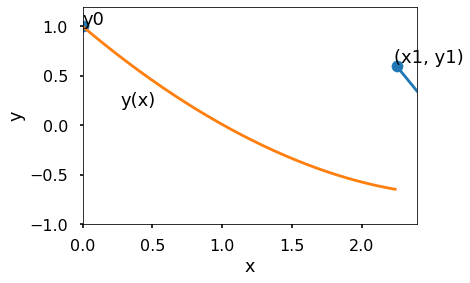

Trial 463: L = 0.10, angle = 0.50 pi, (x1, y1) = (2.25, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


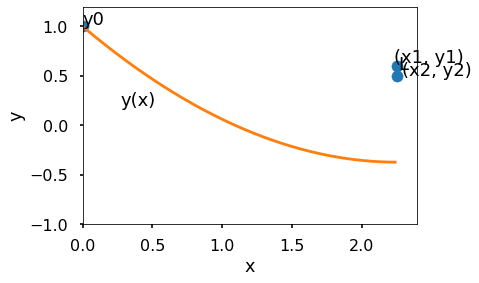

Trial 464: L = 0.20, angle = 0.50 pi, (x1, y1) = (2.25, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


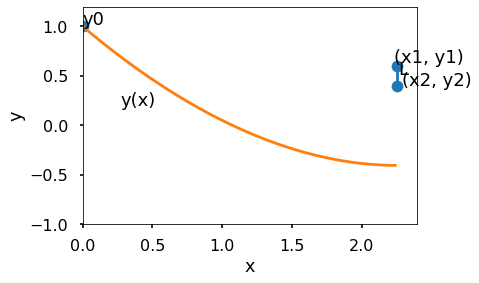

Trial 465: L = 0.30, angle = 0.50 pi, (x1, y1) = (2.25, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


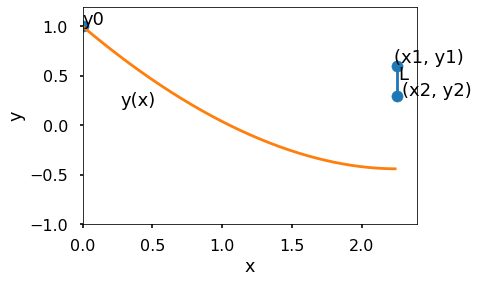

Trial 466: L = 0.40, angle = 0.50 pi, (x1, y1) = (2.25, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


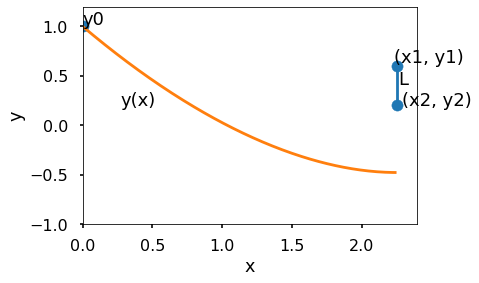

/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


Trial 467: L = 0.50, angle = 0.50 pi, (x1, y1) = (2.25, 0.60)


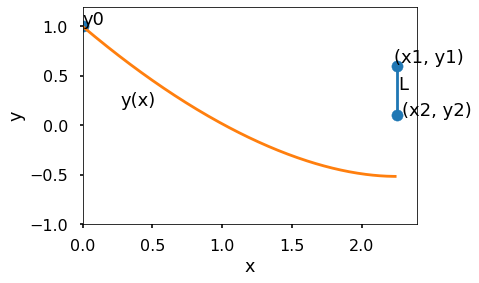

Trial 468: L = 0.60, angle = 0.50 pi, (x1, y1) = (2.25, 0.60)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


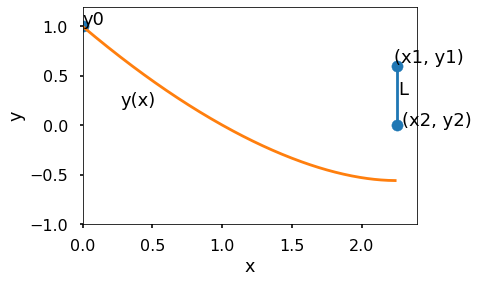

Trial 469: L = 0.10, angle = 0.00 pi, (x1, y1) = (2.25, 0.80)


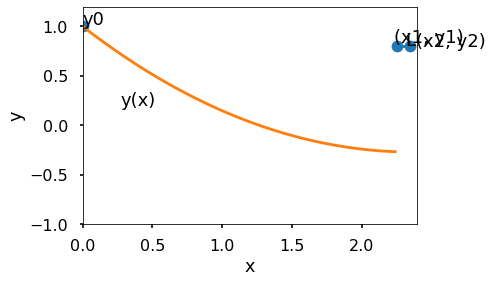

Trial 470: L = 0.20, angle = 0.00 pi, (x1, y1) = (2.25, 0.80)


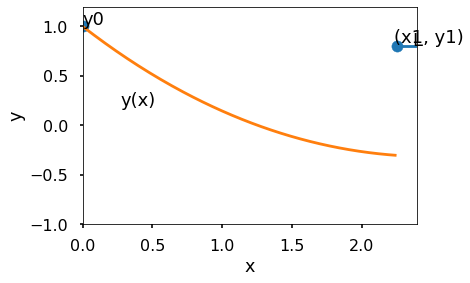

Trial 471: L = 0.30, angle = 0.00 pi, (x1, y1) = (2.25, 0.80)


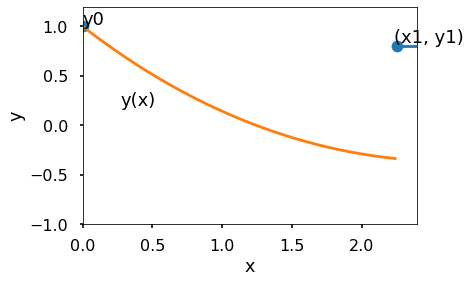

Trial 472: L = 0.40, angle = 0.00 pi, (x1, y1) = (2.25, 0.80)


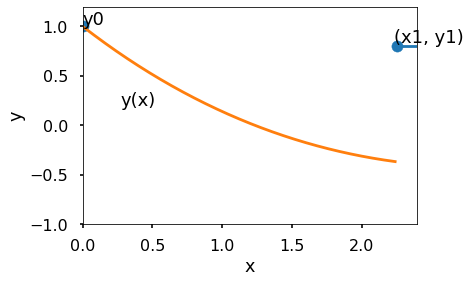

Trial 473: L = 0.50, angle = 0.00 pi, (x1, y1) = (2.25, 0.80)


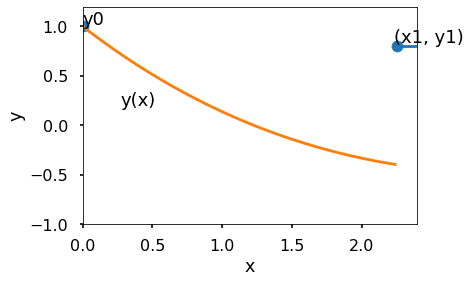

Trial 474: L = 0.60, angle = 0.00 pi, (x1, y1) = (2.25, 0.80)


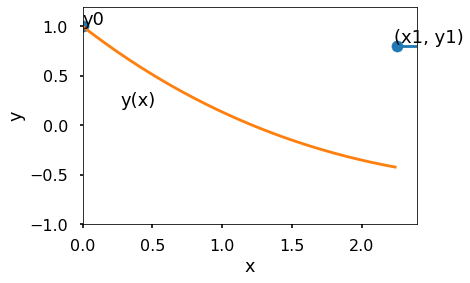

Trial 475: L = 0.10, angle = 0.17 pi, (x1, y1) = (2.25, 0.80)


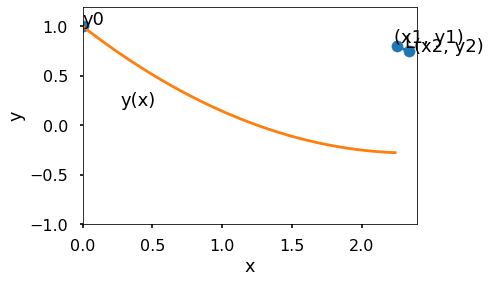

Trial 476: L = 0.20, angle = 0.17 pi, (x1, y1) = (2.25, 0.80)


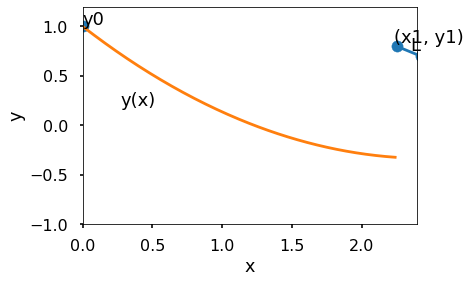

Trial 477: L = 0.30, angle = 0.17 pi, (x1, y1) = (2.25, 0.80)


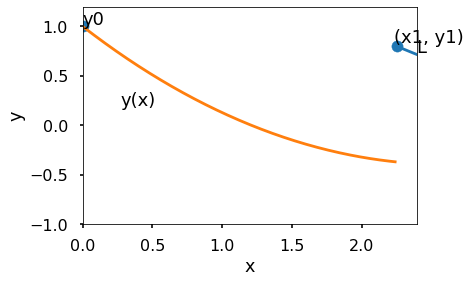

Trial 478: L = 0.40, angle = 0.17 pi, (x1, y1) = (2.25, 0.80)


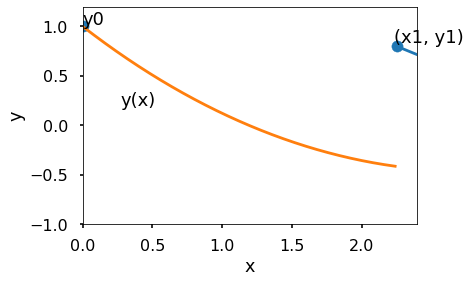

Trial 479: L = 0.50, angle = 0.17 pi, (x1, y1) = (2.25, 0.80)


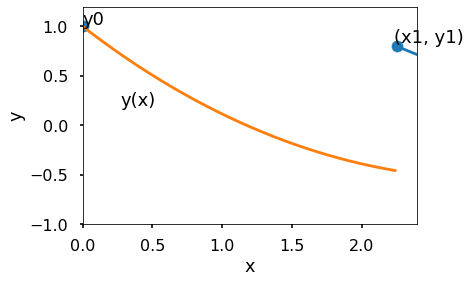

Trial 480: L = 0.60, angle = 0.17 pi, (x1, y1) = (2.25, 0.80)


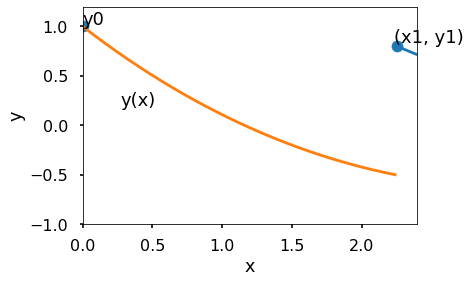

Trial 481: L = 0.10, angle = 0.20 pi, (x1, y1) = (2.25, 0.80)


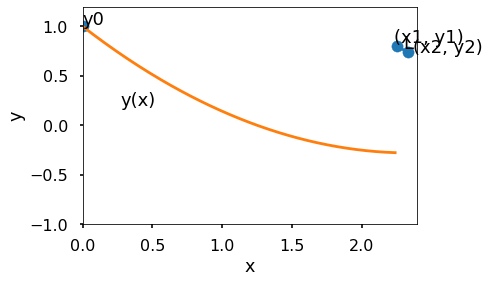

Trial 482: L = 0.20, angle = 0.20 pi, (x1, y1) = (2.25, 0.80)


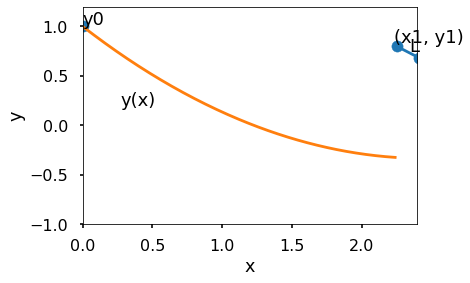

Trial 483: L = 0.30, angle = 0.20 pi, (x1, y1) = (2.25, 0.80)


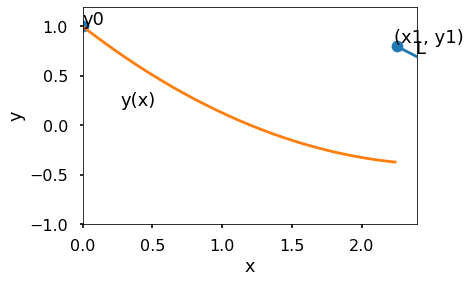

Trial 484: L = 0.40, angle = 0.20 pi, (x1, y1) = (2.25, 0.80)


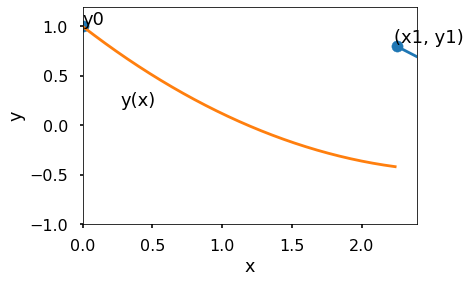

Trial 485: L = 0.50, angle = 0.20 pi, (x1, y1) = (2.25, 0.80)


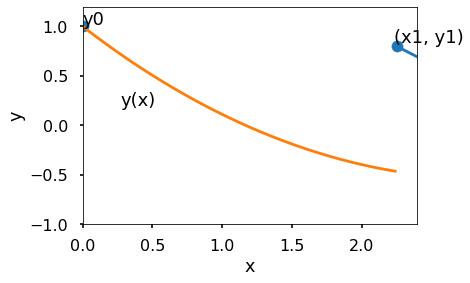

Trial 486: L = 0.60, angle = 0.20 pi, (x1, y1) = (2.25, 0.80)


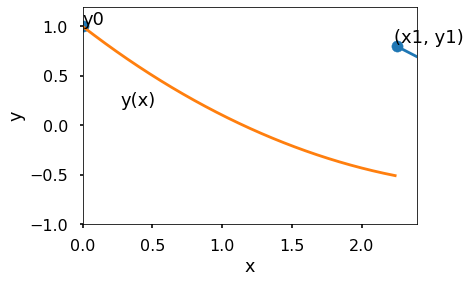

Trial 487: L = 0.10, angle = 0.25 pi, (x1, y1) = (2.25, 0.80)


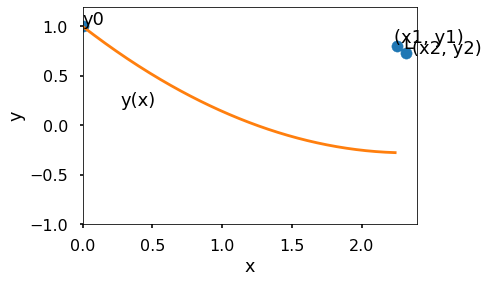

Trial 488: L = 0.20, angle = 0.25 pi, (x1, y1) = (2.25, 0.80)


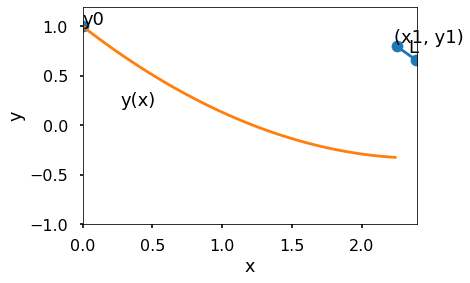

Trial 489: L = 0.30, angle = 0.25 pi, (x1, y1) = (2.25, 0.80)


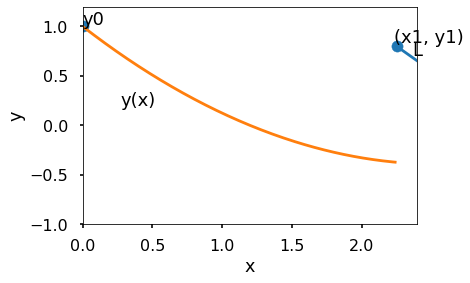

Trial 490: L = 0.40, angle = 0.25 pi, (x1, y1) = (2.25, 0.80)


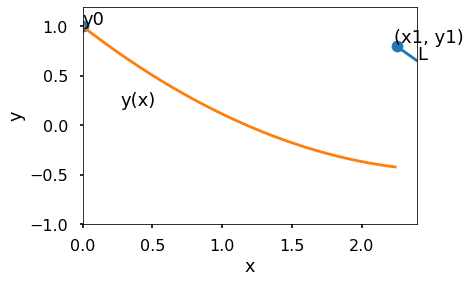

Trial 491: L = 0.50, angle = 0.25 pi, (x1, y1) = (2.25, 0.80)


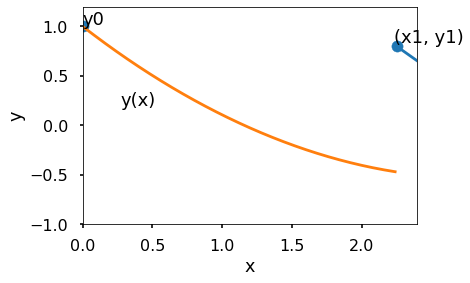

Trial 492: L = 0.60, angle = 0.25 pi, (x1, y1) = (2.25, 0.80)


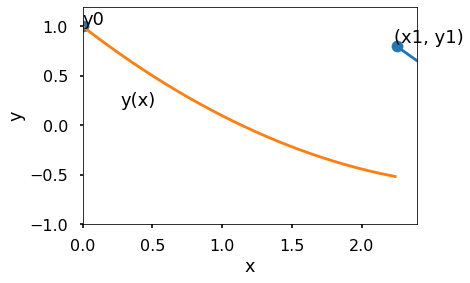

Trial 493: L = 0.10, angle = 0.33 pi, (x1, y1) = (2.25, 0.80)


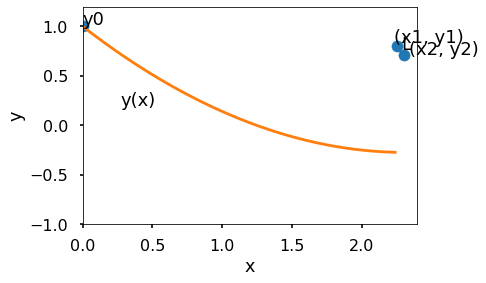

Trial 494: L = 0.20, angle = 0.33 pi, (x1, y1) = (2.25, 0.80)


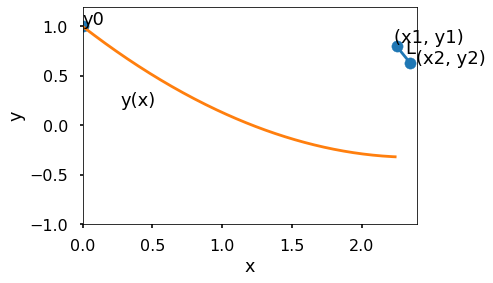

Trial 495: L = 0.30, angle = 0.33 pi, (x1, y1) = (2.25, 0.80)


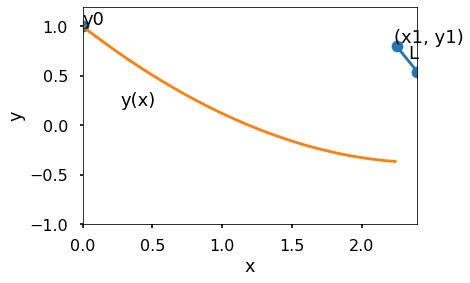

Trial 496: L = 0.40, angle = 0.33 pi, (x1, y1) = (2.25, 0.80)


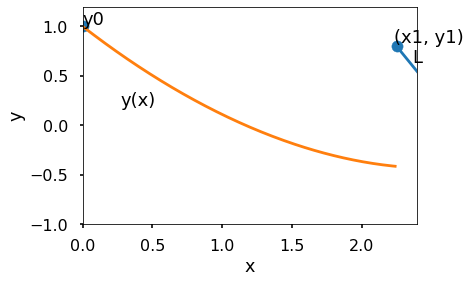

Trial 497: L = 0.50, angle = 0.33 pi, (x1, y1) = (2.25, 0.80)


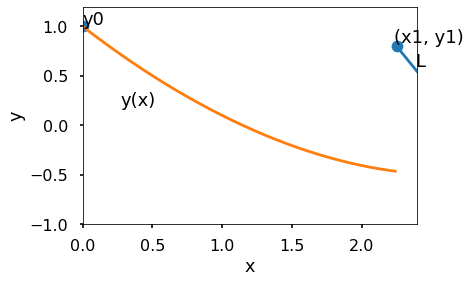

Trial 498: L = 0.60, angle = 0.33 pi, (x1, y1) = (2.25, 0.80)


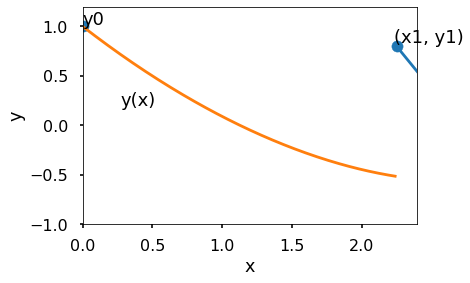

Trial 499: L = 0.10, angle = 0.50 pi, (x1, y1) = (2.25, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


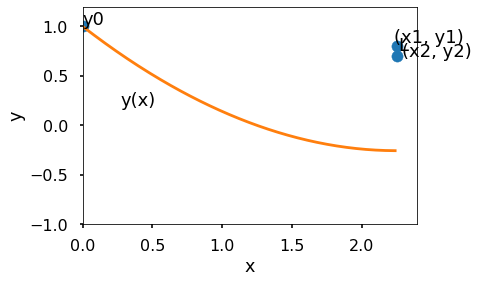

Trial 500: L = 0.20, angle = 0.50 pi, (x1, y1) = (2.25, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


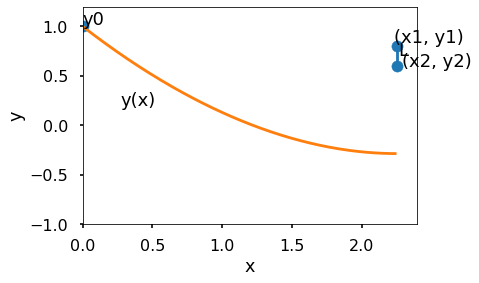

Trial 501: L = 0.30, angle = 0.50 pi, (x1, y1) = (2.25, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


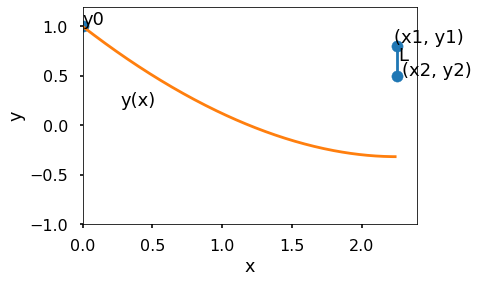

Trial 502: L = 0.40, angle = 0.50 pi, (x1, y1) = (2.25, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


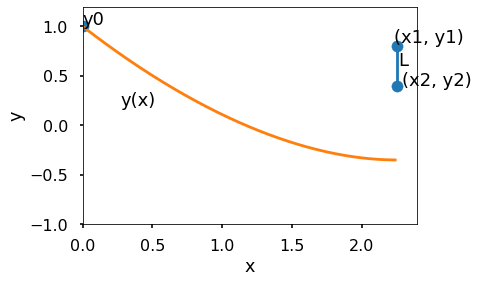

Trial 503: L = 0.50, angle = 0.50 pi, (x1, y1) = (2.25, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


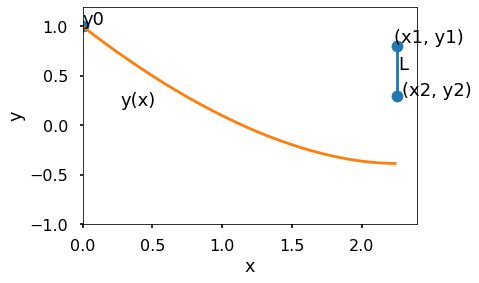

Trial 504: L = 0.60, angle = 0.50 pi, (x1, y1) = (2.25, 0.80)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


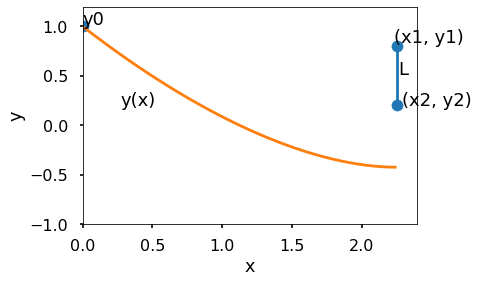

Trial 505: L = 0.10, angle = 0.00 pi, (x1, y1) = (2.25, 1.00)


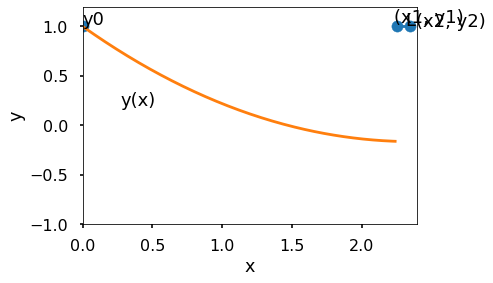

Trial 506: L = 0.20, angle = 0.00 pi, (x1, y1) = (2.25, 1.00)


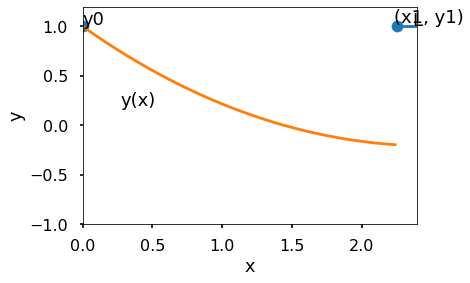

Trial 507: L = 0.30, angle = 0.00 pi, (x1, y1) = (2.25, 1.00)


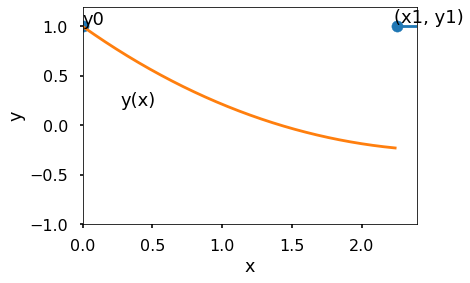

Trial 508: L = 0.40, angle = 0.00 pi, (x1, y1) = (2.25, 1.00)


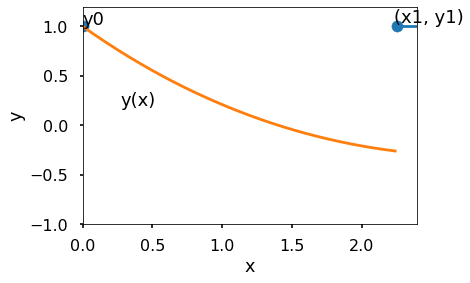

Trial 509: L = 0.50, angle = 0.00 pi, (x1, y1) = (2.25, 1.00)


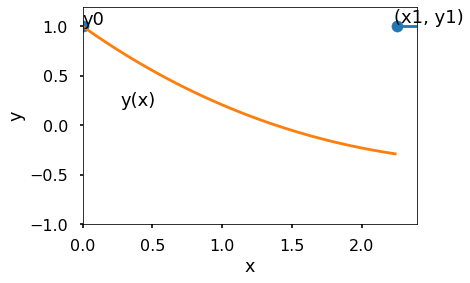

Trial 510: L = 0.60, angle = 0.00 pi, (x1, y1) = (2.25, 1.00)


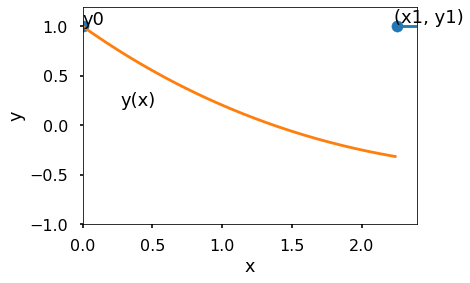

Trial 511: L = 0.10, angle = 0.17 pi, (x1, y1) = (2.25, 1.00)


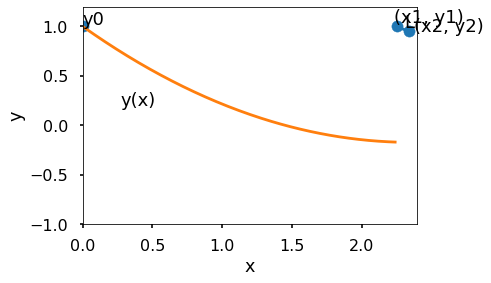

Trial 512: L = 0.20, angle = 0.17 pi, (x1, y1) = (2.25, 1.00)


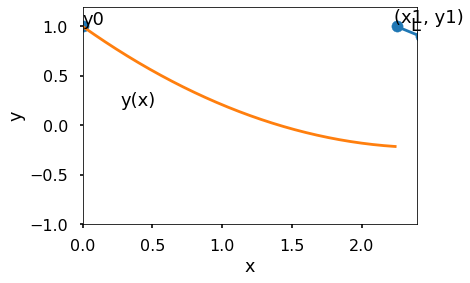

Trial 513: L = 0.30, angle = 0.17 pi, (x1, y1) = (2.25, 1.00)


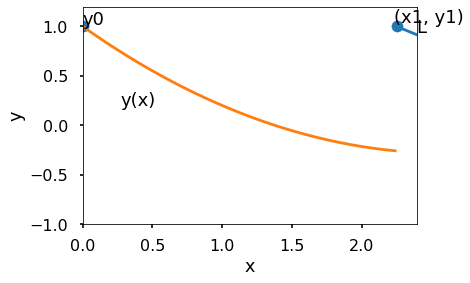

Trial 514: L = 0.40, angle = 0.17 pi, (x1, y1) = (2.25, 1.00)


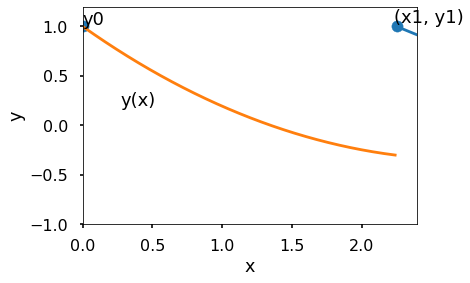

Trial 515: L = 0.50, angle = 0.17 pi, (x1, y1) = (2.25, 1.00)


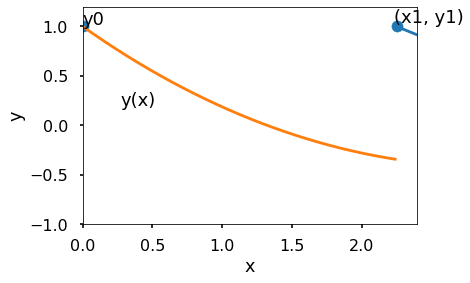

Trial 516: L = 0.60, angle = 0.17 pi, (x1, y1) = (2.25, 1.00)


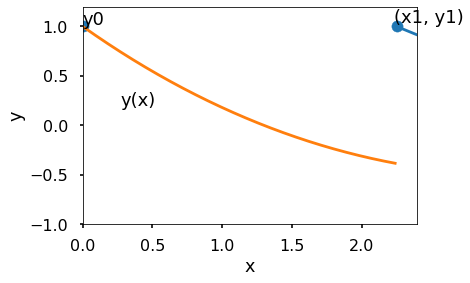

Trial 517: L = 0.10, angle = 0.20 pi, (x1, y1) = (2.25, 1.00)


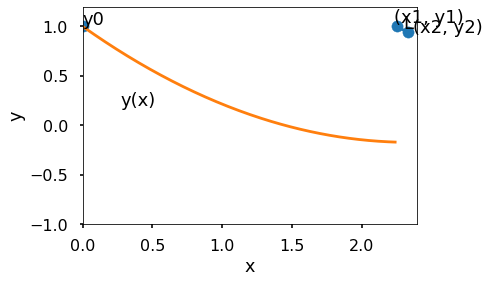

Trial 518: L = 0.20, angle = 0.20 pi, (x1, y1) = (2.25, 1.00)


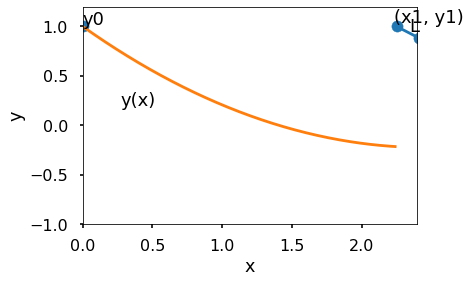

Trial 519: L = 0.30, angle = 0.20 pi, (x1, y1) = (2.25, 1.00)


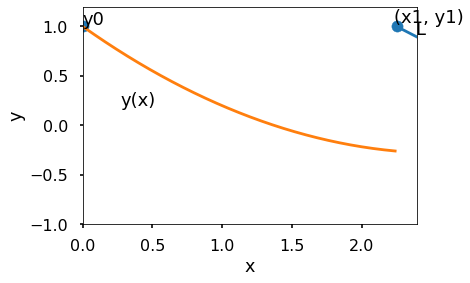

Trial 520: L = 0.40, angle = 0.20 pi, (x1, y1) = (2.25, 1.00)


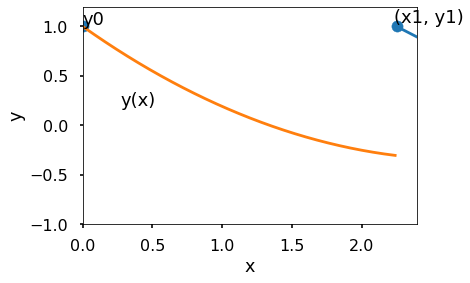

Trial 521: L = 0.50, angle = 0.20 pi, (x1, y1) = (2.25, 1.00)


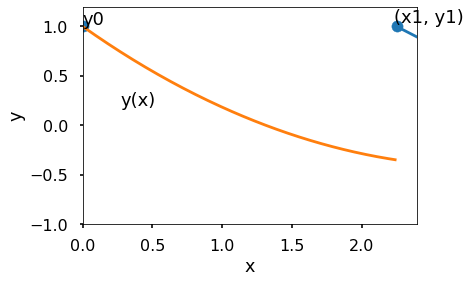

Trial 522: L = 0.60, angle = 0.20 pi, (x1, y1) = (2.25, 1.00)


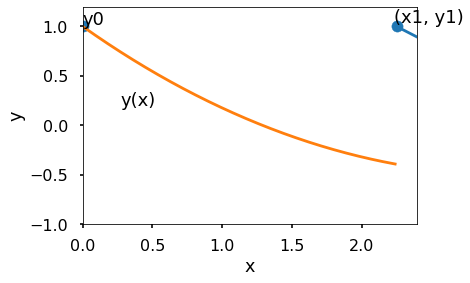

Trial 523: L = 0.10, angle = 0.25 pi, (x1, y1) = (2.25, 1.00)


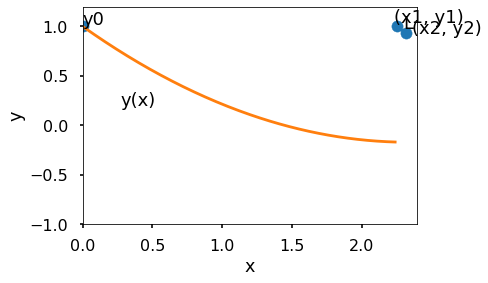

Trial 524: L = 0.20, angle = 0.25 pi, (x1, y1) = (2.25, 1.00)


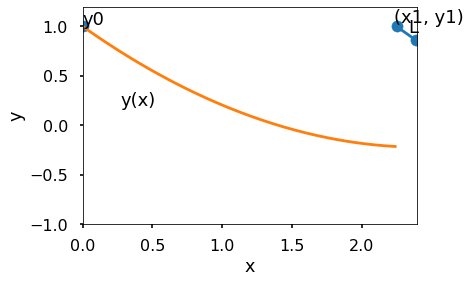

Trial 525: L = 0.30, angle = 0.25 pi, (x1, y1) = (2.25, 1.00)


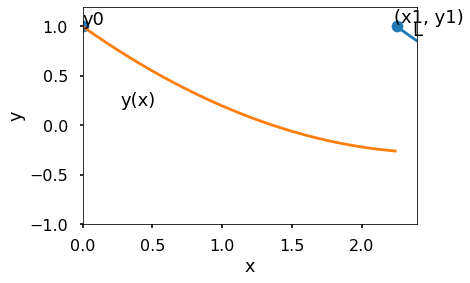

Trial 526: L = 0.40, angle = 0.25 pi, (x1, y1) = (2.25, 1.00)


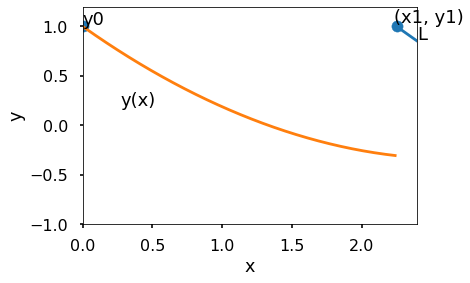

Trial 527: L = 0.50, angle = 0.25 pi, (x1, y1) = (2.25, 1.00)


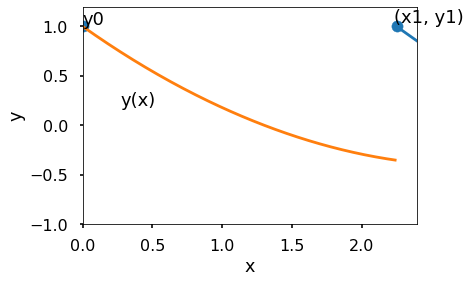

Trial 528: L = 0.60, angle = 0.25 pi, (x1, y1) = (2.25, 1.00)


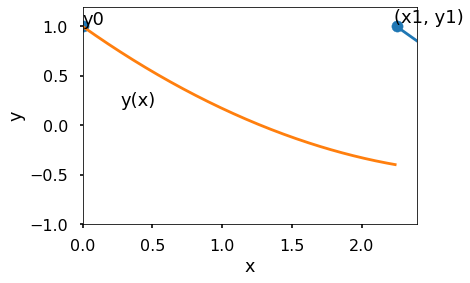

Trial 529: L = 0.10, angle = 0.33 pi, (x1, y1) = (2.25, 1.00)


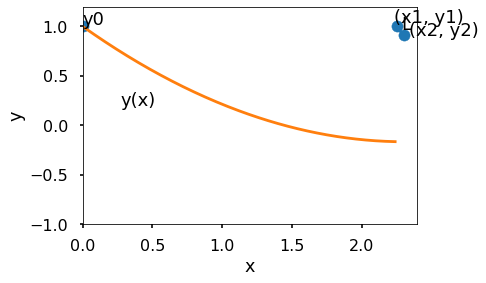

Trial 530: L = 0.20, angle = 0.33 pi, (x1, y1) = (2.25, 1.00)


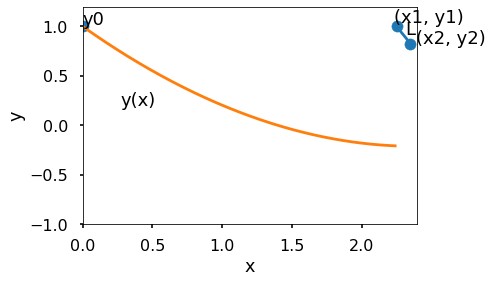

Trial 531: L = 0.30, angle = 0.33 pi, (x1, y1) = (2.25, 1.00)


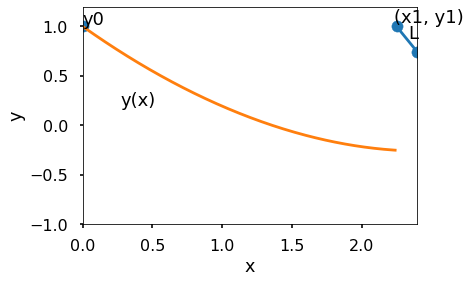

Trial 532: L = 0.40, angle = 0.33 pi, (x1, y1) = (2.25, 1.00)


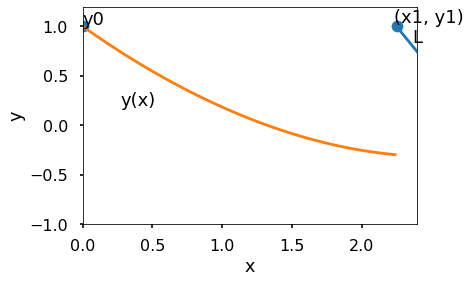

Trial 533: L = 0.50, angle = 0.33 pi, (x1, y1) = (2.25, 1.00)


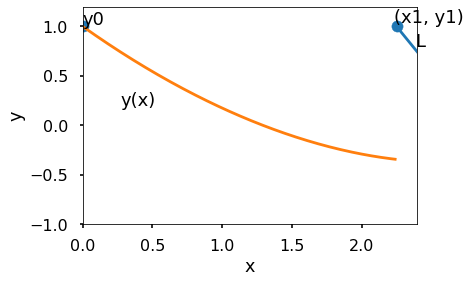

Trial 534: L = 0.60, angle = 0.33 pi, (x1, y1) = (2.25, 1.00)


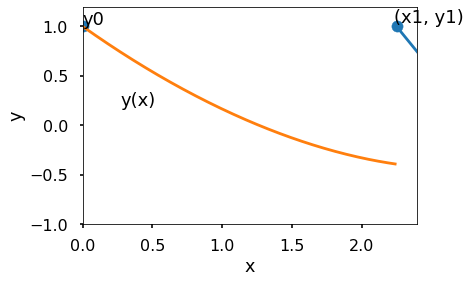

Trial 535: L = 0.10, angle = 0.50 pi, (x1, y1) = (2.25, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


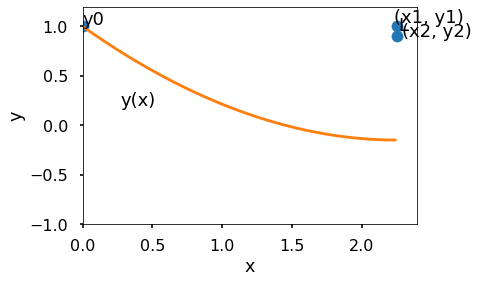

Trial 536: L = 0.20, angle = 0.50 pi, (x1, y1) = (2.25, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


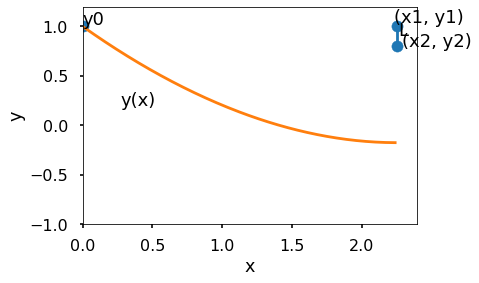

Trial 537: L = 0.30, angle = 0.50 pi, (x1, y1) = (2.25, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


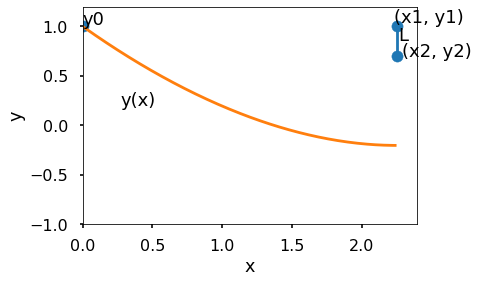

Trial 538: L = 0.40, angle = 0.50 pi, (x1, y1) = (2.25, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


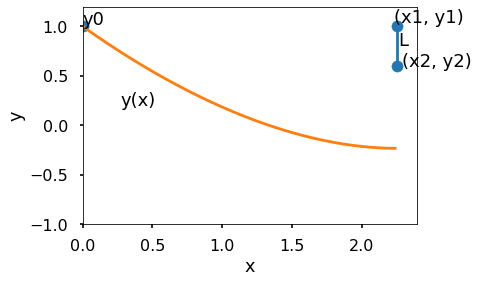

Trial 539: L = 0.50, angle = 0.50 pi, (x1, y1) = (2.25, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


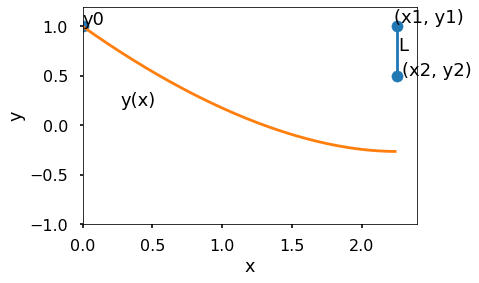

Trial 540: L = 0.60, angle = 0.50 pi, (x1, y1) = (2.25, 1.00)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


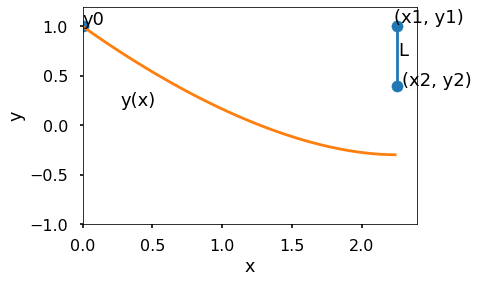

Trial 541: L = 0.10, angle = 0.00 pi, (x1, y1) = (2.25, 1.20)


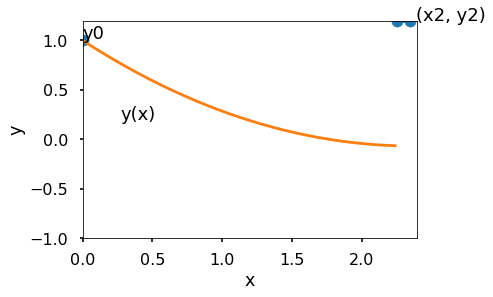

Trial 542: L = 0.20, angle = 0.00 pi, (x1, y1) = (2.25, 1.20)


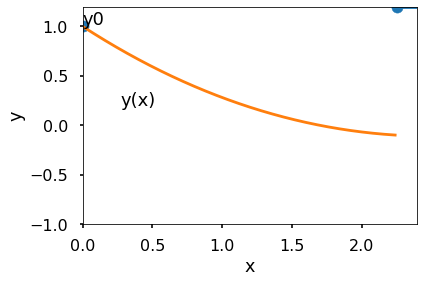

Trial 543: L = 0.30, angle = 0.00 pi, (x1, y1) = (2.25, 1.20)


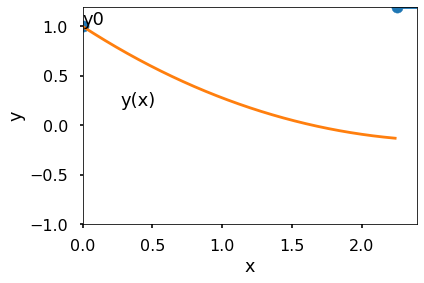

Trial 544: L = 0.40, angle = 0.00 pi, (x1, y1) = (2.25, 1.20)


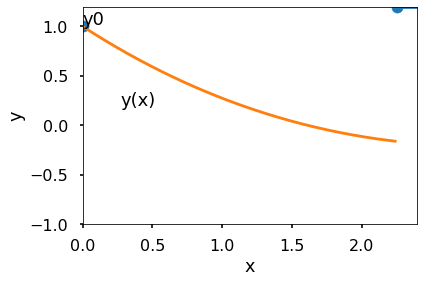

Trial 545: L = 0.50, angle = 0.00 pi, (x1, y1) = (2.25, 1.20)


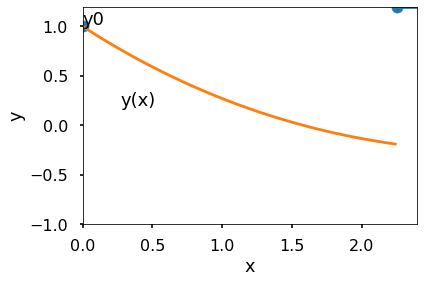

Trial 546: L = 0.60, angle = 0.00 pi, (x1, y1) = (2.25, 1.20)


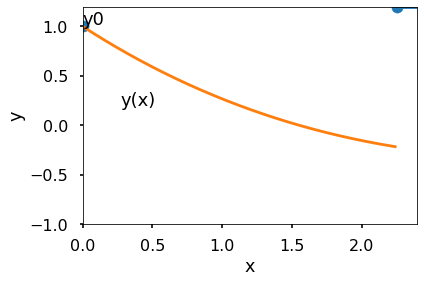

Trial 547: L = 0.10, angle = 0.17 pi, (x1, y1) = (2.25, 1.20)


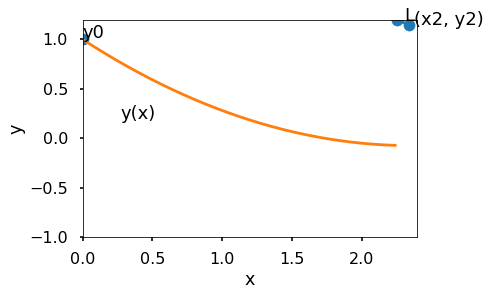

Trial 548: L = 0.20, angle = 0.17 pi, (x1, y1) = (2.25, 1.20)


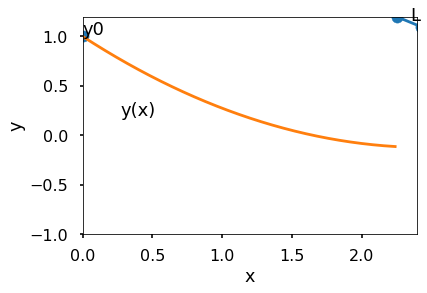

Trial 549: L = 0.30, angle = 0.17 pi, (x1, y1) = (2.25, 1.20)


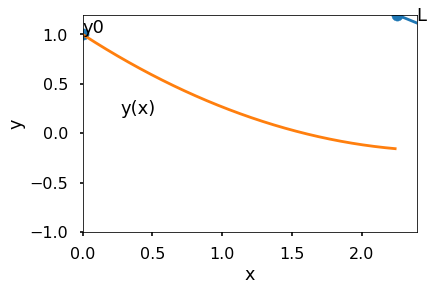

Trial 550: L = 0.40, angle = 0.17 pi, (x1, y1) = (2.25, 1.20)


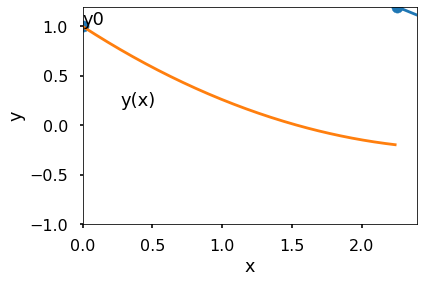

Trial 551: L = 0.50, angle = 0.17 pi, (x1, y1) = (2.25, 1.20)


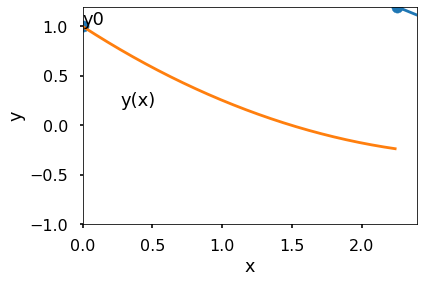

Trial 552: L = 0.60, angle = 0.17 pi, (x1, y1) = (2.25, 1.20)


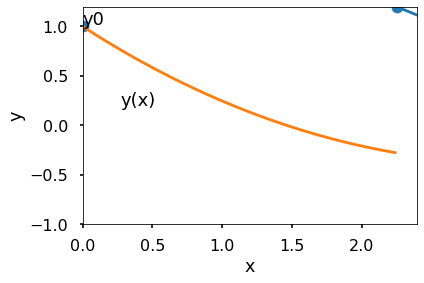

Trial 553: L = 0.10, angle = 0.20 pi, (x1, y1) = (2.25, 1.20)


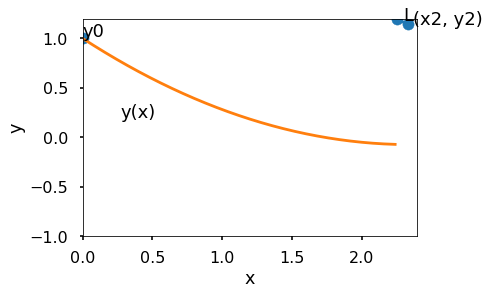

Trial 554: L = 0.20, angle = 0.20 pi, (x1, y1) = (2.25, 1.20)


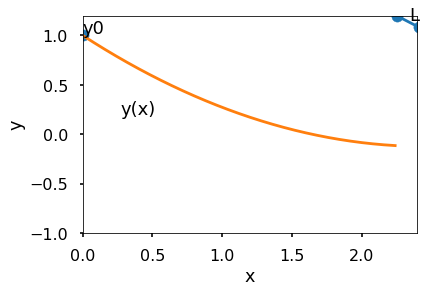

Trial 555: L = 0.30, angle = 0.20 pi, (x1, y1) = (2.25, 1.20)


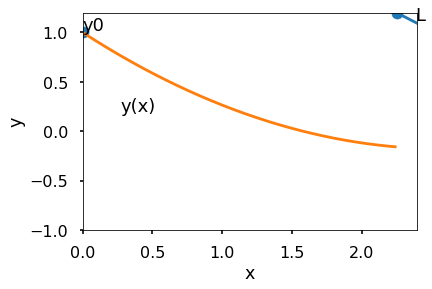

Trial 556: L = 0.40, angle = 0.20 pi, (x1, y1) = (2.25, 1.20)


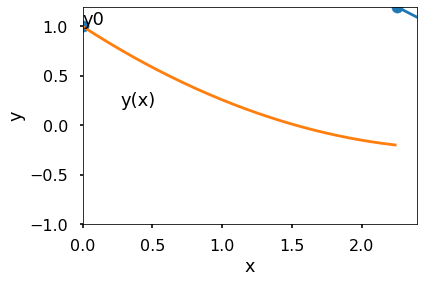

Trial 557: L = 0.50, angle = 0.20 pi, (x1, y1) = (2.25, 1.20)


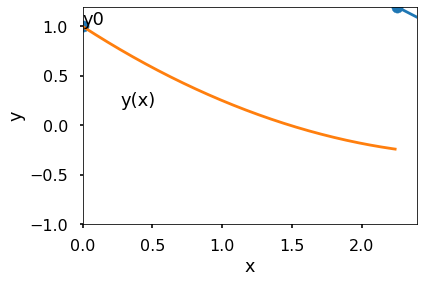

Trial 558: L = 0.60, angle = 0.20 pi, (x1, y1) = (2.25, 1.20)


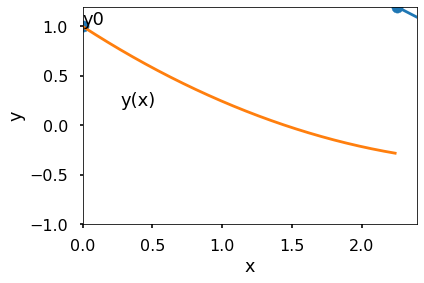

Trial 559: L = 0.10, angle = 0.25 pi, (x1, y1) = (2.25, 1.20)


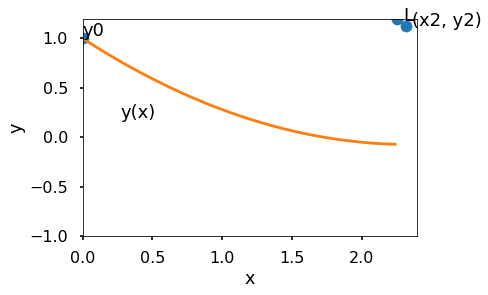

Trial 560: L = 0.20, angle = 0.25 pi, (x1, y1) = (2.25, 1.20)


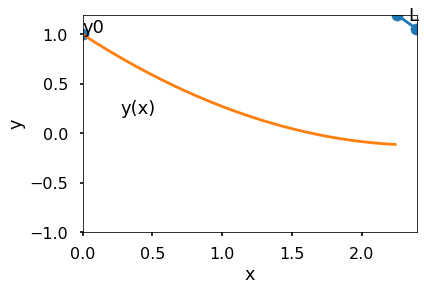

Trial 561: L = 0.30, angle = 0.25 pi, (x1, y1) = (2.25, 1.20)


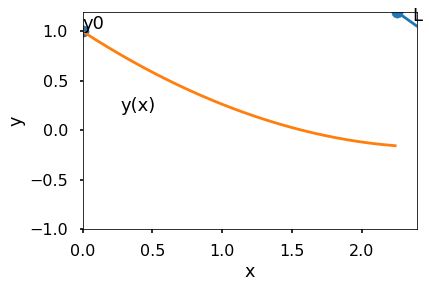

Trial 562: L = 0.40, angle = 0.25 pi, (x1, y1) = (2.25, 1.20)


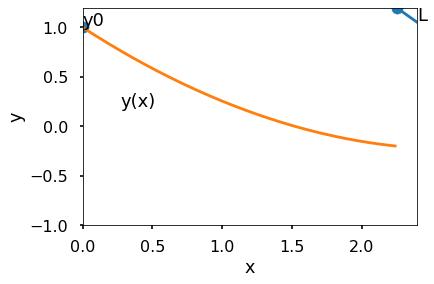

Trial 563: L = 0.50, angle = 0.25 pi, (x1, y1) = (2.25, 1.20)


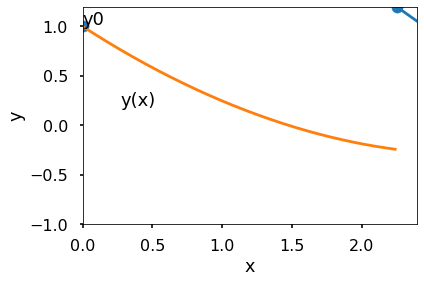

Trial 564: L = 0.60, angle = 0.25 pi, (x1, y1) = (2.25, 1.20)


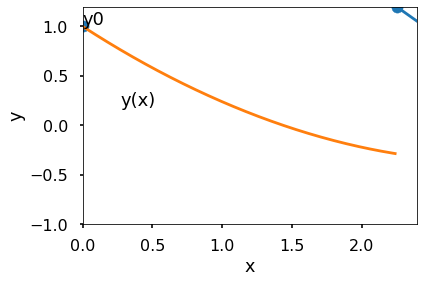

Trial 565: L = 0.10, angle = 0.33 pi, (x1, y1) = (2.25, 1.20)


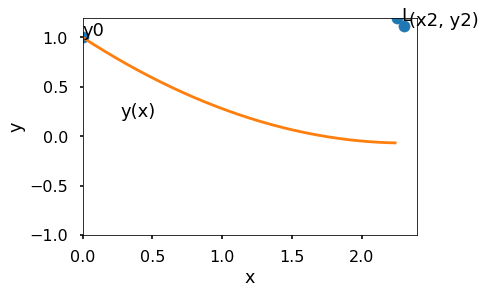

Trial 566: L = 0.20, angle = 0.33 pi, (x1, y1) = (2.25, 1.20)


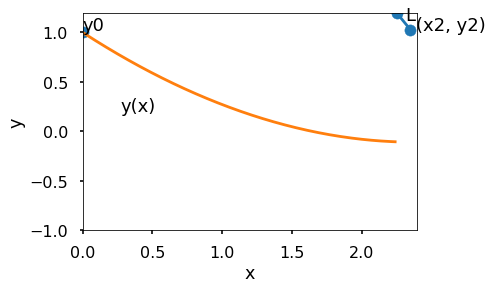

Trial 567: L = 0.30, angle = 0.33 pi, (x1, y1) = (2.25, 1.20)


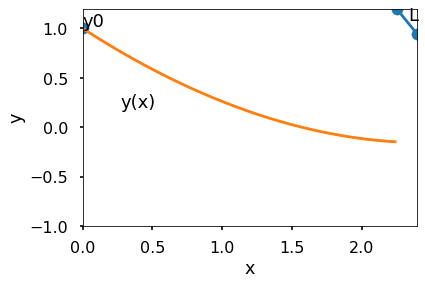

Trial 568: L = 0.40, angle = 0.33 pi, (x1, y1) = (2.25, 1.20)


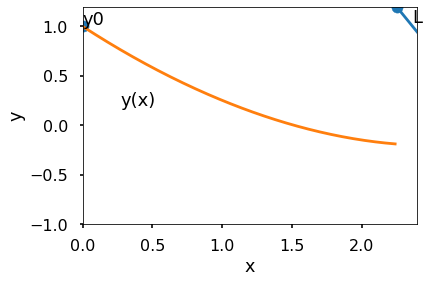

Trial 569: L = 0.50, angle = 0.33 pi, (x1, y1) = (2.25, 1.20)


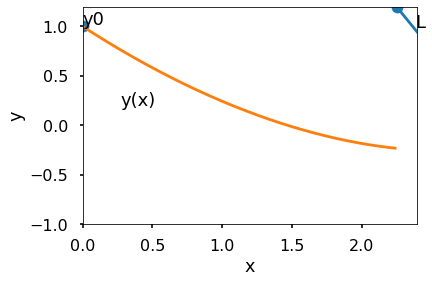

Trial 570: L = 0.60, angle = 0.33 pi, (x1, y1) = (2.25, 1.20)


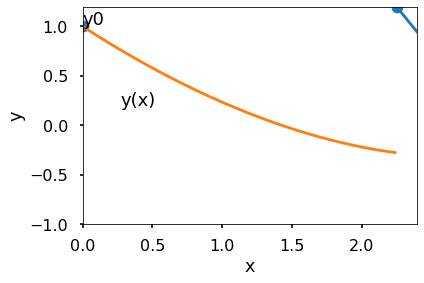

Trial 571: L = 0.10, angle = 0.50 pi, (x1, y1) = (2.25, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


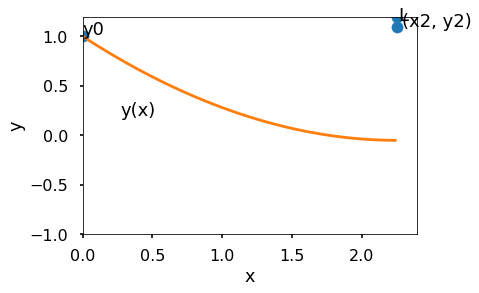

Trial 572: L = 0.20, angle = 0.50 pi, (x1, y1) = (2.25, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


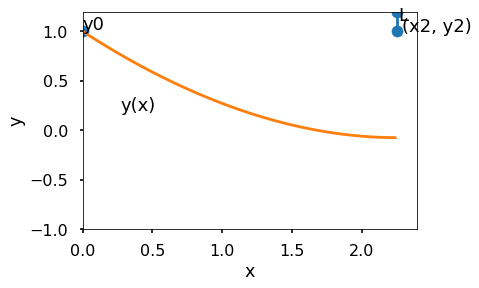

Trial 573: L = 0.30, angle = 0.50 pi, (x1, y1) = (2.25, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


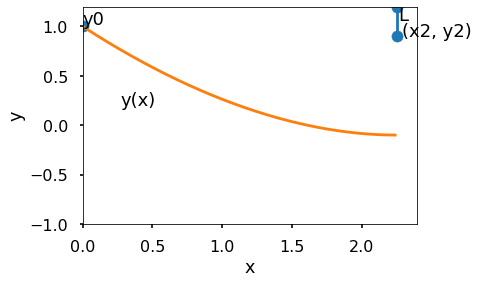

Trial 574: L = 0.40, angle = 0.50 pi, (x1, y1) = (2.25, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


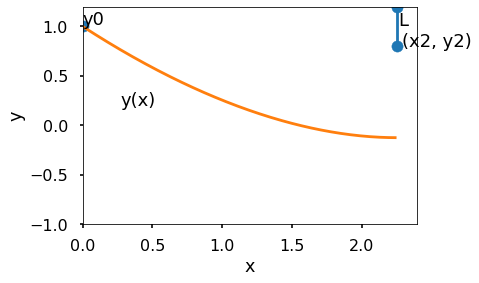

Trial 575: L = 0.50, angle = 0.50 pi, (x1, y1) = (2.25, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


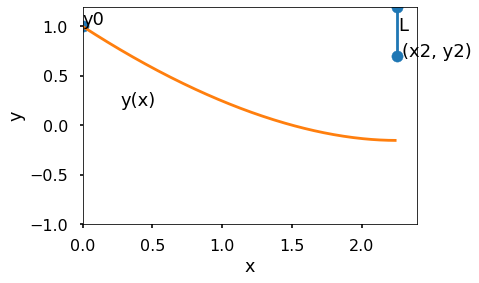

Trial 576: L = 0.60, angle = 0.50 pi, (x1, y1) = (2.25, 1.20)


/var/folders/38/y3n53lvj5gx0jp7zp97n7px80000gn/T/ipykernel_3027/1938954788.py:18: RuntimeWarning: divide by zero encountered in true_divide
  F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))


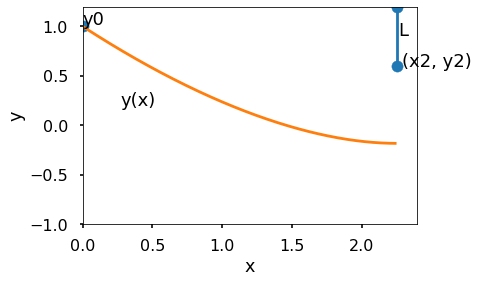

In [35]:
y0 = 1.0

i = 1
for x1 in [1.5, 1.75, 2.0, 2.25]:
    for y1 in [0.6, 0.8, 1.0, 1.2]:
        for theta in [0, np.pi / 6, np.pi / 5, np.pi / 4, np. pi / 3, np.pi / 2]:
            for L in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]:
                
                # Mirror parameters
                x2 = x1 + L * np.cos(theta)
                y2 = y1 - L * np.sin(theta)
                x_values = [x1, x2]
                y_values = [y1, y2]

                print("Trial " + str(i) + ": L = {Len:.2f}, angle = {Ang:.2f} pi, (x1, y1) = ({x1:.2f}, {y1:.2f})".format(Len = L, Ang = theta / np.pi, x1 = x1, y1 = y1))
                
                # Define ODE
                F = lambda x, y: - 1 / np.tan(np.pi/4 + 1/2 * np.arctan(((x0 * L - x * L) * y1 + x * L * y2 - x0 * L * y) / ((x0 * L - x * L) * x1 + x * L * x2 - x0 * L * x)))
                 
                # Numerically solve ODE
                dt = 0.01

                t_eval = np.arange(0, x1, dt)
                sol = solve_ivp(F, [0, x1], [y0], t_eval=t_eval)

                plt.figure(figsize = (6, 4))
                plt.plot(x_values, y_values)
                plt.plot(sol.t, sol.y[0])
                plt.xlabel('x')
                plt.ylabel('y')
                plt.scatter([0, x1, x2], [y0, y1, y2])
                plt.annotate("y0", (0, y0+0.02), fontsize = 18)
                plt.annotate("(x1, y1)", (x1 - 0.02, y1 + 0.04), fontsize = 18)
                plt.annotate("(x2, y2)", (x2 + 0.04, y2), fontsize = 18)
                plt.annotate("L", ((x1 + x2 + 0.02) /2, (y1 + y2 + 0.02)/2), fontsize = 18)
                plt.annotate("y(x)", (0.27, 0.2), fontsize = 18)
                plt.xlim(0, 2.4)
                plt.ylim(-1, 1.2)
                plt.show()
                
                width = x2
                height = max(y0, y1) - min(sol.y[0])
                
                # Summary values 
                
                statistics[i - 1, 0] = i
                statistics[i - 1, 1] = L
                statistics[i - 1, 2] = theta
                statistics[i - 1, 3] = x1
                statistics[i - 1, 4] = y1
                statistics[i - 1, 5] = width
                statistics[i - 1, 6] = height
                statistics[i - 1, 7] = width / L
                statistics[i - 1, 8] = height / L 
                
                i += 1





In [36]:
df_statistics = pd.DataFrame(statistics, columns = ['Trial', 'Length', 'Angle', 'x1', 'y1', 'Width', 'Height', 'Width Ratio', 'Height Ratio'])

In [42]:
df_statistics.head(50)

,Trial,Length,Angle,x1,y1,Width,Height,Width Ratio,Height Ratio
0,1.0,0.1,0.000000,1.5,0.6,1.600000,1.001015,16.000000,10.010147
1,2.0,0.2,0.000000,1.5,0.6,1.700000,1.025451,8.500000,5.127257
2,3.0,0.3,0.000000,1.5,0.6,1.800000,1.047743,6.000000,3.492478
3,4.0,0.4,0.000000,1.5,0.6,1.900000,1.068132,4.750000,2.670330
4,5.0,0.5,0.000000,1.5,0.6,2.000000,1.086833,4.000000,2.173667
5,6.0,0.6,0.000000,1.5,0.6,2.100000,1.104039,3.500000,1.840065
6,7.0,0.1,0.523599,1.5,0.6,1.586603,1.009205,15.866025,10.092054
7,8.0,0.2,0.523599,1.5,0.6,1.673205,1.043211,8.366025,5.216056
8,9.0,0.3,0.523599,1.5,0.6,1.759808,1.076088,5.866025,3.586959
9,10.0,0.4,0.523599,1.5,0.6,1.846410,1.107771,4.616025,2.769427
